## **Setup**


In this section, we will set up the computing environment required to perform the analyses for this part. The setup involves using both Shell and R within this notebook.

First, we will create a function called shell_call to execute shell scripts directly.

Following that, we will install and configure R to ensure it is ready for use

**R** is a programming language and software environment for data analysis, statistics, and graphics. It is widely used in scientific research, machine learning, bioinformatics, and data science due to its flexibility and vast collection of packages. R is open source and offers tools for data manipulation, statistical modeling, visualization, and integration with other languages ​​such as Python and C++.

In [ ]:
# https://stackoverflow.com/questions/70025153/how-to-access-the-shell-in-google-colab-when-running-the-r-kernel
shell_call <- function(command, ...) {
  result <- system(command, intern = TRUE, ...)
  cat(paste0(result, collapse = "\n"))
}

loadPackages = function(pkgs){
  myrequire = function(...){
    suppressWarnings(suppressMessages(suppressPackageStartupMessages(require(...))))
  }
  ok = sapply(pkgs, require, character.only=TRUE, quietly=TRUE)
  if (!all(ok)){
    message("There are missing packages: ", paste(pkgs[!ok], collapse=", "))
  }
}

## Setup R2U
download.file("https://github.com/eddelbuettel/r2u/raw/master/inst/scripts/add_cranapt_jammy.sh",
              "add_cranapt_jammy.sh")
Sys.chmod("add_cranapt_jammy.sh", "0755")
shell_call("./add_cranapt_jammy.sh")
bspm::enable()
options(bspm.version.check=FALSE)
shell_call("rm add_cranapt_jammy.sh")

## Install the R packages
cranPkgs2Install = c("BiocManager", "ggpubr", "Seurat", "cowplot",
                     "Rtsne", "hdf5r", "clustree", "harmony")
install.packages(cranPkgs2Install, ask=FALSE, update=TRUE, quietly=TRUE)
biocPkgs2Install = c("clusterProfiler", "preprocessCore", "rols",
                     "scDblFinder","clusterExperiment", "SingleR",
                     "celldex", "org.Hs.eg.db", "miloR", "scran", "scater")
BiocManager::install(biocPkgs2Install, ask=FALSE, update=TRUE, quietly=TRUE)

14 packages can be upgraded. Run 'apt list --upgradable' to see them.
Reading package lists...
Building dependency tree...
Reading state information...
ca-certificates is already the newest version (20240203~22.04.1).
gnupg is already the newest version (2.2.27-3ubuntu2.5).
gnupg set to manually installed.
wget is already the newest version (1.21.2-2ubuntu1.1).
0 upgraded, 0 newly installed, 0 to remove and 14 not upgraded.
-----BEGIN PGP PUBLIC KEY BLOCK-----

mQINBFM+sY8BEADA70T+U0/2WNjOTLvytuXLvBC4vgA8hYvOaBS1cL3d8lu4mwr4
W84/6p4v/mXle/0eIO2D2g+XfK72ZHZxpS+bb7yPxrkCDLGxwUd/khtTJHSbbKFo
J73AsABflMe+8qv+E74+QTiXErTCNioFRz18sa0EvOnEAiokau6TZVYY2z9YjBNI
yEjTi+z+g8c1RL6VmrFEpTicTpafOLbkRyw0VKnAKG7Ytp3Ksc1G9/IAoKw3Q9La
0DJb5iX6hyB7+PNid6htK4LtPKZ2dNSrnRvNNkjj5BgcM2AT1hmxbzHNzIVmPoKA
CQFrkdjog3/PcyjdtZG7cfoSDXrbIAZeAa2ngLv9C/DJatVDd6maPOe66gLo7+As
ErMvO9vtiouqLdurW+Lhx0jFW9Ca3g1taLfbSDyS3X1mOGWcisbQvBqkIuoDQTeS
V4Z04wrwTZ1HtweKG/s5fmPtZNGWVI5YNRLIwdmbGzFTMPu2XTAOd+xSK2H+46Kh
Sh4kFeP6pBh5No

Tracing function "install.packages" in package "utils"

'getOption("repos")' replaces Bioconductor standard repositories, see
'help("repositories", package = "BiocManager")' for details.
Replacement repositories:
    CRAN: https://cran.rstudio.com

Bioconductor version 3.22 (BiocManager 1.30.27), R 4.5.2 (2025-10-31)

Installing package(s) 'BiocVersion', 'clusterProfiler', 'preprocessCore',
  'rols', 'scDblFinder', 'clusterExperiment', 'SingleR', 'celldex',
  'org.Hs.eg.db', 'miloR', 'scran', 'scater'

Old packages: 'cpp11', 'rappdirs', 'xfun', 'xml2'



#### Packages in R

**Packages in R**

A package in R is a collection of functions, data, and documentation bundled together. Packages help extend the core functionality of R by providing specific tools for different tasks, such as data analysis, graph visualization, advanced statistics, etc.


**Install**

Before using a package, it must be installed in your environment. This is done only once (unless it needs to be updated) with the command:

In [ ]:
install.packages("name_of_package")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message:
“package ‘name_of_package’ is not available for this version of R

A version of this package for your version of R might be available elsewhere,
see the ideas at
https://cran.r-project.org/doc/manuals/r-patched/R-admin.html#Installing-packages”


**Library**

Once installed, the package needs to be loaded in each session in which you want to use it.
The command checks whether the mentioned package is installed. If the package is installed, it is loaded and ready for use. If the package is not installed, R returns an error.

This is where the library() function comes in:

In [ ]:
library(name_of_package)

ERROR: Error in library(name_of_package): there is no package called ‘name_of_package’


In [ ]:
# To simplify package loading, we created the loadPackages() function.
# But, if you don't have the function, you should use 'library(name_of_package)'
pkgs = c("Rtsne", "Seurat", "tidyverse", "cowplot",
         "scDblFinder", "clustree", "preprocessCore",
         "clusterProfiler", "celldex", "miloR", "scran", "scater")
loadPackages(pkgs)


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.6
✔ forcats   1.0.1     ✔ stringr   1.6.0
✔ ggplot2   4.0.1     ✔ tibble    3.3.1
✔ lubridate 1.9.4     ✔ tidyr     1.3.2
✔ purrr     1.2.1     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp



Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollap

Then, load the libraries that you previously installed.

* [**Rtsne:**](https://jmlr.org/papers/volume9/vandermaaten08a/vandermaaten08a.pdf) package in R implements the t-SNE technique for dimensionality reduction and data visualization.
* [**Seurat:**](https://satijalab.org/seurat/articles/get_started.html) Seurat is an R package designed for QC, analysis, and exploration of single cell RNA-seq data.
* [**scDblFinder:**](https://bioconductor.org/packages/release/bioc/html/scDblFinder.html) The scDblFinder package gathers various methods for the detection and handling of doublets/multiplets in single-cell sequencing data (i.e. multiple cells captured within the same droplet or reaction volume)
* [**Cowplot:**](https://wilkelab.org/cowplot/articles/introduction.html) Provides various features that help with creating publication-quality figures with [`ggplot2`](https://ggplot2.tidyverse.org/index.html), such as a set of themes, functions to align plots and arrange them into complex compound figures, and functions that make it easy to annotate plots and or mix plots with images.
* [**clustree:**](https://lazappi.github.io/clustree/) This visualization shows the relationships between clusters at multiple resolutions, allowing researchers to see how samples move as the number of clusters increases.
* [**PreprocessCore:**](https://bioconductor.org/packages/release/bioc/html/preprocessCore.html) A collection of pre-processing functions

## Data input, sparse UMI-count matrix

Reference: https://www.nature.com/articles/s41591-020-0901-9

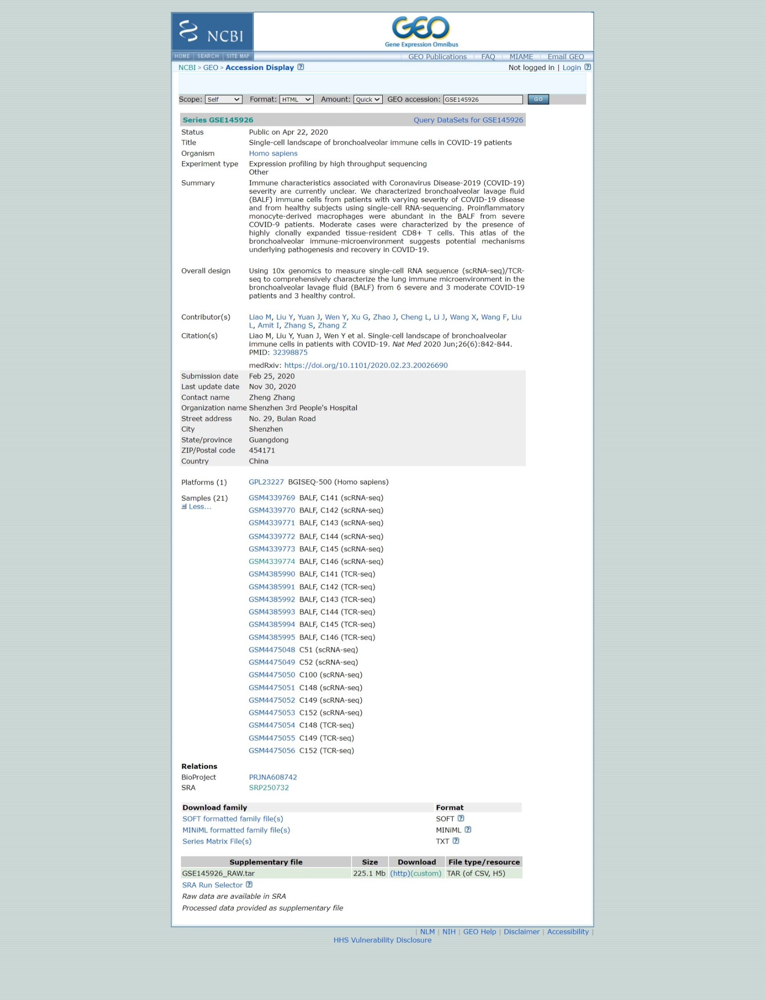

Download the GEO's raw data

In [ ]:
# This command in R downloads a file from the internet and saves it locally
download.file('https://www.ncbi.nlm.nih.gov/geo/download/?acc=GSE145926&format=file','GSE145926_RAW.tar')

# This command uses the shell_call custom function to execute a shell command.
# The tar -xf command is used to extract the contents of a compressed file in .tar format.
shell_call("tar -xf GSE145926_RAW.tar")

# rm is a shell command to delete files, to free up space and keep the directory organized.
shell_call("rm GSE145926_RAW.tar")

# ls is used to list files.
# -l: Display file details (permissions, owner, size, date, etc.).
# -h: Format file sizes in a human-readable format, such as KB, MB, or GB.
shell_call("ls -lh")

total 226M
-rw-rw-r-- 1 4710 5007  21M Feb 19  2020 GSM4339769_C141_filtered_feature_bc_matrix.h5
-rw-rw-r-- 1 4710 5007  21M Feb 19  2020 GSM4339770_C142_filtered_feature_bc_matrix.h5
-rw-rw-r-- 1 4710 5007  52M Feb 19  2020 GSM4339771_C143_filtered_feature_bc_matrix.h5
-rw-rw-r-- 1 4710 5007 4.1M Feb 19  2020 GSM4339772_C144_filtered_feature_bc_matrix.h5
-rw-rw-r-- 1 4710 5007  30M Feb 19  2020 GSM4339773_C145_filtered_feature_bc_matrix.h5
-rw-rw-r-- 1 4710 5007 6.1M Feb 19  2020 GSM4339774_C146_filtered_feature_bc_matrix.h5
-rw-rw-r-- 1 4710 5007  93K Mar  5  2020 GSM4385990_C141_filtered_contig_annotations.csv.gz
-rw-rw-r-- 1 4710 5007  96K Mar  5  2020 GSM4385991_C142_filtered_contig_annotations.csv.gz
-rw-rw-r-- 1 4710 5007 175K Mar  5  2020 GSM4385992_C143_filtered_contig_annotations.csv.gz
-rw-rw-r-- 1 4710 5007  12K Mar  5  2020 GSM4385993_C144_filtered_contig_annotations.csv.gz
-rw-rw-r-- 1 4710 5007  33K Mar  5  2020 GSM4385994_C145_filtered_contig_annotations.csv.gz
-rw-rw-

Separate the scRNA and TCRseq files.

In [ ]:
# Create a directory
shell_call("mkdir -p TCRseq")

# mv is the shell command to move or rename files.
# The pattern *_filtered_contig_annotations.csv.gz uses the wildcard character * to find all files that end with _filtered_contig_annotations.csv.gz.
shell_call("mv *_filtered_contig_annotations.csv.gz TCRseq/")

shell_call("mkdir -p scRNAseq")

# This command moves all files that have _filtered_ in their name to the scRNAseq/ directory.
shell_call("mv *_filtered_* scRNAseq/")
shell_call("ls -lh")

total 12K
drwxr-xr-x 1 root root 4.0K Dec 11 14:34 sample_data
drwxr-xr-x 2 root root 4.0K Jan 19 23:26 scRNAseq
drwxr-xr-x 2 root root 4.0K Jan 19 23:26 TCRseq

We're now going to read data for one sample. The 10X Genomics data is usually stored in the HDF5 format (Hierarchical Data Format version 5) is a file format designed to store and organize large volumes of data efficiently, which is a scientific high-performance format.

The Read10X_h5() command is able to import this data and load it into R, using a special type of matrix, which has an efficient way of representing data with lots of zeroes.

How were these files created?

In [ ]:
sc <- Read10X_h5("scRNAseq/GSM4339769_C141_filtered_feature_bc_matrix.h5")

In [ ]:
# Is there anything special about this matrix?
sc[33493:33500,1:3]

8 x 3 sparse Matrix of class "dgCMatrix"
       AAACCTGAGATGTCGG-1 AAACCTGAGGCTCATT-1 AAACCTGAGTTGTCGT-1
PCNT                    .                  .                  .
DIP2A                   .                  .                  .
S100B                   .                  .                  .
PRMT2                   1                  2                  .
MT-ND1                  5                 65                 57
MT-ND2                  1                 38                 48
MT-CO1                 18                100                118
MT-CO2                  4                 91                210

In single-cell RNA sequencing (scRNA-seq) data, most values in the matrix are zeros (0), representing genes with no detected molecules in many cells. To handle this efficiently, Seurat uses a sparse matrix representation whenever possible.

Sparse matrices store only the non-zero values and their locations, significantly reducing memory usage and improving processing speed for datasets like Drop-seq, inDrop, or 10x Genomics data.

For example, converting a dense matrix (~1600MB) to a sparse matrix reduces its size to less than 160MB — a 10-fold reduction. This optimization is crucial when working with large-scale scRNA-seq datasets.

In [ ]:
# Convert the sc object, a sparse matrix from a scRNA-seq dataset, into a dense matrix
dense.size <- object.size(as.matrix(sc))

# Calculates the size of the sc object without converting it to a dense matrix.
sparse.size <- object.size(sc)

# Returns the size of the dense matrix and sparse matrix in MB.
format(dense.size, "MB")
format(sparse.size, "MB")

# Calculates the ratio of the size of the dense matrix to the size of the sparse matrix.
dense.size/sparse.size

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.6 GiB”


[1] "1601.7 Mb"

[1] "158.6 Mb"

10.1 bytes

We use the usual matrix commands to handle a sparse matrix. See below how to:

Know the dimensions of the matrix;
Identify the class of a sparse matrix;
Select rows and columns of a sparse matrix using numeric indices;
Extract the names of the columns (or of the rows);
Select rows (or columns) of a sparse matrix using the names of the rows (or columns)

In [ ]:
# How many features?
# How many cells?
dim(sc)

# What's the class: sparse matrix
class(sc)

# Select some rows and some columns
# Is there anything special about this matrix?
sc[33495:33500,1:3]

# Select using rownames (colnames)
sc[c("MIR1302-2HG","FAM138A","OR4F5"), 1:30]

# What are the names of genes
rownames(sc)[1:3]

# Extract the names of cells
colnames(sc)[1:3]

[1] 33539  6249

[1] "dgCMatrix"
attr(,"package")
[1] "Matrix"

6 x 3 sparse Matrix of class "dgCMatrix"
       AAACCTGAGATGTCGG-1 AAACCTGAGGCTCATT-1 AAACCTGAGTTGTCGT-1
S100B                   .                  .                  .
PRMT2                   1                  2                  .
MT-ND1                  5                 65                 57
MT-ND2                  1                 38                 48
MT-CO1                 18                100                118
MT-CO2                  4                 91                210

  [[ suppressing 30 column names ‘AAACCTGAGATGTCGG-1’, ‘AAACCTGAGGCTCATT-1’, ‘AAACCTGAGTTGTCGT-1’ ... ]]



3 x 30 sparse Matrix of class "dgCMatrix"
                                                                       
MIR1302-2HG . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
FAM138A     . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
OR4F5       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .

[1] "MIR1302-2HG" "FAM138A"     "OR4F5"

[1] "AAACCTGAGATGTCGG-1" "AAACCTGAGGCTCATT-1" "AAACCTGAGTTGTCGT-1"

How big is this count table?

In [ ]:
# Show the dimensions of sc
print(dim(sc))

# Show the class of sc
print(class(sc))

[1] 33539  6249
[1] "dgCMatrix"
attr(,"package")
[1] "Matrix"


## Quality control

We will now create a Seurat object to continue with the analysis. In this step, we will apply some filters:

1. Remove genes that are detected in fewer than 3 cells.
2. Remove cells that express fewer than 200 genes.

These filtering steps help clean the data by excluding genes and cells with minimal expression, which might be uninformative. However, these filters are optional — you can adjust the thresholds or skip this step entirely if preferred.

In [ ]:
sampleA <- CreateSeuratObject(counts = sc, project="sampleA", min.cells=3, min.features=200)

In [ ]:
# QC metrics for the first 5 cells
head(sampleA@meta.data, 5)

,orig.ident,nCount_RNA,nFeature_RNA
,<fct>,<dbl>,<int>
AAACCTGAGATGTCGG-1,sampleA,3731,1594
AAACCTGAGGCTCATT-1,sampleA,33339,5273
AAACCTGCAATCCGAT-1,sampleA,5727,1789
AAACCTGCATGGTCAT-1,sampleA,4396,2002
AAACCTGGTTTAGCTG-1,sampleA,3219,1451


What do we know about the sampleA object?

How many genes and how many cells does the Seurat object have?

Also, why are these numbers different?

Remember that we created the Seurat object specifying that each gene had to be present in, at least, 3 cells (otherwise, the gene is removed). We also specified that each cell is required to have, at least, 200 genes.

In [ ]:
sampleA

An object of class Seurat 
20271 features across 4233 samples within 1 assay 
Active assay: RNA (20271 features, 0 variable features)
 1 layer present: counts

In [ ]:
## Let's check the dimensions of the original matrix (sc)
## and compared to the Seurat object (sampleA)
dim(sc)
dim(sampleA)
dim(sc) - dim(sampleA)

[1] 33539  6249

[1] 20271  4233

[1] 13268  2016

What is the size of our Seurat object?
How many genes and cells were removed from original table?

### Identifying Doublets

Doublets occur when two or more cells are mistakenly captured together in the same well, which is a common issue in single-cell RNA sequencing. This can happen when the cell suspension is too concentrated.

To address this problem, we will use the scDblFinder method to identify and remove doublets from our dataset. This method requires an object of class SingleCellExperiment, which is part of the Bioconductor infrastructure.

Steps:
1. Prepare the SingleCellExperiment object: This is necessary before applying the scDblFinder method.
2. Apply scDblFinder: The method uses a probabilistic approach to detect doublets, so results may vary slightly between runs.
3. Ensure reproducibility: To avoid variability in results, we will set a random seed using the set.seed() function. This ensures that the method produces the same results each time it is run.

By setting the seed, we make the process reproducible, helping to confirm that the results are consistent across different runs.

In [ ]:
sce <- as.SingleCellExperiment(sampleA)
sce

# We need to set.seed() because the scDblFinder command uses a probabilist strategy to identify doublets.
# This means that, everytime we run the command, it will produce results that are slightly different.
# The set.seed() comman will guarantee the same results everytime.
set.seed(123)
results <- scDblFinder(sce, returnType = 'table') %>%
  as.data.frame() %>%
  filter(type == 'real')
head(results)

Warning message:
“Layer ‘data’ is empty”
Warning message:
“Layer ‘scale.data’ is empty”
Found more than one class "package_version" in cache; using the first, from namespace 'SeuratObject'

Also defined by ‘alabaster.base’

Found more than one class "package_version" in cache; using the first, from namespace 'SeuratObject'

Also defined by ‘alabaster.base’



class: SingleCellExperiment 
dim: 20271 4233 
metadata(0):
assays(1): counts
rownames(20271): AL627309.1 AL669831.2 ... AL354822.1 AC240274.1
rowData names(0):
colnames(4233): AAACCTGAGATGTCGG-1 AAACCTGAGGCTCATT-1 ...
  TTTGTCATCCAAACAC-1 TTTGTCATCGCGTTTC-1
colData names(4): orig.ident nCount_RNA nFeature_RNA ident
reducedDimNames(0):
mainExpName: RNA
altExpNames(0):

Found more than one class "package_version" in cache; using the first, from namespace 'SeuratObject'

Also defined by ‘alabaster.base’

Found more than one class "package_version" in cache; using the first, from namespace 'SeuratObject'

Also defined by ‘alabaster.base’

Creating ~3387 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 496 cells excluded from training.

iter=1, 496 cells excluded from training.

iter=2, 496 cells excluded from training.

Threshold found:0.33

214 (5.1%) doublets called



,type,weighted,distanceToNearest,distanceToNearestDoublet,distanceToNearestReal,nearestClass,ratio.k3,ratio.k10,ratio.k15,ratio.k20,ratio.k25,ratio.k47,lsizes,nfeatures,nAbove2,src,cxds_score,include.in.training,score,class
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<fct>,<dbl>,<lgl>,<dbl>,<chr>
AAACCTGAGATGTCGG-1,real,0.1060726,7.017647,9.584649,7.017647,cell,0.0000000,0.1,0.1333333,0.20,0.20,0.1489362,2642,669,207,real,1.647266e-02,TRUE,0.08270442,singlet
AAACCTGAGGCTCATT-1,real,0.3747341,5.728182,5.728182,6.338483,artificialDoublet,0.3333333,0.3,0.2666667,0.40,0.36,0.3617021,26205,1288,1128,real,4.780612e-05,TRUE,0.18087497,singlet
AAACCTGCAATCCGAT-1,real,0.2252362,14.702918,21.901506,14.702918,cell,0.0000000,0.0,0.1333333,0.15,0.20,0.2553191,4656,853,358,real,1.455672e-29,TRUE,0.12765957,singlet
AAACCTGCATGGTCAT-1,real,0.1961377,10.144503,10.144503,10.237414,artificialDoublet,0.3333333,0.1,0.1333333,0.10,0.16,0.2127660,2774,720,266,real,2.629724e-02,TRUE,0.11953160,singlet
AAACCTGGTTTAGCTG-1,real,0.1130983,9.433352,10.505151,9.433352,cell,0.0000000,0.1,0.1333333,0.15,0.16,0.1489362,2126,553,210,real,1.337492e-02,TRUE,0.08115554,singlet
AAACCTGTCAATCACG-1,real,0.5781321,12.663230,12.663230,14.427923,artificialDoublet,0.6666667,0.5,0.5333333,0.55,0.60,0.5319149,2832,708,235,real,5.090785e-02,TRUE,0.29141137,singlet


Note that the results table includes a column called class, which categorizes the cells into two types: singlet and doublet. As shown below, doublet cells are the ones that should be removed from the dataset before proceeding with further analyses. In other words, we want to keep only the cells flagged as singlet, which represent individual cells, and remove the doublets.

In [ ]:
results %>%
  dplyr::count(class)

class,n
<chr>,<int>
doublet,214
singlet,4019


Save the results of scDblFinder() to reuse later

In [ ]:
#This function is used to create a file path in a robust manner that is operating system independent (works on Windows, Linux, etc.)
outfile = file.path('dataset1_control.txt')

#This function writes the data from a data frame or matrix to a text file.
write.table(results, outfile, sep='\t', quote=F,
            col.names=TRUE, row.names=TRUE)

Let's find the doublets and remove them from our matrix, i.e., let's keep only the singlets.

Remember that, in this session, we are focusing on the Seurat object (sampleA), and that's why we will subset this object.



In [ ]:
keep = results %>%
  dplyr::filter(class == "singlet") %>%
  rownames()
sampleA = sampleA[, keep]
sampleA

An object of class Seurat 
20271 features across 4019 samples within 1 assay 
Active assay: RNA (20271 features, 0 variable features)
 1 layer present: counts

The percentage of mitochondrial reads is not automatically calculated by Cell Ranger. So, first we have to do this. We use this opportunity to include the percentage of MT reads as metadata to the Seurat object (sampleA). Remember that high percentage of mitochondrial reads is generally associated to high-stress and low-quality cells.

In [ ]:
sampleA[["percent.mt"]] <- PercentageFeatureSet(sampleA, pattern="^MT-")

This function allows you to easily calculate the percentage of counts that belong to a specific subset of features for each cell. For example, you can use it to calculate the percentage of transcripts that map to mitochondrial genes. The calculation is done by summing the counts (UMIs) for the features in the subset (e.g., mitochondrial genes) and dividing this sum by the total sum of counts for all features (all genes) in each cell. The result is then multiplied by 100 to get the percentage.

In this example, the function adds a new column called percent.mt to the metadata associated with the sample (here, sampleA). This column contains the calculated percentage for each cell.

*Terminology Clarification:*

**Feature:** Refers to genes in this context.

**Count:** Refers to the UMI counts (Unique Molecular Identifiers) for each gene.

In [ ]:
sampleA@meta.data %>% head()

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt
,<fct>,<dbl>,<int>,<dbl>
AAACCTGAGATGTCGG-1,sampleA,3731,1594,1.4473332
AAACCTGAGGCTCATT-1,sampleA,33339,5273,1.3827649
AAACCTGCAATCCGAT-1,sampleA,5727,1789,0.0698446
AAACCTGCATGGTCAT-1,sampleA,4396,2002,0.7051865
AAACCTGGTTTAGCTG-1,sampleA,3219,1451,2.5473750
AAACCTGTCAATCACG-1,sampleA,4002,1691,2.0239880


The code provided is used to generate a violin plot for visualizing the distribution of certain features in the dataset using the Seurat package in R.

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


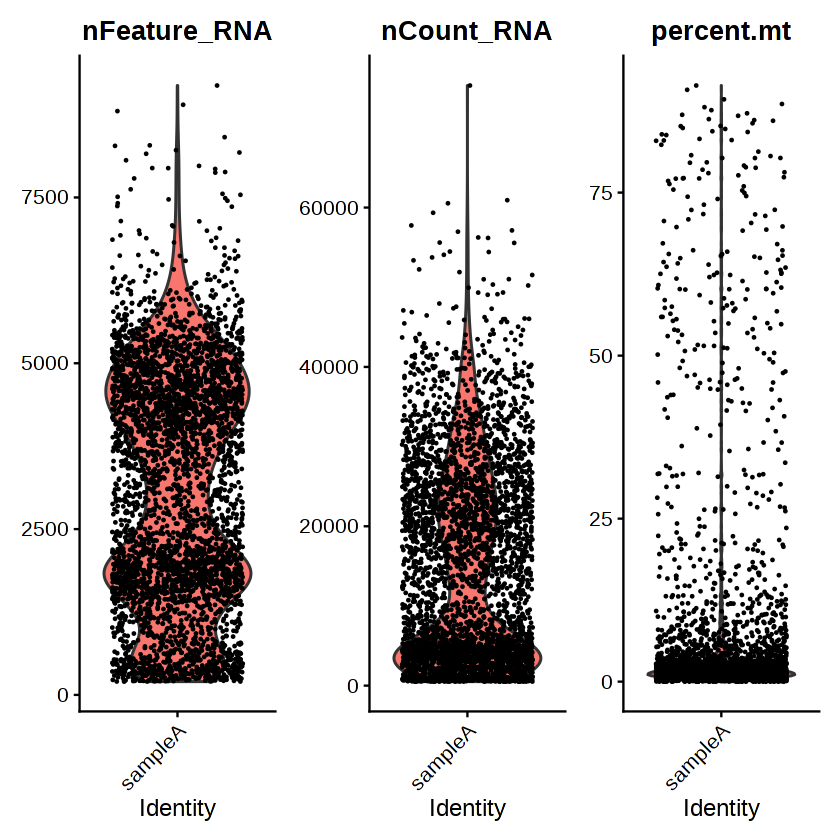

In [ ]:
#This function is used to create violin plots, which display the distribution of values ​​for a given feature across cells in a dataset.
scPlot <- VlnPlot(sampleA, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol=3)
scPlot
#ggsave("01-VlnPlot.png",plot = scPlot, bg = 'white')

One dimensional violin plots are often difficult to interpret the entire distribution so let's try some histograms.  
This is also a demonstration of how to make plots without using Seurat's visualization commands

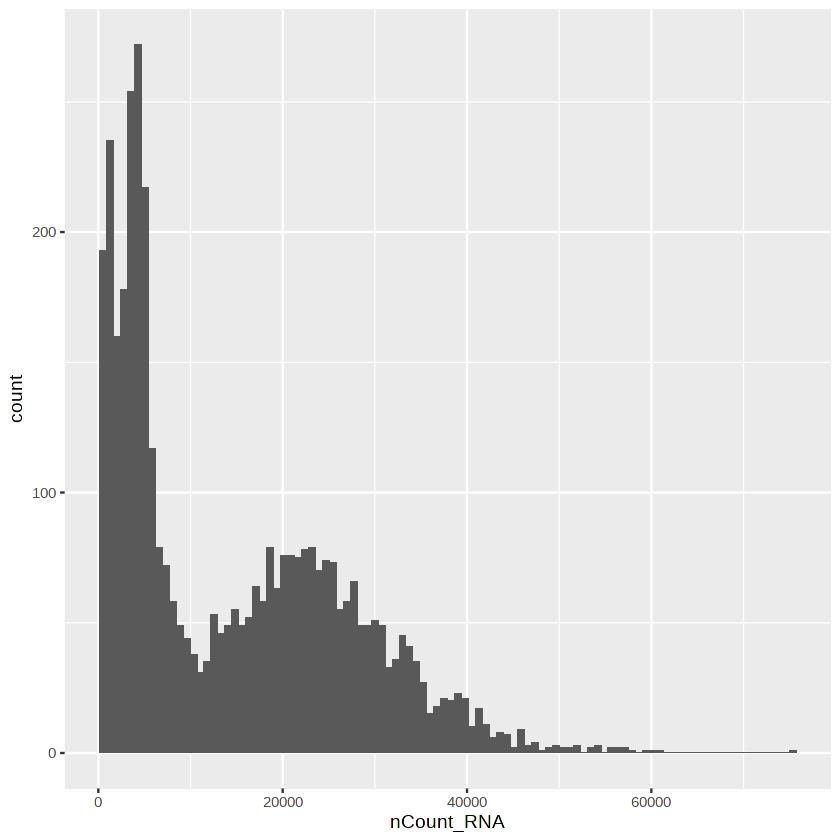

In [ ]:
sampleA.qc <- FetchData(sampleA,
                        vars=c("nFeature_RNA","nCount_RNA","percent.mt"))
scPlot <- sampleA.qc %>%
          ggplot() +
          geom_histogram(aes(x=nCount_RNA), bins=100)
scPlot
#ggsave("2-histogram.png",plot = scPlot, bg = 'white')

Try to extract the mean of nCounts_RNA

In [ ]:
summary(sampleA.qc$nCount_RNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    502    3866   11659   14627   23862   75319 

We see very clearly that the typical cell has about 20000 UMIs but this ranges from just a couple tens to over 60000

Let's zoom in on the low count end of the spectrum just to see if we can identify any structure (eg bimodality)

Warning message:
“Removed 3620 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_bar()`).”


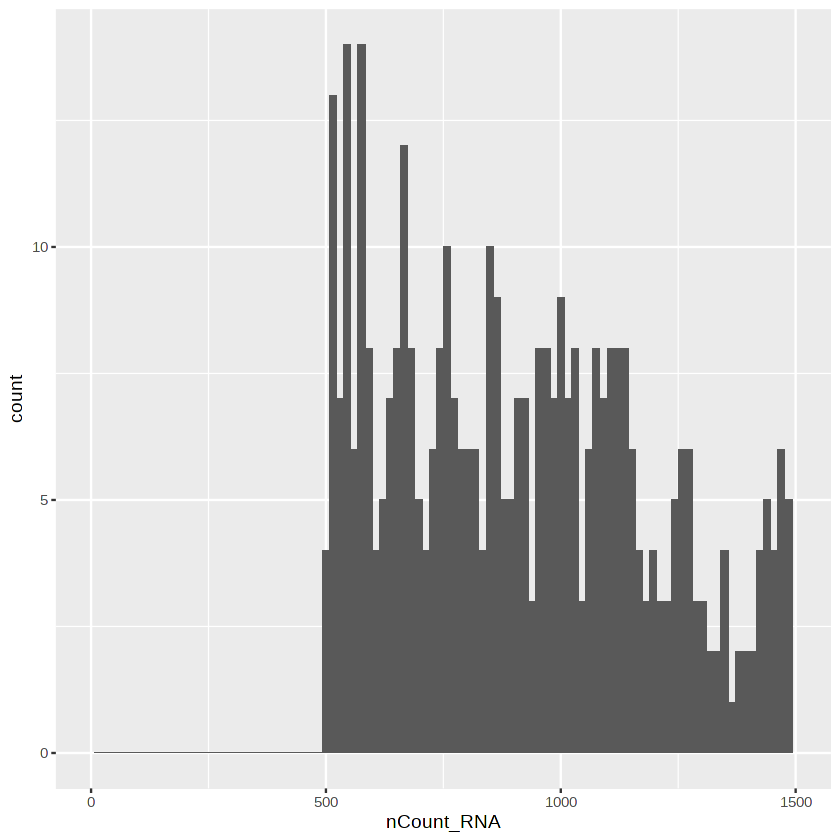

In [ ]:
scPlot <- sampleA.qc %>%
          ggplot() +
          geom_histogram(aes(x=nCount_RNA), bins=100) +
          xlim(0,1500)
scPlot
#ggsave("03-histogram.png",plot = scPlot, bg = 'white')

Given the large dynamic range, perhaps a log scale will be useful

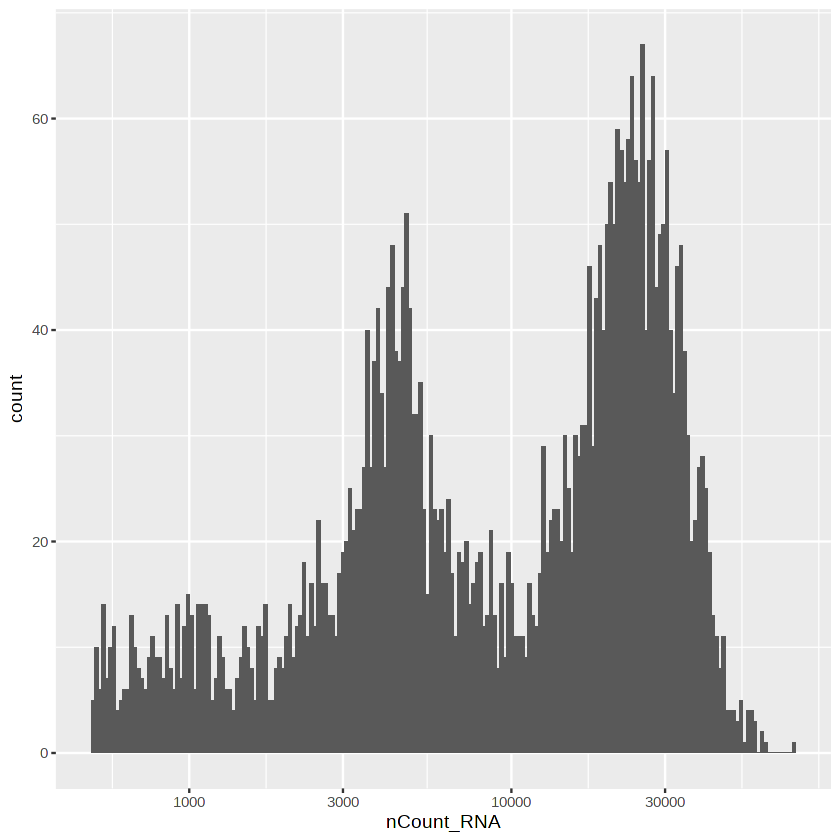

In [ ]:
scPlot <- sampleA.qc %>%
          ggplot() +
          geom_histogram(aes(x=nCount_RNA), bins=200) +
          scale_x_log10()
scPlot
#ggsave("04-histogram.png",plot = scPlot, bg = 'white')

Now let's look at the median number of genes per cell

In [ ]:
median(sampleA.qc$nFeature_RNA)

[1] 3122

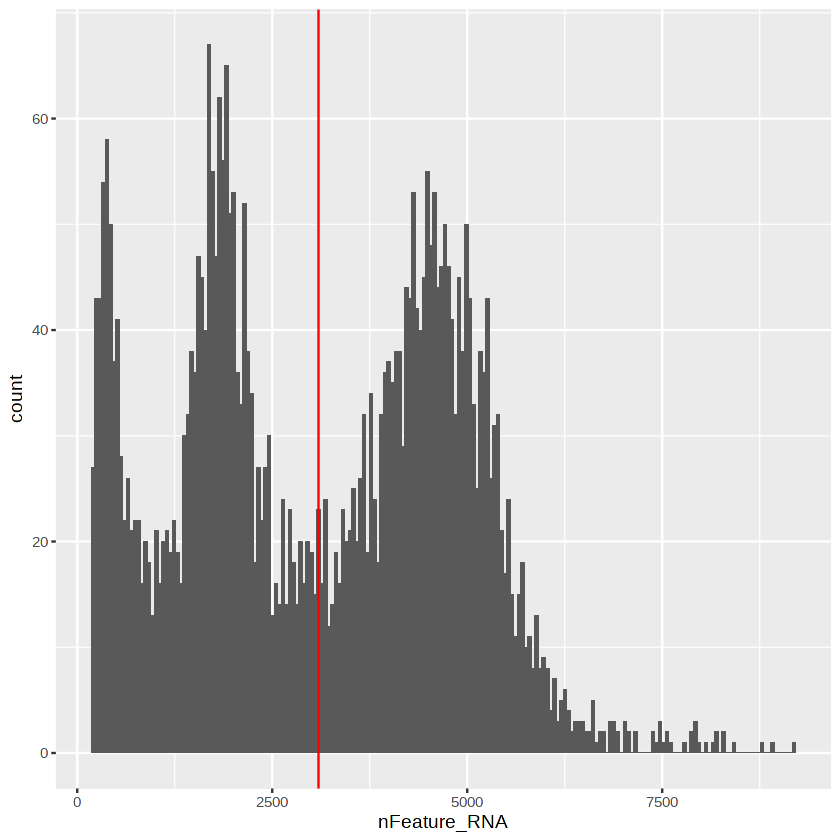

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    200    1688    3122    3102    4589    9188 

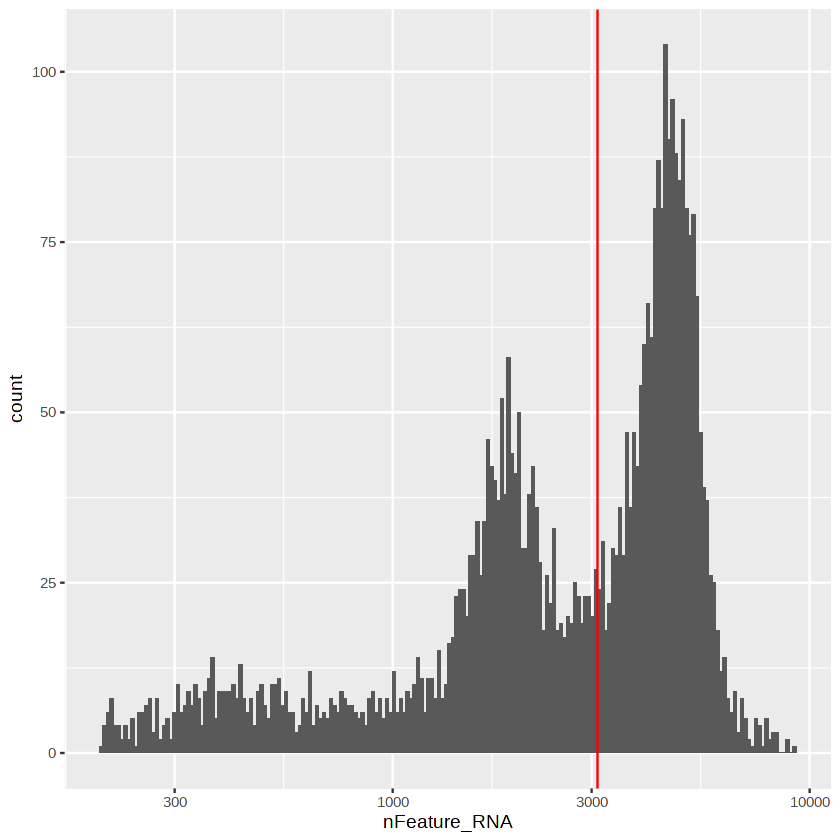

In [ ]:
scPlot <- sampleA.qc %>%
    ggplot() +
    geom_histogram(aes(x=nFeature_RNA), bins=200) +
    geom_vline(xintercept = 3096,color="red")
scPlot
#ggsave("05-histogram.png",plot = scPlot, bg = 'white')
scPlot <- sampleA.qc %>%
    ggplot() +
    geom_histogram(aes(x=nFeature_RNA), bins=200) +
    geom_vline(xintercept = 10^(3.491),color="red") +
    scale_x_log10()
scPlot
#ggsave("06-histogram.png",plot = scPlot, bg = 'white')
summary(sampleA.qc$nFeature_RNA)

Looks like the typical cell has data on about 3000 genes, ranging from 200 (the minimum we set when we created the Seurat object) to over 9000

And how about the percentage mitochondrial reads?

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.9912  1.6350  5.7354  2.8129 91.4254 

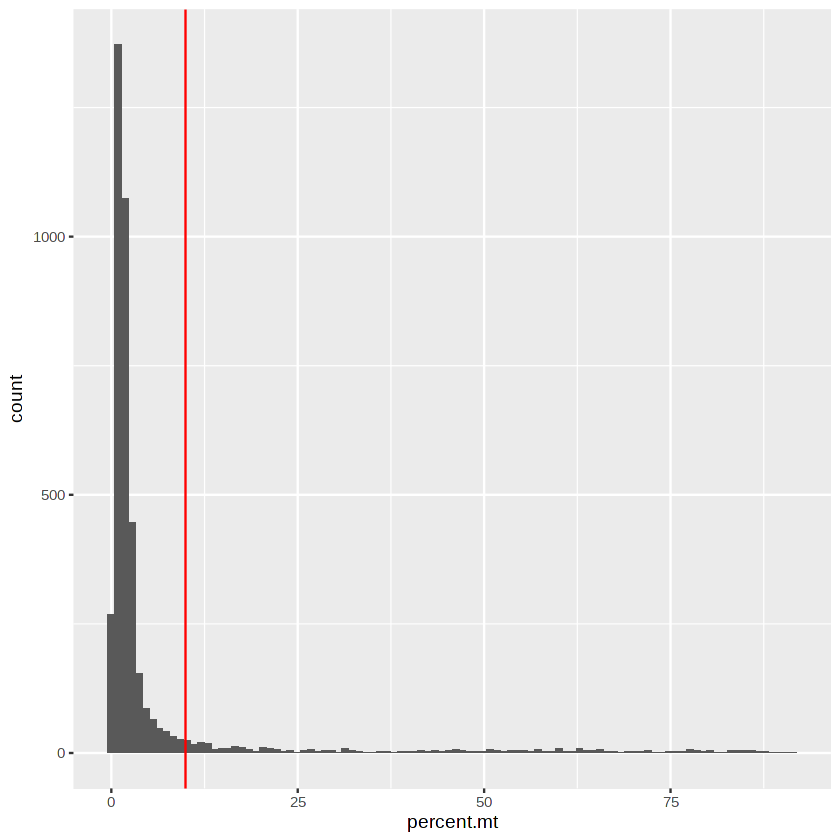

In [ ]:
scPlot <- sampleA.qc %>%
          ggplot() +
          geom_histogram(aes(x=percent.mt), bins=100) +
          geom_vline(xintercept = 10,color="red")
scPlot
#ggsave("07-histogram.png",plot = scPlot, bg = 'white')
summary(sampleA.qc$percent.mt)

The majority of cells are below **5%** but some are over **50%**

It is often more useful to look at multiple QC metrics together instead of individually. Lets try some simple 2D scatter plots

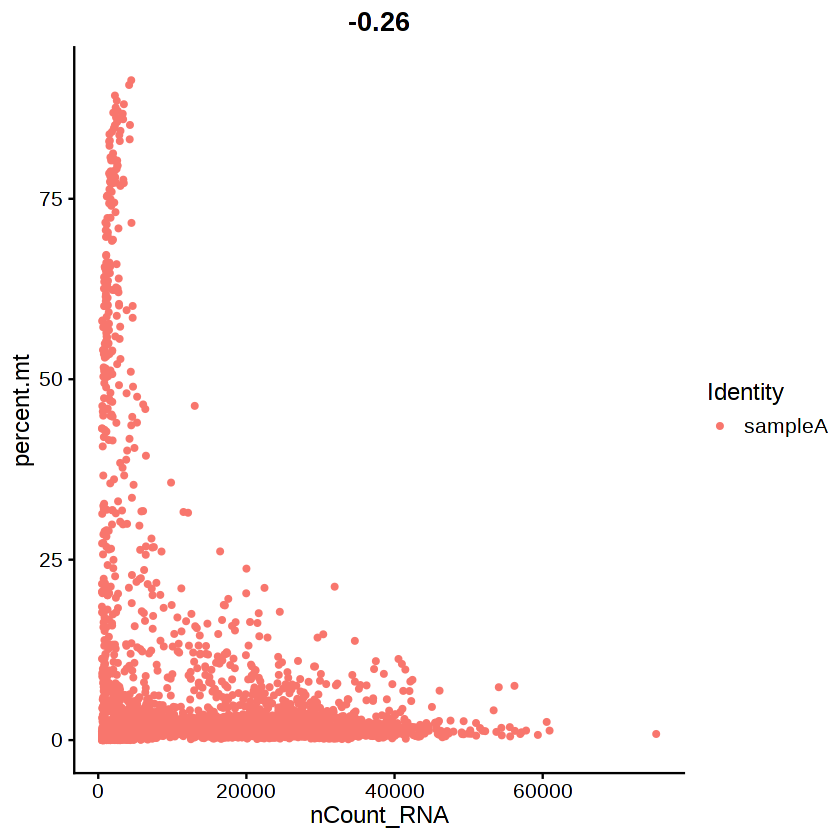

In [ ]:
scPlot <- FeatureScatter(sampleA, feature1="nCount_RNA", feature2="percent.mt")
scPlot
#ggsave("08-FeatureScatter.png",plot = scPlot, bg = 'white')

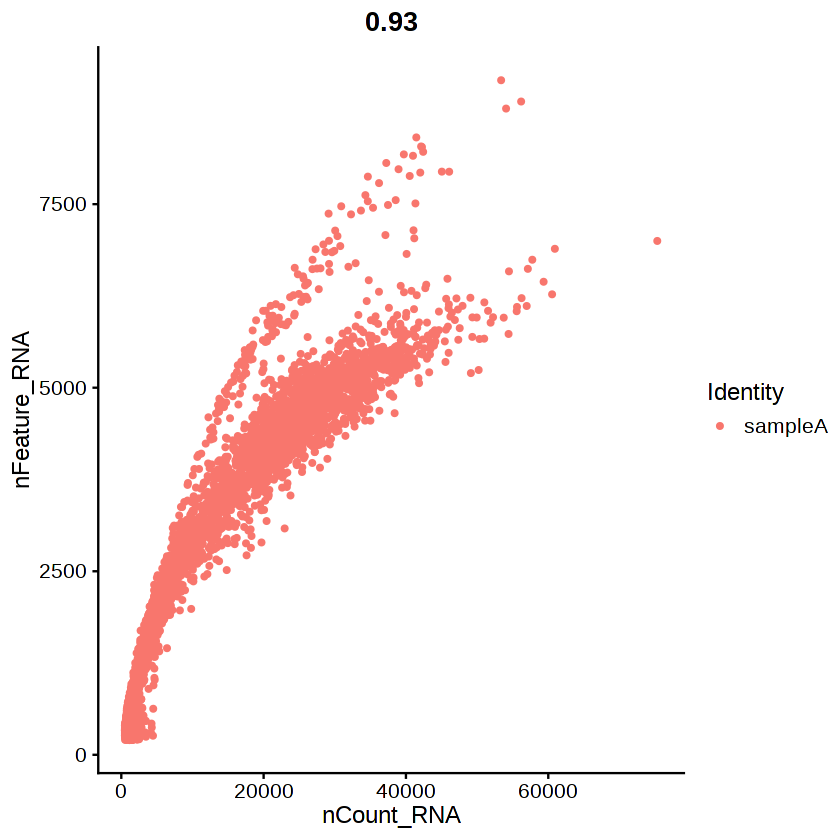

In [ ]:
scPlot <- FeatureScatter(sampleA, feature1="nCount_RNA", feature2="nFeature_RNA")
scPlot
#ggsave("09-FeatureScatter.png",plot = scPlot, bg = 'white')

Remeber: we don't need to use only Seurat plotting tools.

ggplot2 is a powerful visualization tool, which handles tables nicely to create plots. Check the plot above (nFeature vs. nCount) and consider that it may be of interest to understand how the data behaves as a function of the percentage of MT reads.

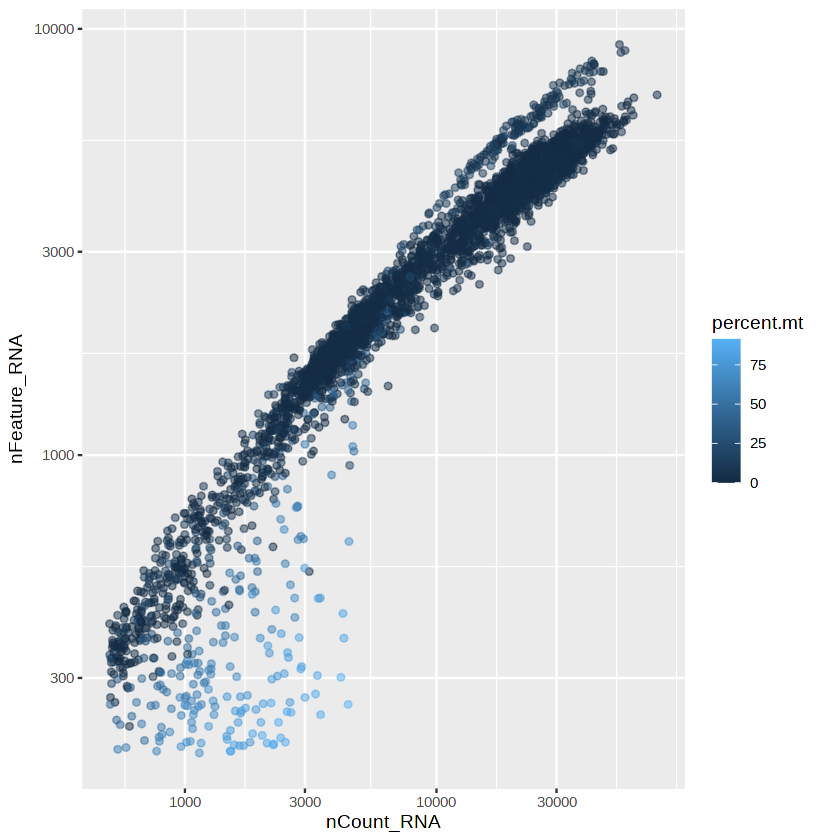

In [ ]:
scPlot <- sampleA.qc %>%
          ggplot() +
          geom_point(aes(nCount_RNA, nFeature_RNA, colour=percent.mt), alpha=.50) +
          scale_x_log10() +
          scale_y_log10()
scPlot
#ggsave("10-FeatureScatter.png",plot = scPlot, bg = 'white')

Most of this QC looks quite nice.  We don't see strikingly different subpopulations of cells by these QC metrics.
Just to be safe, let's remove cells with over 10% mitochrondrial reads, which may be a sign of ex-vivo damage during sample handling and library generation  

In [ ]:
#Filter using more than one variable
sampleA <- subset(sampleA, nCount_RNA > 500 & nFeature_RNA < 7000 & percent.mt < 10)

Let's reuse the plot we created on the last exercise and create a new column (called keep) using the metadata table. This column will identify the cells that we removed above.

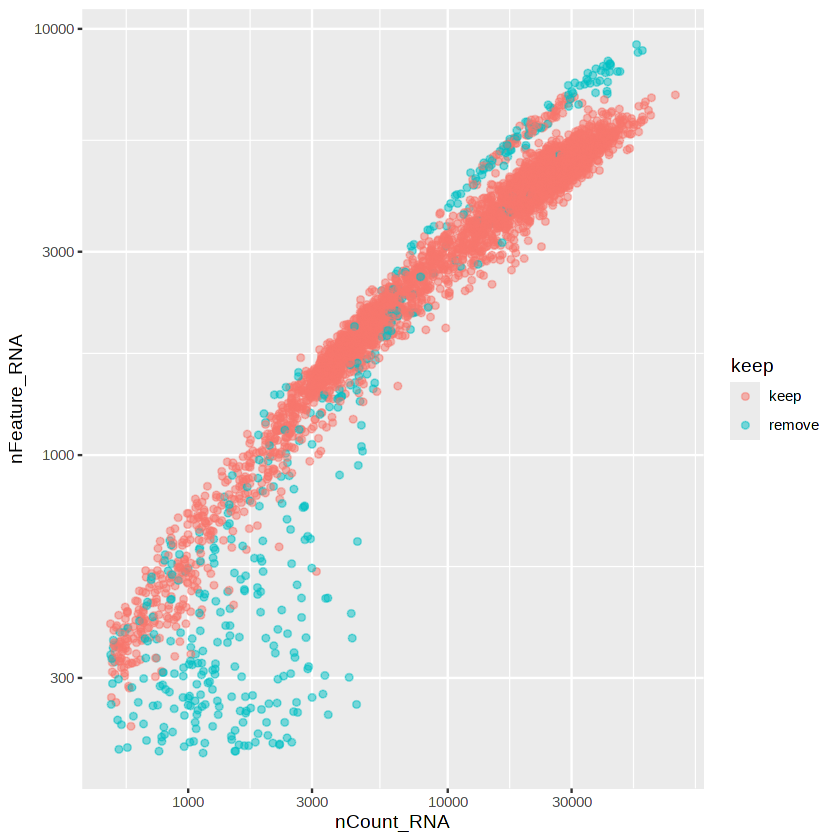

In [ ]:
scPlot <- sampleA.qc %>%
          mutate(keep = if_else(nCount_RNA > 500 & nFeature_RNA < 7000 & percent.mt < 10, "keep", "remove")) %>%
          ggplot() +
          geom_point(aes(nCount_RNA, nFeature_RNA, colour=keep), alpha=.50) +
          scale_x_log10() +
          scale_y_log10()
scPlot
#ggsave("11-point.png",plot = scPlot, bg = 'white')

[1] 33539  6249
[1] 20271  3594


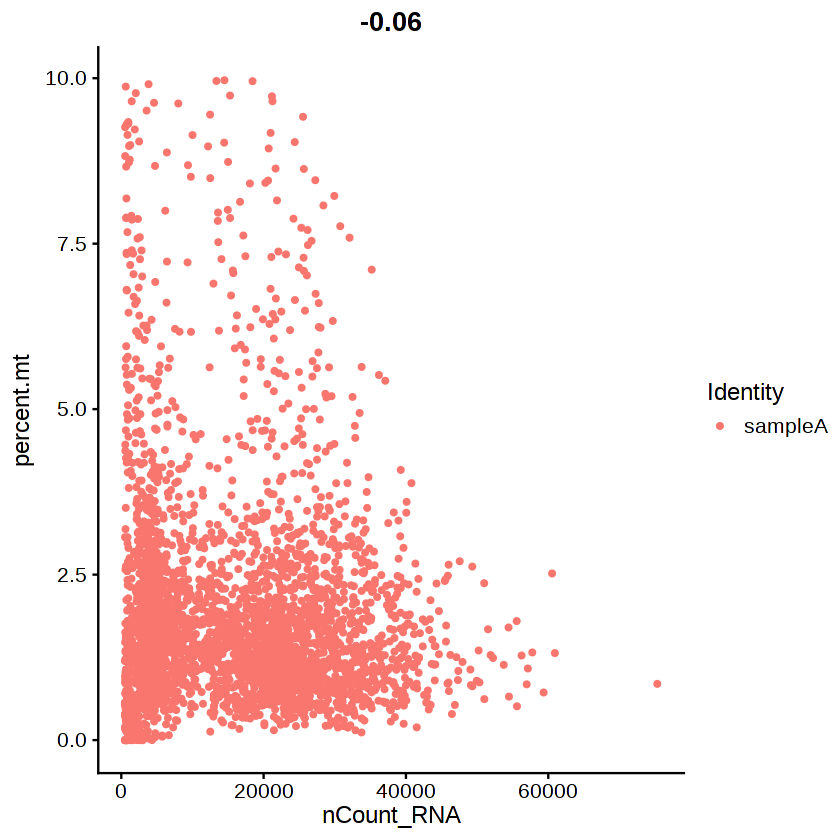

In [ ]:
#sampleA <- subset(sampleA, subset = percent.mt < 10)
scPlot <- FeatureScatter(sampleA, feature1="nCount_RNA", feature2="percent.mt")
scPlot
#ggsave("12-FeatureScatter.png",plot = scPlot, bg = 'white')
print(dim(sc))
print(dim(sampleA))


## Identify variable genes

*To get a feel for the patterns of gene expression change across cells, let's start exploring some visualizations*

The first step in the analysis is to identify the genes that show the most variability across the dataset. Genes that do not vary much across cells are less likely to provide useful information for further analyses, so we will focus on the top 2000 most variable genes.

To do this, we will first apply a variance stabilizing transformation (vst). This transformation helps to adjust the relationship between the mean and variance of gene expression values, making it easier to compare genes with different levels of expression. The goal of vst is to reduce the effect of genes with high expression levels, which tend to have higher variability, and make the variability of genes more consistent across different expression levels. This step ensures that we can more accurately identify genes that truly vary across cells and are likely to be biologically significant.

In [ ]:
sampleA <- FindVariableFeatures(sampleA, selection.method = "vst", nfeatures = 2000)

Finding variable features for layer counts



Let's see the names of the most highly variable genes now

In [ ]:
top10 <- head(VariableFeatures(sampleA), 10)
top10

[1] "CAPS"     "C20orf85" "GSTA1"    "C9orf24"  "IGFBP7"   "C2orf40" 
 [7] "SAA1"     "HAMP"     "LCN2"     "WFDC2"

Now let's plot the variance (after vst) versus the mean of expression for each gene, coloring the top 2000 and labelling the top 10

Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”


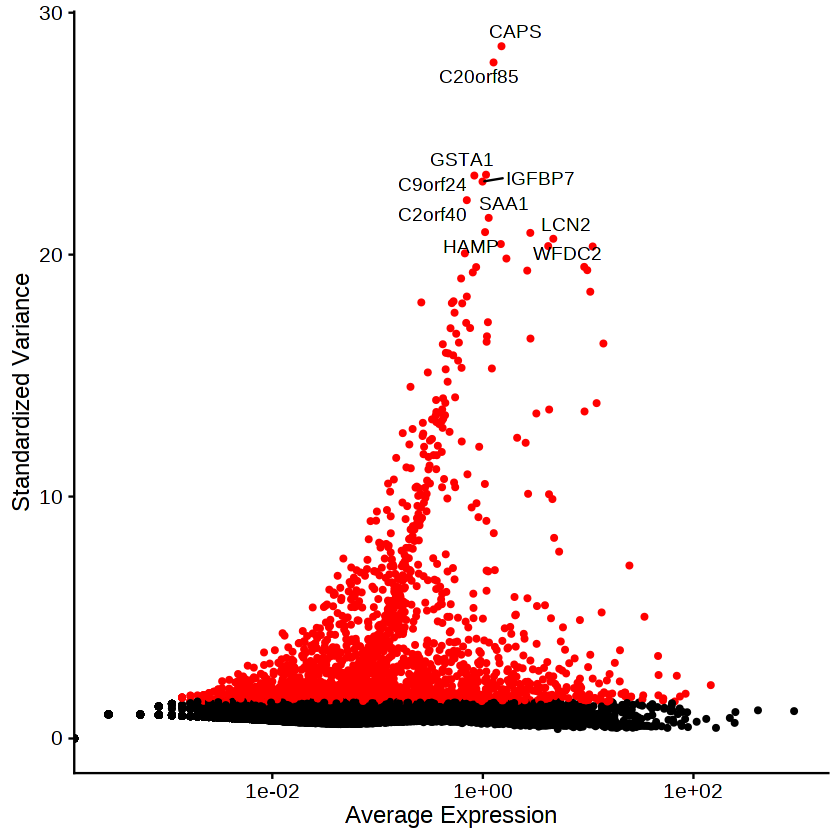

In [ ]:
plot1 <- VariableFeaturePlot(sampleA)
scPlot <- LabelPoints(plot=plot1, points = top10, repel=T, xnudge=0, ynudge=0) + theme(legend.position="none")
scPlot
#ggsave("13-VariableFeaturePlot.png",plot = scPlot, bg = 'white')

## Scaling gene expression

The next step in the analysis is to scale the expression of each gene across cells. This means adjusting the expression values so that each gene has an average expression of 0 and a variance of 1. This scaling step is important because genes often have different expression levels (magnitude), and if we don't scale the data, genes with higher expression levels might dominate the analysis.

By scaling the expression, all genes will contribute equally to downstream analyses, regardless of their initial expression levels. This is a common technique used in many big data fields to ensure that features (like genes in this case) with different scales or magnitudes can be compared or used together effectively.

In Seurat, the scaling process does not overwrite the original, unscaled expression values. Instead, the scaled expression values are stored separately in the Seurat object under `sampleA[["RNA"]]@scale.data`. This way, both the raw and scaled expression values are preserved, allowing you to use either version depending on the analysis or visualization you're performing.

scale the data

In [ ]:
sampleA = NormalizeData(sampleA)
all.genes <- rownames(sampleA)
sampleA <- ScaleData(sampleA, features = all.genes)

Normalizing layer: counts

Centering and scaling data matrix



In [ ]:
sampleA[["RNA"]]$data[1:10,1:10]

  [[ suppressing 10 column names ‘AAACCTGAGATGTCGG-1’, ‘AAACCTGAGGCTCATT-1’, ‘AAACCTGCAATCCGAT-1’ ... ]]



10 x 10 sparse Matrix of class "dgCMatrix"
                                     
AL627309.1 . .        . . . . . . . .
AL669831.2 . .        . . . . . . . .
AL669831.5 . .        . . . . . . . .
FAM87B     . .        . . . . . . . .
LINC00115  . .        . . . . . . . .
FAM41C     . .        . . . . . . . .
SAMD11     . .        . . . . . . . .
NOC2L      . 0.262325 . . . . . . . .
KLHL17     . .        . . . . . . . .
PLEKHN1    . .        . . . . . . . .

# Dimension Reduction

## PCA


We've identified the most variable genes and standardized their scales. Now, let's perform our first dimensionality reduction and visualization using PCA (Principal Component Analysis).

PCA is a technique used to reduce the number of dimensions (features) in a dataset while preserving as much variability (information) as possible. It does this by finding new variables, called principal components, that are combinations of the original features. These components capture the most important patterns in the data. In simple terms, PCA helps to simplify complex data by transforming it into a smaller set of meaningful components, making it easier to visualize and interpret.

**Perform PCA**

PC_ 1 
Positive:  CTSC, CD52, CD68, SNX10, ACP5, IFI30, FABP5, CXCL10, APOC1, NCF1 
	   RSAD2, BCL2A1, PLEK, FCGR3A, C1QC, LYZ, C1QB, MS4A6A, MS4A4A, C1QA 
	   TUBB, SERPINA1, GPNMB, FCGR1A, SOCS1, APOE, PLAUR, IL1RN, MAFB, CD69 
Negative:  LRRIQ1, EFCAB1, DMKN, CFAP43, FAM183A, NME5, SAXO2, MS4A8, SNTN, RSPH4A 
	   RSPH1, DNAH10, FAM92B, CDHR3, NWD1, HYDIN, TPPP3, ROPN1L, LDLRAD1, STOML3 
	   CAPSL, DNAH12, DCDC2B, AKAP14, MORN5, DNAI1, C1orf194, C9orf24, FAM166B, CCDC17 
PC_ 2 
Positive:  IL32, CD3E, PTPRCAP, CD2, CORO1A, CCL5, CD3D, CLEC2D, LCK, LIMD2 
	   CD7, CD3G, NKG7, TRBC2, GIMAP7, GZMA, CD247, CD8A, PRF1, TRAC 
	   SEPT1, CST7, CD96, CD8B, CD48, SPOCK2, ANXA6, IKZF3, CXCR3, IL2RB 
Negative:  CD68, SERPING1, SERPINA1, IFI30, CTSB, MS4A4A, LYZ, APOC1, FCGR3A, HLA-DRA 
	   C1QB, C1QC, C1QA, HLA-DRB5, NUPR1, GPNMB, FCGR1A, CTSZ, CTSL, MARCO 
	   CYP27A1, ALDH2, HLA-DQA2, CFD, CD163, MS4A6A, APOE, HLA-DQB1, S100A9, PLAUR 
PC_ 3 
Positive:  CYP2F1, SCGB3A1, PRSS23, SERPINB3, BPIFB1

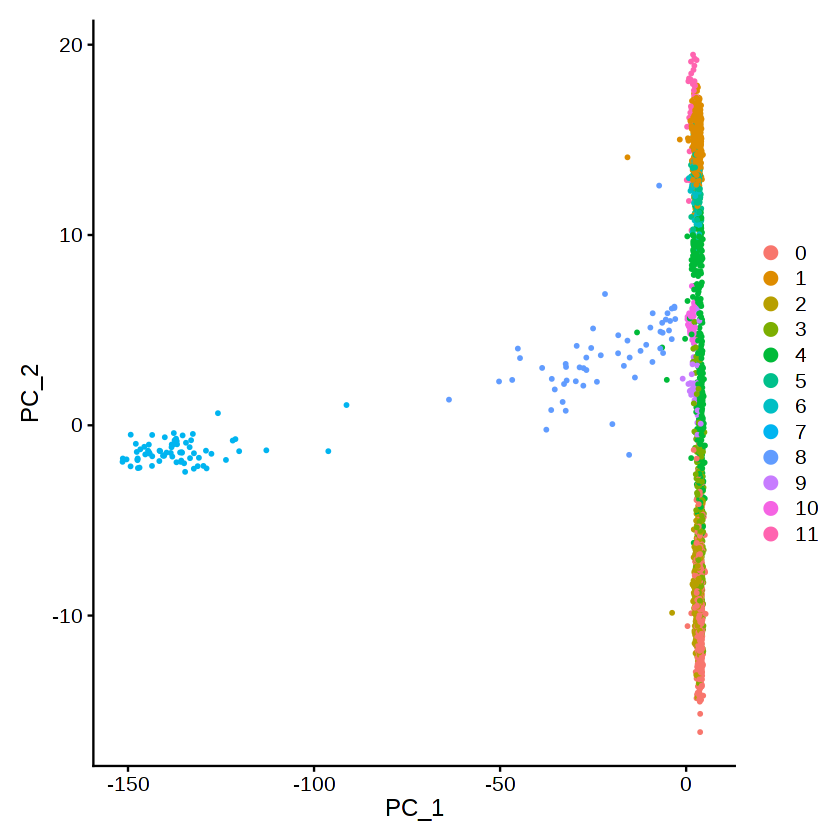

In [ ]:
sampleA <- RunPCA(sampleA, features = VariableFeatures(sampleA))
scPlot <- DimPlot(sampleA, reduction="pca")
scPlot
#ggsave("14-DimPlot.png",plot = scPlot, bg = 'white')

Hmm, that doesn't show much structure.  It seems like the vast majority of the variation across cells is coming from one direction in gene expression space.
Maybe we can learn something by looking at what genes contribute to that PC.


The explained variance by each principal component is the ratio between each eigenvalue and the sum of all eigenvalues. We need to remember that Seurat does not compute all the principal components, because it is computationally heavy. In our case, it calculated the first 50 PCs, so all the inference must be conditional on these 50 PCs (and not all the 3894 possible PCs).

,PC,percVar,cumulVar
,<fct>,<dbl>,<dbl>
1,1,24.8391277,24.83913
2,2,7.1695126,32.00864
3,3,3.0385165,35.04716
4,4,2.1933543,37.24051
5,5,1.3998152,38.64033
6,6,1.3496328,39.98996
7,7,0.9680485,40.95801
8,8,0.7929112,41.75092
9,9,0.6820848,42.43300


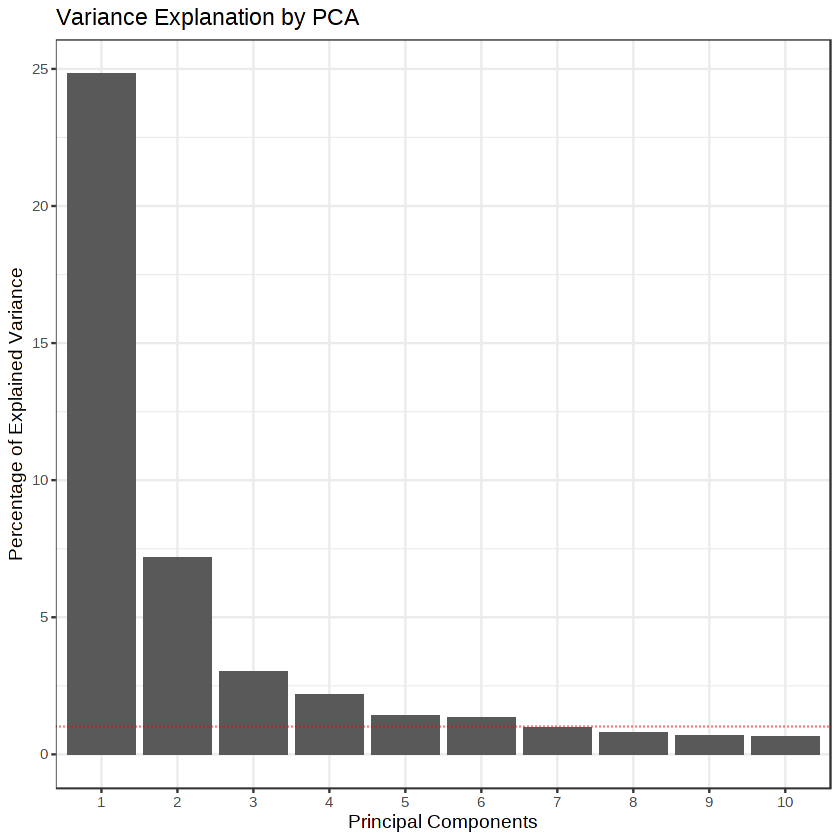

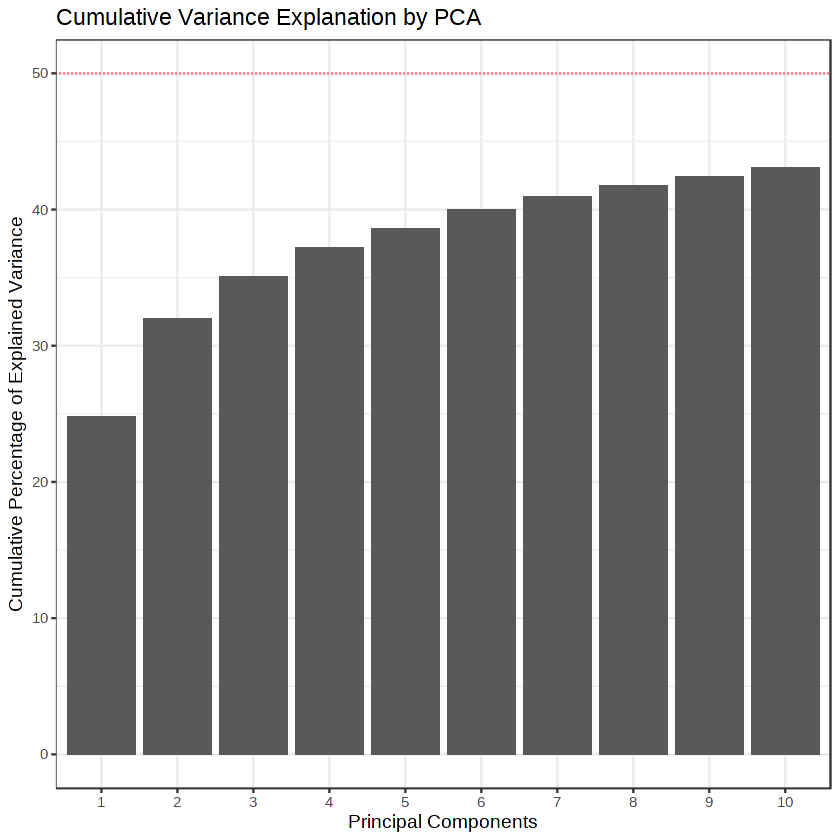

In [ ]:
pca = sampleA[["pca"]]

## get the eigenvalues
evs = pca@stdev^2
total.var = pca@misc$total.variance
varExplained = evs/total.var
pca.data = data.frame(PC=factor(1:length(evs)),
                      percVar=varExplained*100)

pca.var = cumsum(pca.data$percVar)
######
pca.data$cumulVar = pca.var
# pca.data $ cumulVar = cumsum(pca.data $ percVar) <- remove '#' and spaces before $

head(pca.data, 20)

scPlot <- pca.data[1:10,] %>%
          ggplot(aes(x=PC, y=percVar)) +
          geom_bar(stat='identity') +
          geom_hline(yintercept = 1, colour="red", linetype=3) +
          labs(title="Variance Explanation by PCA") +
          xlab("Principal Components") +
          ylab("Percentage of Explained Variance") +
          theme_bw()
scPlot
#ggsave("15-geom_bar.png",plot = scPlot, bg = 'white')

scPlot <- pca.data[1:10,] %>%
          ggplot(aes(x=PC, y=cumulVar)) +
          geom_bar(stat='identity') +
          geom_hline(yintercept = 50, colour="red", linetype=3) +
          labs(title="Cumulative Variance Explanation by PCA") +
          xlab("Principal Components") +
          ylab("Cumulative Percentage of Explained Variance") +
          theme_bw()
scPlot
#ggsave("16-geom_bar.png",plot = scPlot, bg = 'white')

Observing PC1, it seems that it is account for the overall signal per cell. We can't see clear groups of different gene sets (unlike PC2).

The other PCs instead do seem to be measuring the relative expression of different genes. If PC1 is just the total signal per cell maybe we can visualize that directly.

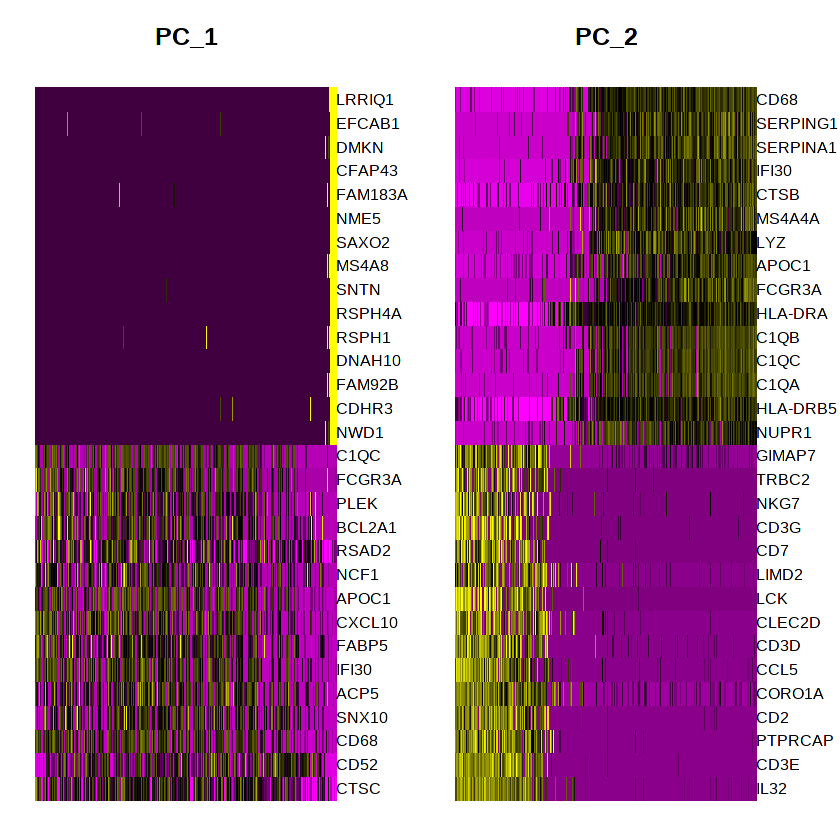

In [ ]:
#png("17-DimHeatmap.png", res= 300, height = 1920, width = 1920)
DimHeatmap(sampleA, dims = 1:2)
#dev.off()

Calculate the variance for each component to find an explanation

It appears that **PC1** just has postive weights from a bunch of genes.  This suggests it isn't balancing expression of different gene sets, it's just measuring overall signal.  What do other PCs look like?

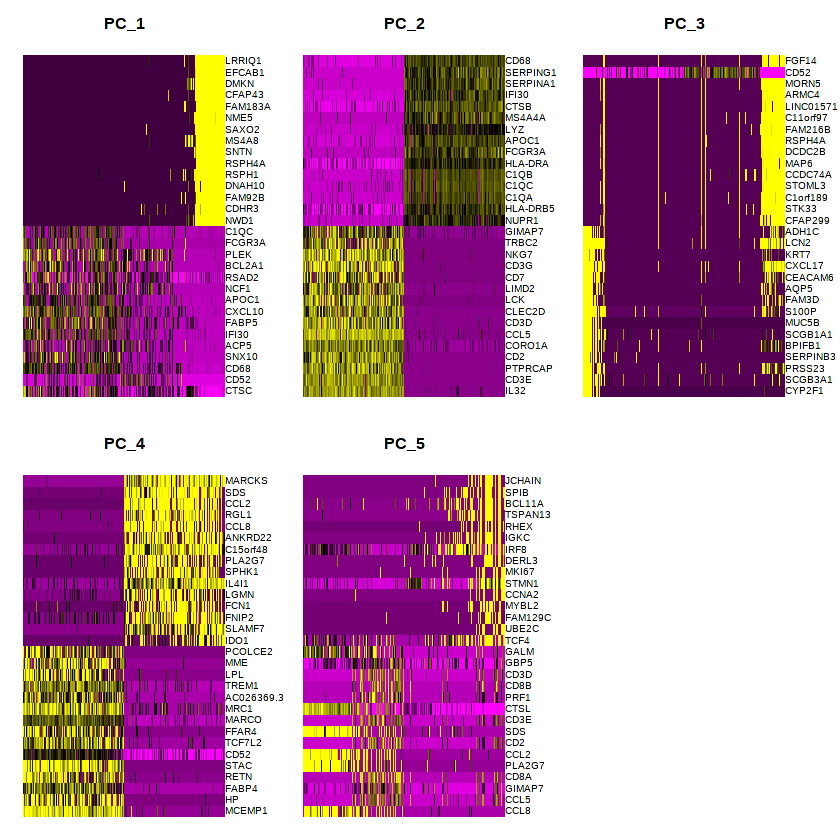

In [ ]:
#png("18-DimHeatmap.png", res= 300, height = 1920, width = 1920)
DimHeatmap(sampleA, dims = 1:5, cells = 500, balanced=T)
#dev.off()

The other PCs instead do seem to be measuring the relative expression of
different genes. If PC1 is just the total signal per cell maybe we can
visualize that directly.

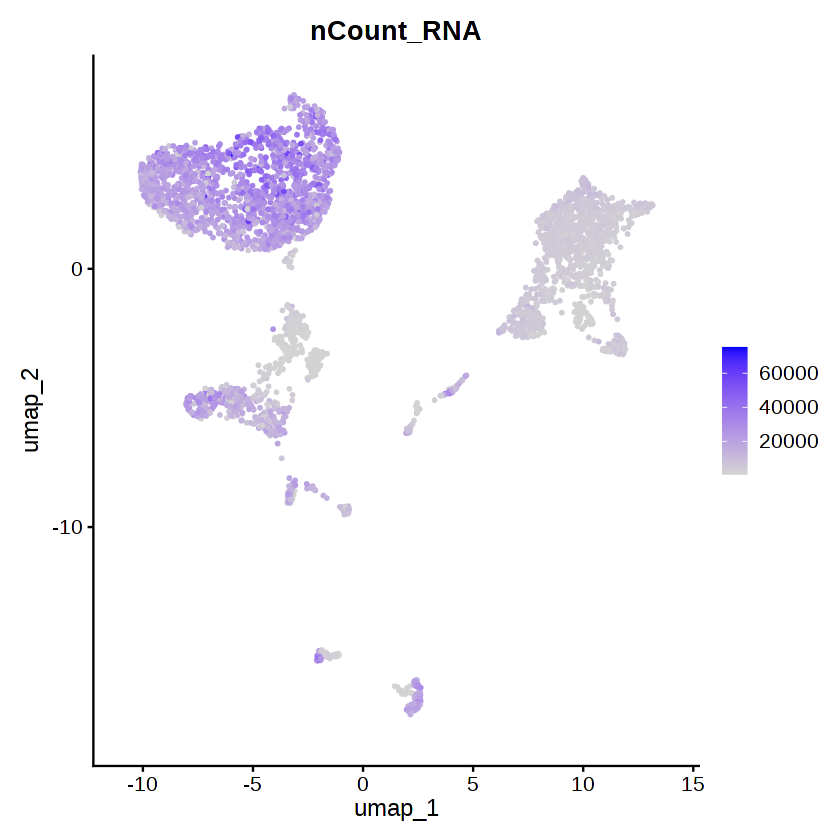

In [ ]:
scPlot <- FeaturePlot(sampleA, features="nCount_RNA")
scPlot
#ggsave("19-FeaturePlot.png",plot = scPlot, bg = 'white')

That definitely seems to be the case. This large variation in total RNA per cell is likely influencing the results. We observed this in our QC steps, and since we haven't corrected for it yet, it's important to address this issue now.

A common and straightforward way to correct for this is to normalize the data. We will do this by dividing the counts for each gene by the total UMI (Unique Molecular Identifier) count for that specific cell. This step adjusts for the varying RNA capture efficiency across cells, ensuring that the expression levels are comparable across all cells, regardless of their total RNA content.

After normalization, we will apply a log transformation. This is done to make the data more manageable and to reduce the impact of genes with very high expression, which can dominate the analysis.

Additionally, we will multiply the normalized counts by a scaling factor of 10,000 before applying the log transformation. This factor is somewhat arbitrary, but it is commonly used in practice. The scaling factor ensures that the resulting values are not too small and are easier to handle computationally. While the exact factor is not critical, using a standard value like 10,000 makes the process consistent and allows for easier comparison across datasets.


In [ ]:
sampleA = NormalizeData(sampleA, normalization.method="LogNormalize",
                        scale.factor=10000)

Normalizing layer: counts



Now we have to re-identify highly variable features and re-scale

In [ ]:
sampleA = FindVariableFeatures(sampleA, selection.method="vst",
                               nfeatures=2000)
top10 = head(VariableFeatures(sampleA), 10)
top10

Finding variable features for layer counts



[1] "CAPS"     "C20orf85" "GSTA1"    "C9orf24"  "IGFBP7"   "C2orf40" 
 [7] "SAA1"     "HAMP"     "LCN2"     "WFDC2"

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”


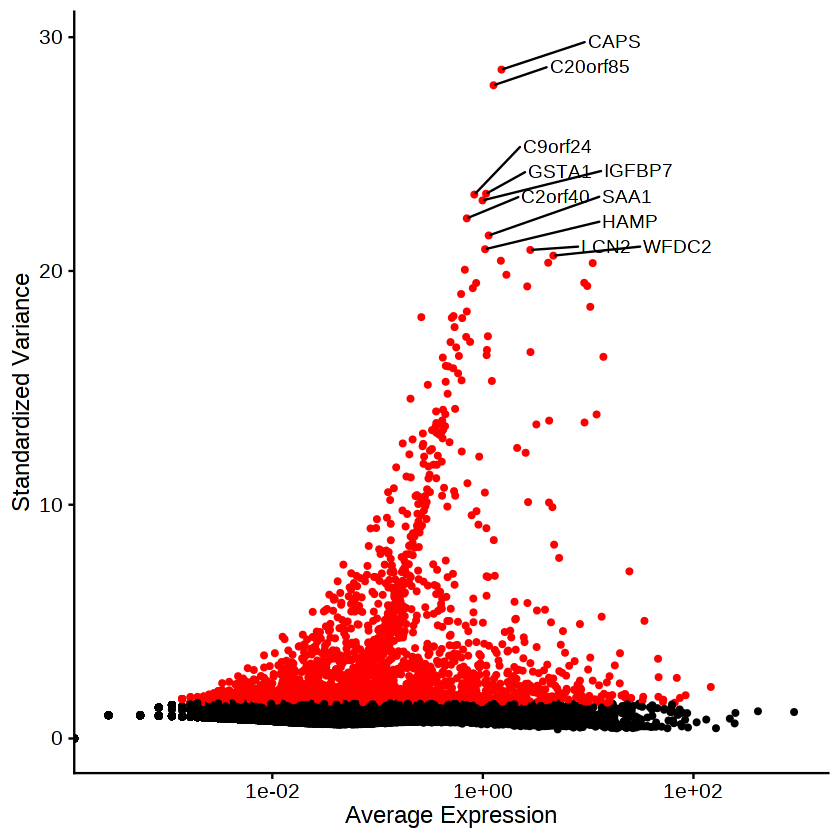

In [ ]:
plot1 = VariableFeaturePlot(sampleA)
scPlot <- LabelPoints(plot=plot1, points=top10, repel=TRUE, xnudge=1, ynudge=1) +
          theme(legend.position="none")
scPlot
#ggsave("20-VariableFeaturePlot.png",plot = scPlot, bg = 'white')

Centering and scaling data matrix

PC_ 1 
Positive:  CTSC, CD52, CD68, SNX10, ACP5, IFI30, FABP5, CXCL10, APOC1, NCF1 
	   RSAD2, BCL2A1, PLEK, FCGR3A, C1QC, LYZ, C1QB, MS4A6A, MS4A4A, C1QA 
	   TUBB, SERPINA1, GPNMB, FCGR1A, SOCS1, APOE, PLAUR, IL1RN, MAFB, CD69 
Negative:  LRRIQ1, EFCAB1, DMKN, CFAP43, FAM183A, NME5, SAXO2, MS4A8, SNTN, RSPH4A 
	   RSPH1, DNAH10, FAM92B, CDHR3, NWD1, HYDIN, TPPP3, ROPN1L, LDLRAD1, STOML3 
	   CAPSL, DNAH12, DCDC2B, AKAP14, MORN5, DNAI1, C1orf194, C9orf24, FAM166B, CCDC17 
PC_ 2 
Positive:  IL32, CD3E, PTPRCAP, CD2, CORO1A, CCL5, CD3D, CLEC2D, LCK, LIMD2 
	   CD7, CD3G, NKG7, TRBC2, GIMAP7, GZMA, CD247, CD8A, PRF1, TRAC 
	   SEPT1, CST7, CD96, CD8B, CD48, SPOCK2, ANXA6, IKZF3, CXCR3, IL2RB 
Negative:  CD68, SERPING1, SERPINA1, IFI30, CTSB, MS4A4A, LYZ, APOC1, FCGR3A, HLA-DRA 
	   C1QB, C1QC, C1QA, HLA-DRB5, NUPR1, GPNMB, FCGR1A, CTSZ, CTSL, MARCO 
	   CYP27A1, ALDH2, HLA-DQA2, CFD, CD163, MS4A6A, APOE, HLA-DQB1, S100A9, PLAUR 
PC_ 3 
Positive:  CYP2F1

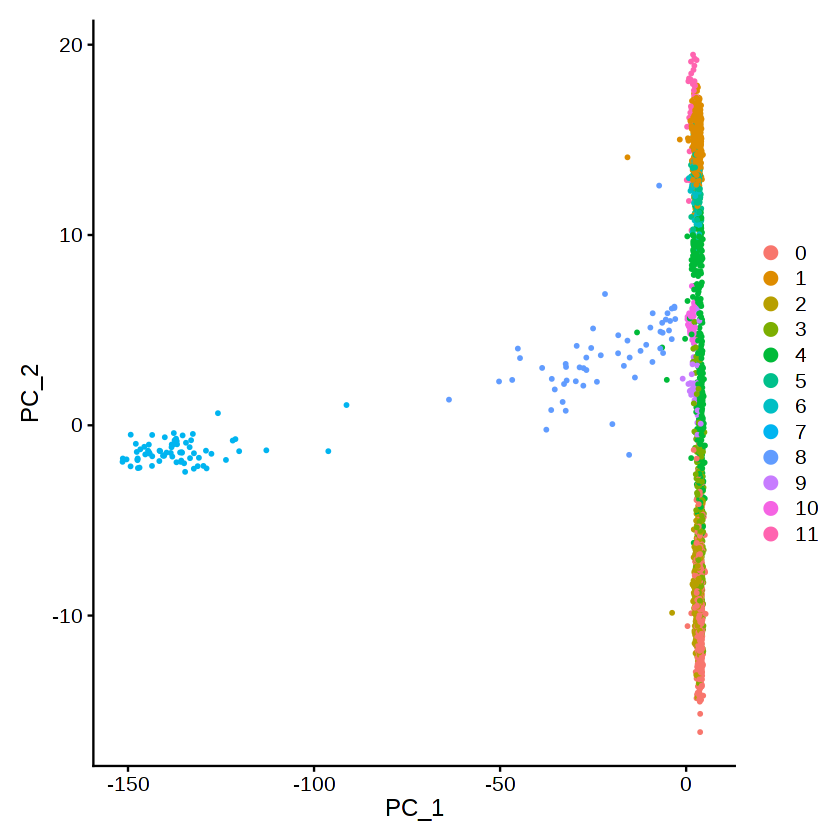

In [ ]:
sampleA <- ScaleData(sampleA, features = all.genes)
# perform PCA
sampleA <- RunPCA(sampleA, features = VariableFeatures(sampleA))
scPlot <- DimPlot(sampleA, reduction="pca")
scPlot
#ggsave("21-DimPlot.png",plot = scPlot, bg = 'white')

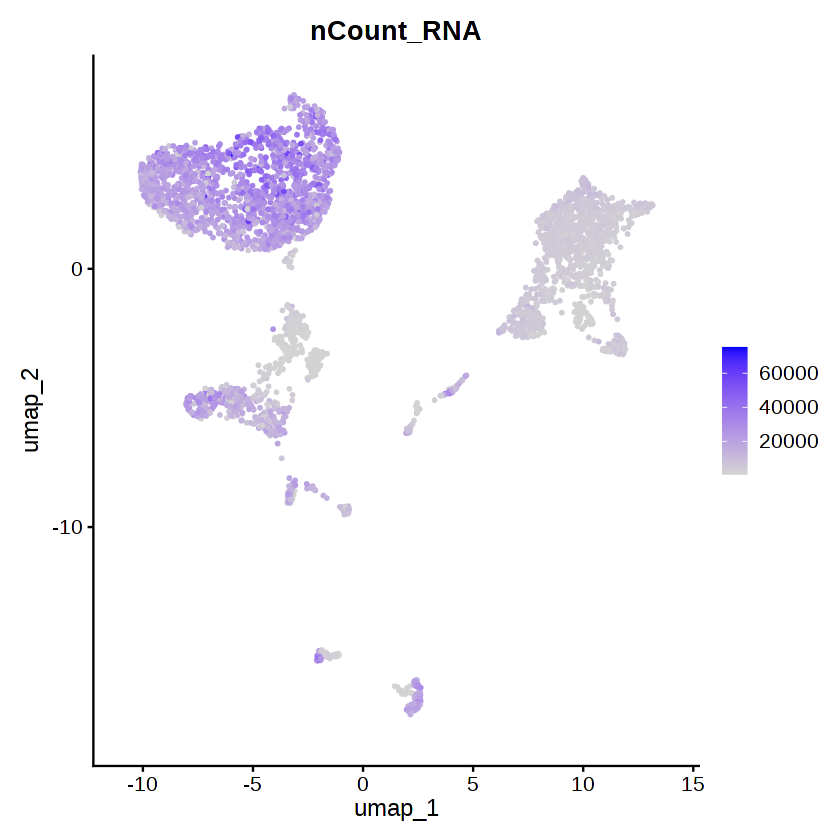

In [ ]:
scPlot <- FeaturePlot(sampleA, features="nCount_RNA")
scPlot
#ggsave("22-FeaturePlot.png",plot = scPlot, bg = 'white')

It doesn't look better, but that is, can you play to improve it?

## UMAP
UMAP (Uniform Manifold Approximation and Projection) is a nonlinear dimensionality reduction technique that is often used for visualizing complex datasets, such as single-cell RNA-seq data. Unlike PCA, which is a linear transformation, UMAP is capable of capturing more complex, nonlinear relationships between data points. This makes UMAP especially useful when the data has intricate structures that cannot be captured by linear methods.

The feature of UMAP is that it preserves both local and global structures in the data. This means that UMAP not only keeps the relationships between nearby points but also tries to maintain the broader overall structure of the dataset, which makes it great for visualization.

However, UMAP's bug or limitation is that it is computationally expensive and can be noisy when dealing with high-dimensional data directly. To address this, we often perform initial dimensionality reduction using PCA before applying UMAP. PCA reduces the number of dimensions by identifying the most important components in the data, which simplifies the structure and speeds up the UMAP calculations. Additionally, PCA can help remove some noise, improving the quality of the UMAP results.

In summary, UMAP is a powerful tool for visualizing complex data, and using it after PCA can make the process more efficient and produce clearer results.

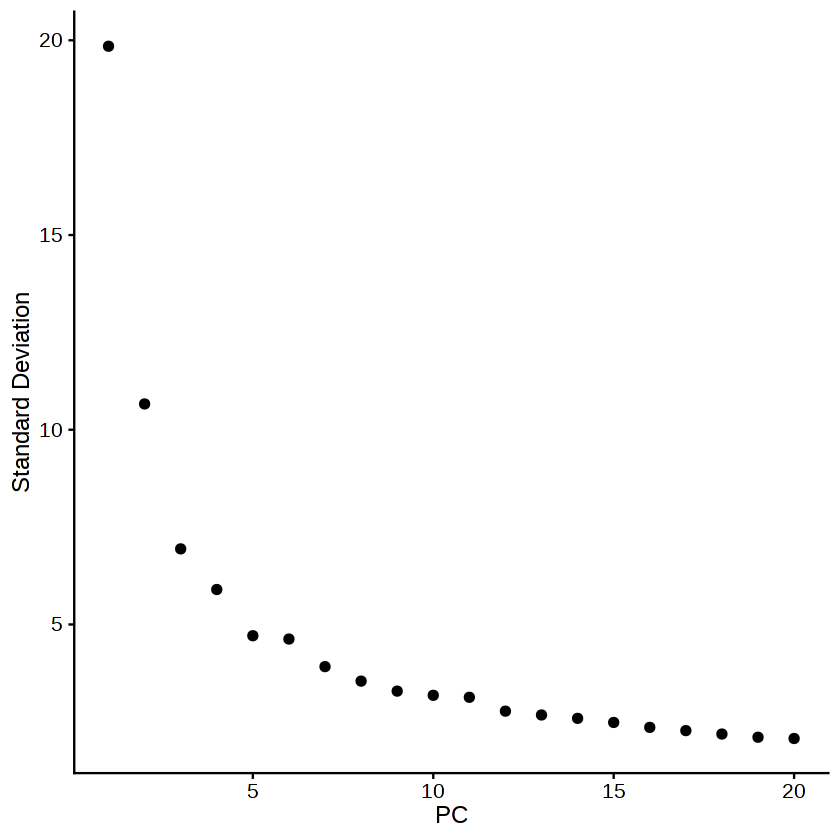

In [ ]:
# To use PCA for dimensionality reduction we have to choose how many principal components to use.
# Since PCA is linear and orthogonal, the PC values are straightforward to interpret as explaining a fraction of the total variation across the data.
# Let's look at the top PCs.
scPlot <- ElbowPlot(sampleA)
scPlot
#ggsave("23-ElbowPlot.png",plot = scPlot, bg = 'white')

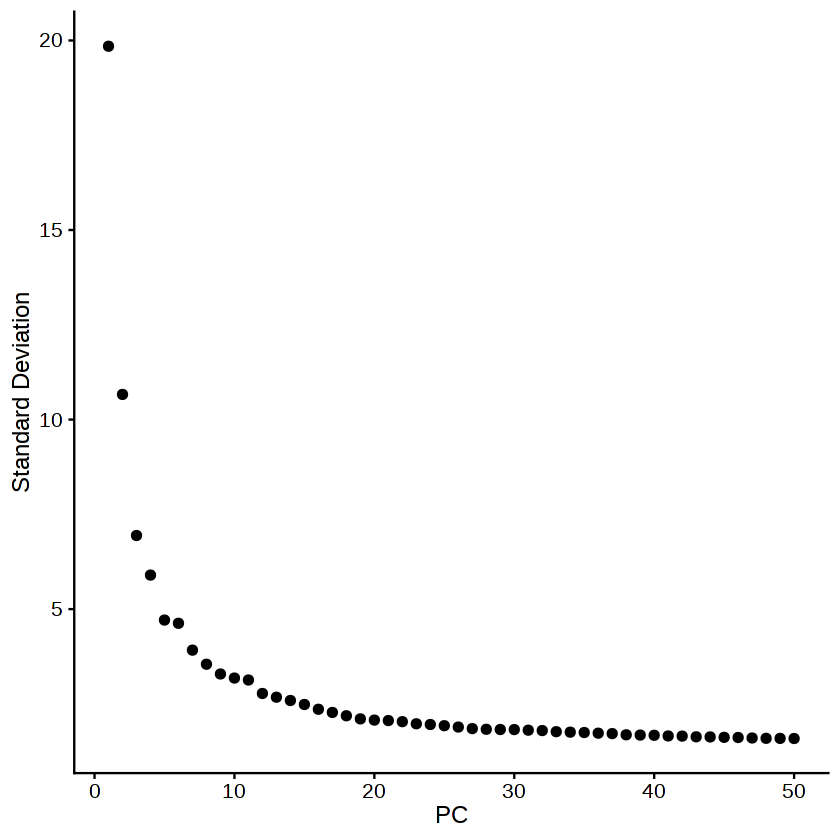

In [ ]:
#By default we see the top 20 but we can ask for more if we like.
scPlot <- ElbowPlot(sampleA, ndims=50)
scPlot
#ggsave("24-ElbowPlot.png",plot = scPlot, bg = 'white')

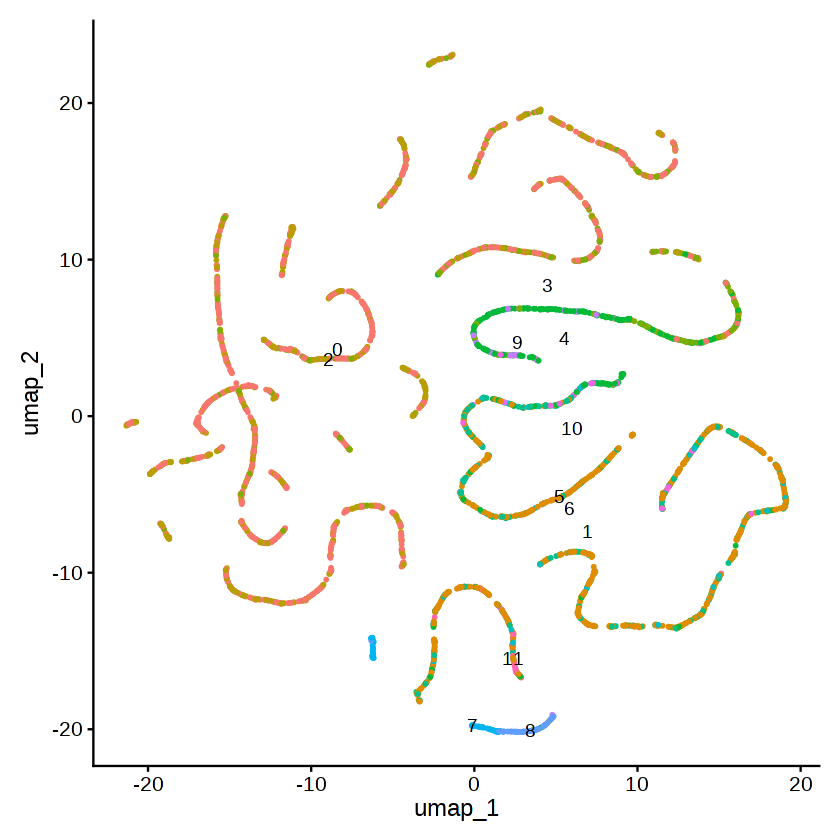

In [ ]:
# Note that the previous RunPCA only calculated the top 50.  If we want to look at more principal component values, we have to calculate them first.
# We could go back and re-run the PCA but for the sake of time let's just use the top 50

# While there's no clear cutoff (there rarely is), it doesn't look like all top 50 will be essential.
# Our calculations will of course be quickest if we only use 2 PCs, let's see what effect that has.
sampleA <- RunUMAP(sampleA, dims=1:2, verbose=F)
scPlot <- DimPlot(sampleA, label=T) + NoLegend()
scPlot
#ggsave("25-DimPlot.png",plot = scPlot, bg = 'white')

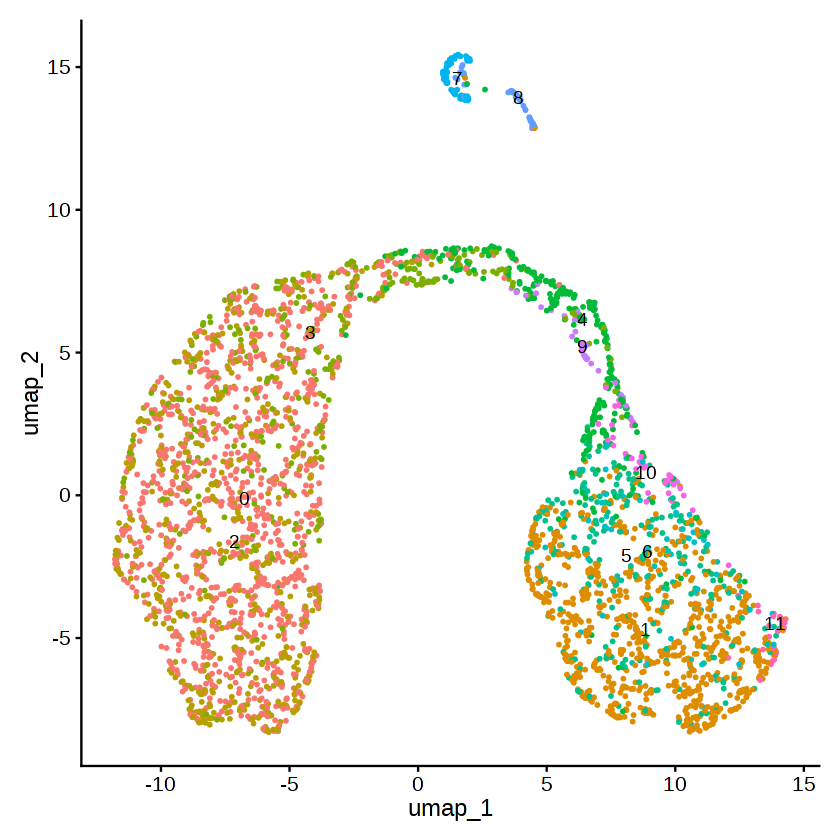

In [ ]:
# That seems suspicious.  It doesn't at all match our expectations about gene expression
# profiles of PBMC subsets should look like.  Let's see if it is a robust pattern, of if
# it changes a lot when we add just one more PC.

sampleA <- RunUMAP(sampleA, dims=1:3, verbose=F)
scPlot <- DimPlot(sampleA, label=T) + NoLegend()
scPlot
#ggsave("26-DimPlot.png",plot = scPlot, bg = 'white')

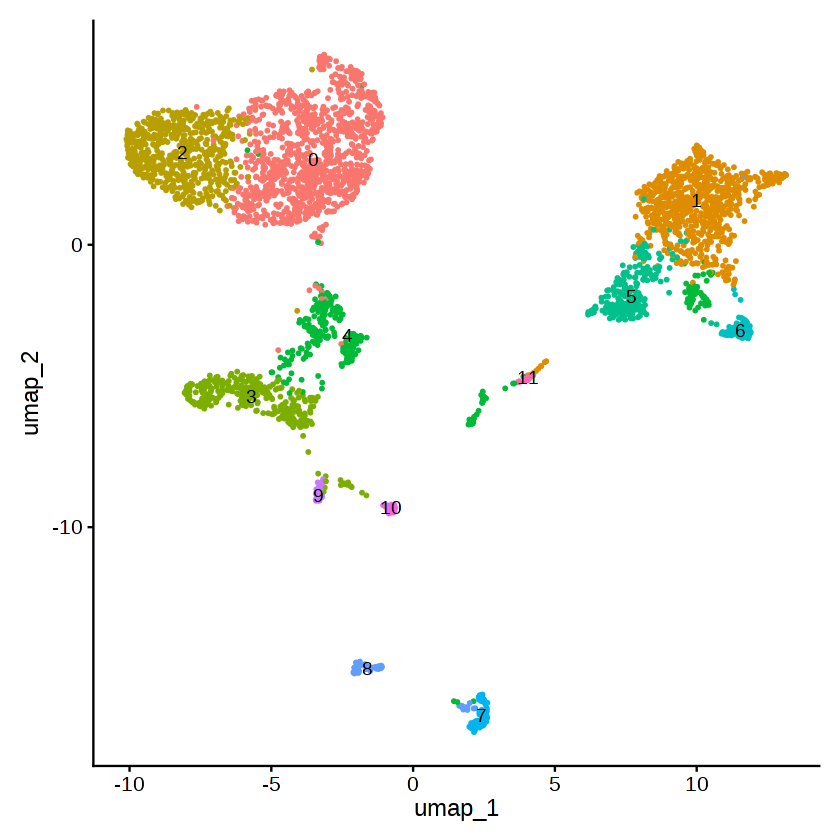

In [ ]:
# Indeed, it changed quite a bit!  It still doesn't really match what we might expect
# for PBMCs.  Furthermore, the plot of PC values above doesn't plateau until somewhere
# in the 10-20 range.  Let's use the top 15.

sampleA <- RunUMAP(sampleA, dims=1:15, verbose=F)
scPlot <- DimPlot(sampleA, label=T) + NoLegend()
scPlot
#ggsave("26-DimPlot.png",plot = scPlot, bg = 'white')

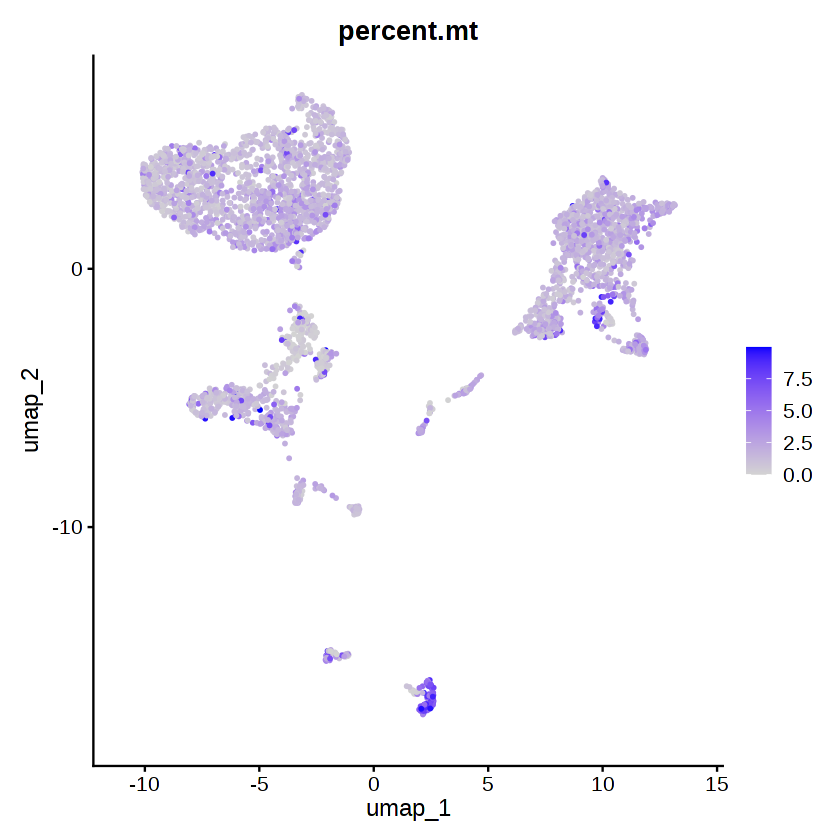

In [ ]:
# Some nice clusters!  First let's make sure none of them are driven by QC artifacts.

scPlot <- FeaturePlot(sampleA, features=c("percent.mt"))
scPlot
#ggsave("25-FeaturePlot.png",plot = scPlot, bg = 'white')

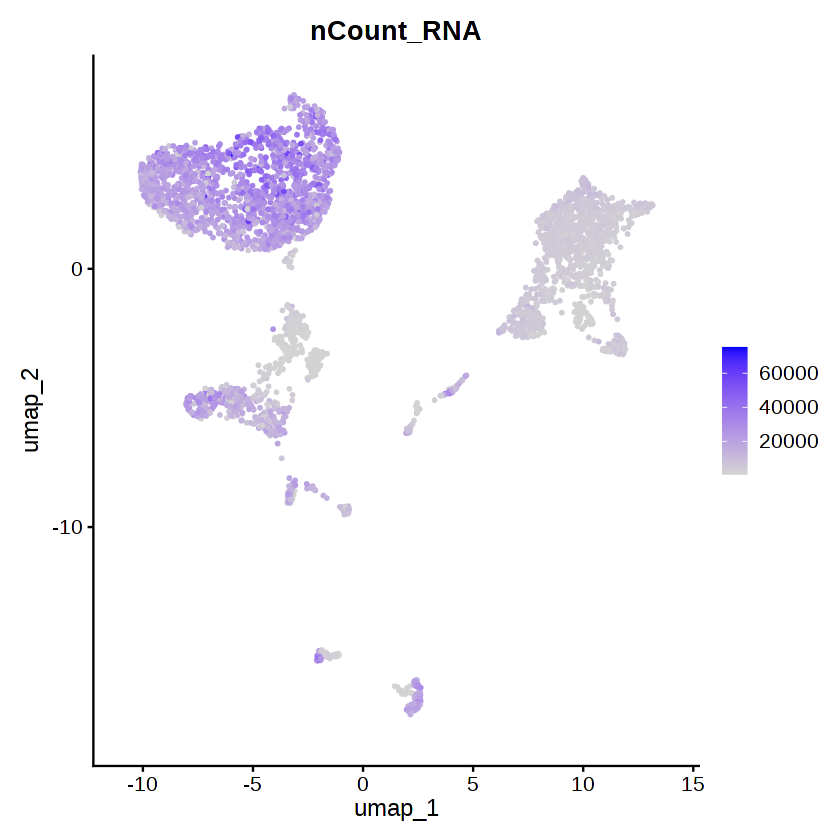

In [ ]:
scPlot <- FeaturePlot(sampleA, features=c("nCount_RNA"))
scPlot
#ggsave("26-FeaturePlot.png",plot = scPlot, bg = 'white')

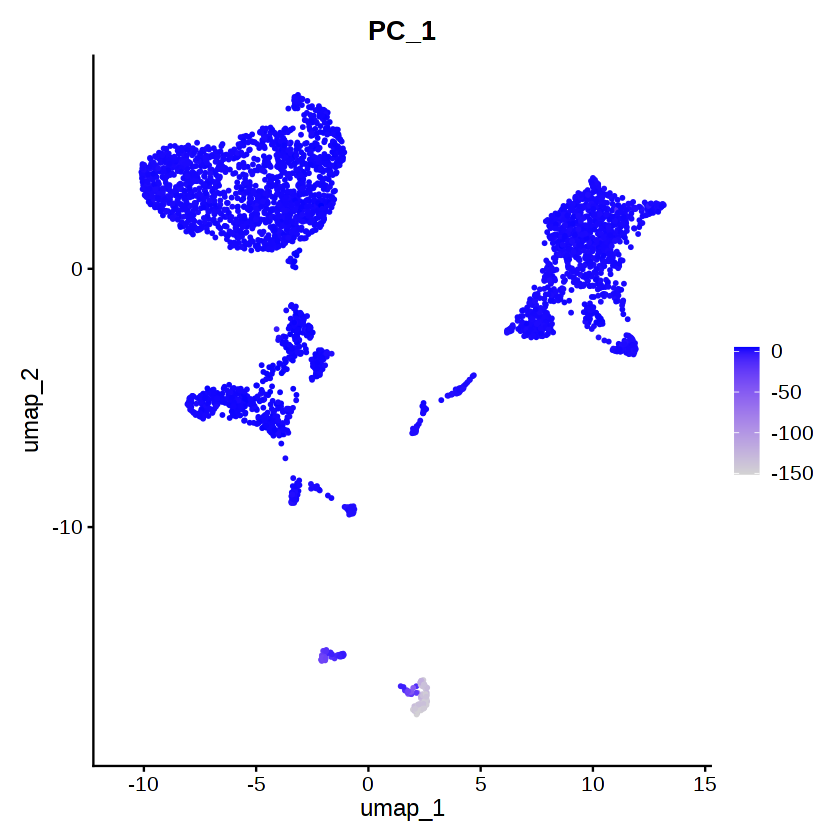

In [ ]:
# This looks good.  It does not seem like either percent mitochronrial reads or the total UMI per cell is dominating any of the structure we see in the UMAP.

# While we're exploring, let's see about the top PCs.
#While both UMAP and PCA are in some sense trying to find natural variations in the data.
# They are very different calculations in detail and we should not assume they are (or are not) related.
scPlot <- FeaturePlot(sampleA, features=c("PC_1"))
scPlot
#ggsave("27-FeaturePlot.png",plot = scPlot, bg = 'white')

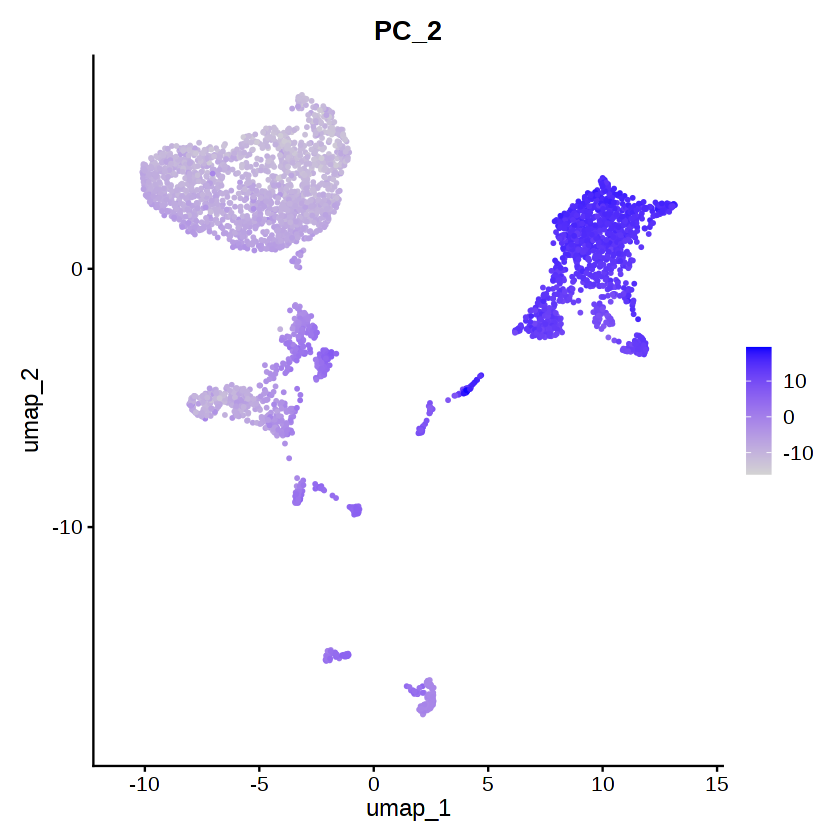

In [ ]:
# PC1 does seem to be separating the cells on the far right from the others.
scPlot <- FeaturePlot(sampleA, features=c("PC_2"))
scPlot
#ggsave("28-FeaturePlot.png",plot = scPlot, bg = 'white')

In [ ]:
# PC2 seems to mostly be defining a gradient just across cells within the cloud in the top left
# Now let's look at some individual genes. For an unsupervised approach we could start with some of the most variable genes
top10

[1] "CAPS"     "C20orf85" "GSTA1"    "C9orf24"  "IGFBP7"   "C2orf40" 
 [7] "SAA1"     "HAMP"     "LCN2"     "WFDC2"

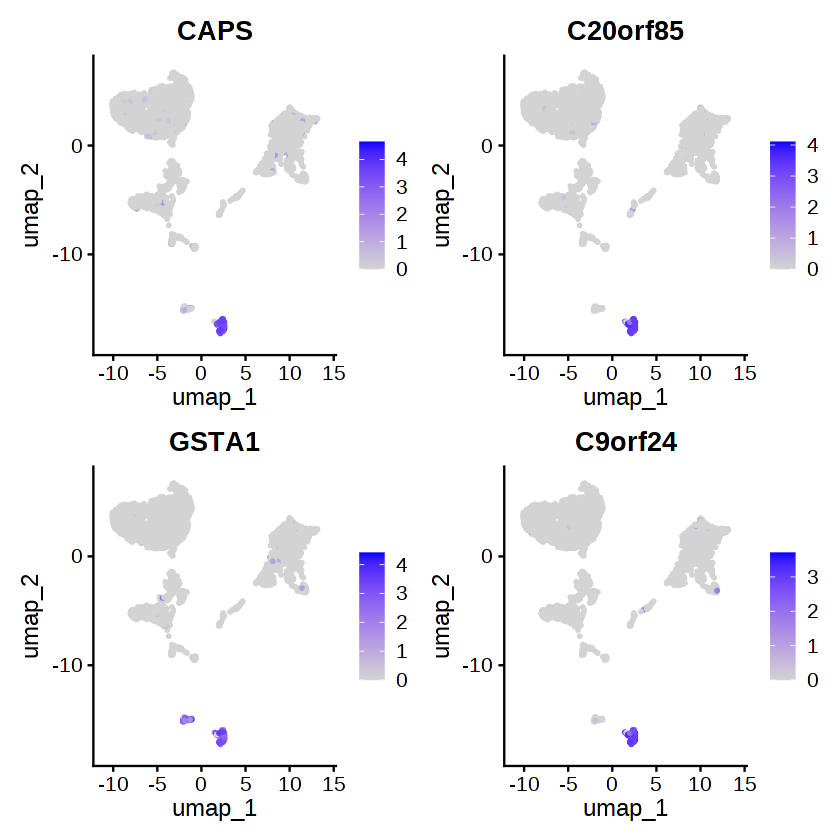

In [ ]:
scPlot <- FeaturePlot(sampleA, features=top10[1:4], ncol=2)
scPlot
#ggsave("29-FeaturePlot.png",plot = scPlot, bg = 'white')

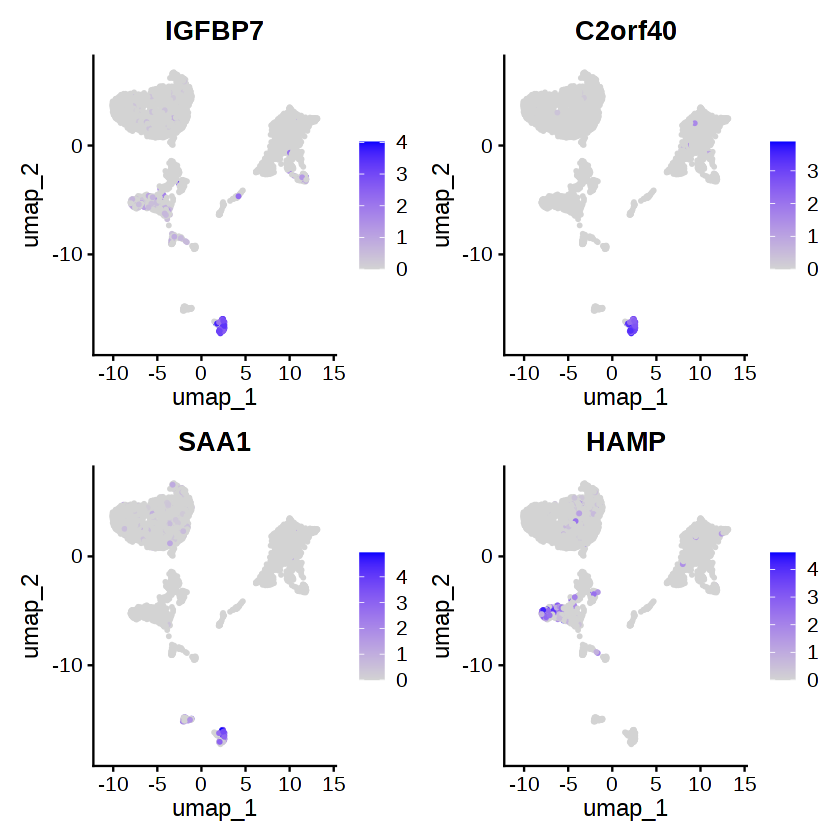

In [ ]:
scPlot <- FeaturePlot(sampleA, features=top10[5:8], ncol=2)
scPlot
#ggsave("30-FeaturePlot.png",plot = scPlot, bg = 'white')

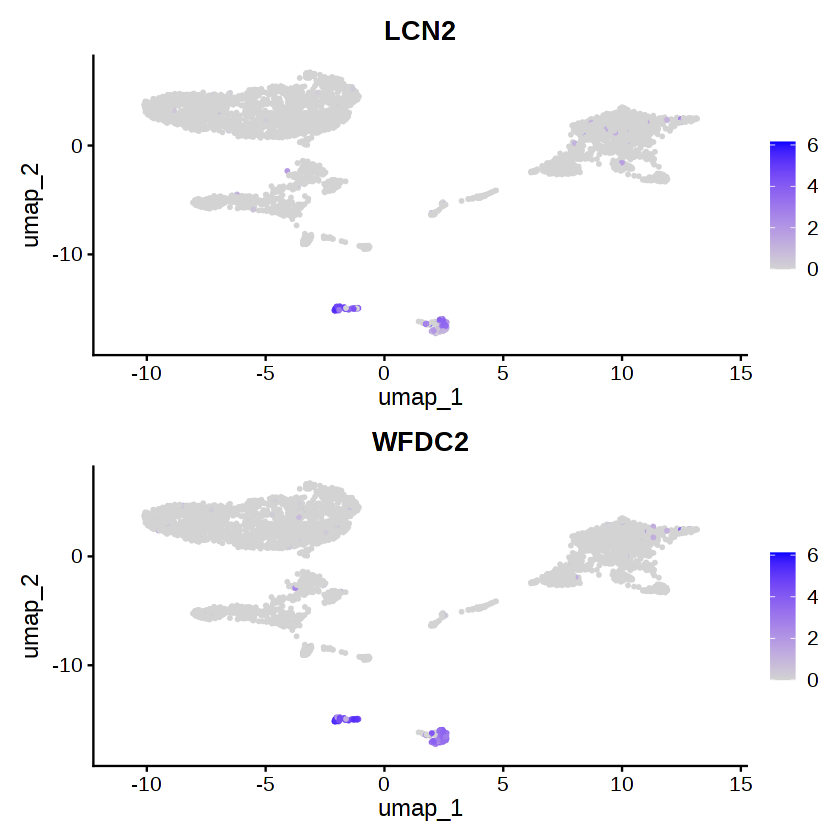

In [ ]:
scPlot <- FeaturePlot(sampleA, features=top10[9:10], ncol=1)
scPlot
#ggsave("31-FeaturePlot.png",plot = scPlot, bg = 'white')

In [ ]:
# We can also look at some of the genes from top PCs
print(sampleA[["pca"]], dims=1:5, nfeatures=2)

PC_ 1 
Positive:  CTSC, CD52 
Negative:  LRRIQ1, EFCAB1 
PC_ 2 
Positive:  IL32, CD3E 
Negative:  CD68, SERPING1 
PC_ 3 
Positive:  CYP2F1, SCGB3A1 
Negative:  FGF14, CD52 
PC_ 4 
Positive:  MCEMP1, HP 
Negative:  MARCKS, SDS 
PC_ 5 
Positive:  CCL8, CCL5 
Negative:  JCHAIN, SPIB 


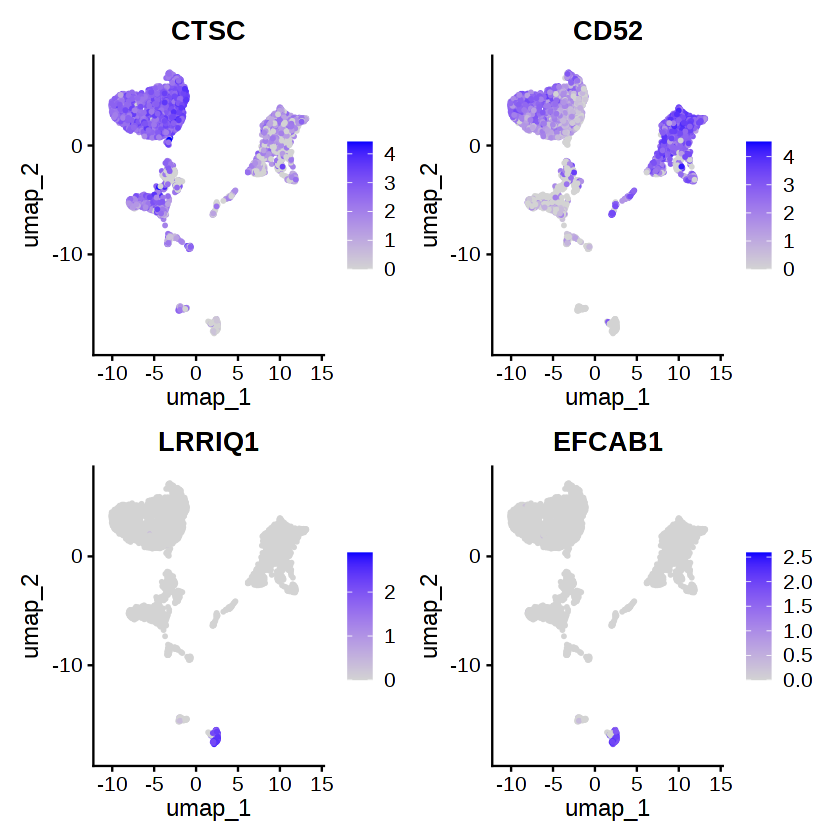

In [ ]:
scPlot <- FeaturePlot(sampleA, features=c("CTSC", "CD52", "LRRIQ1", "EFCAB1"))
scPlot
#ggsave("32-FeaturePlot.png",plot = scPlot, bg = 'white')

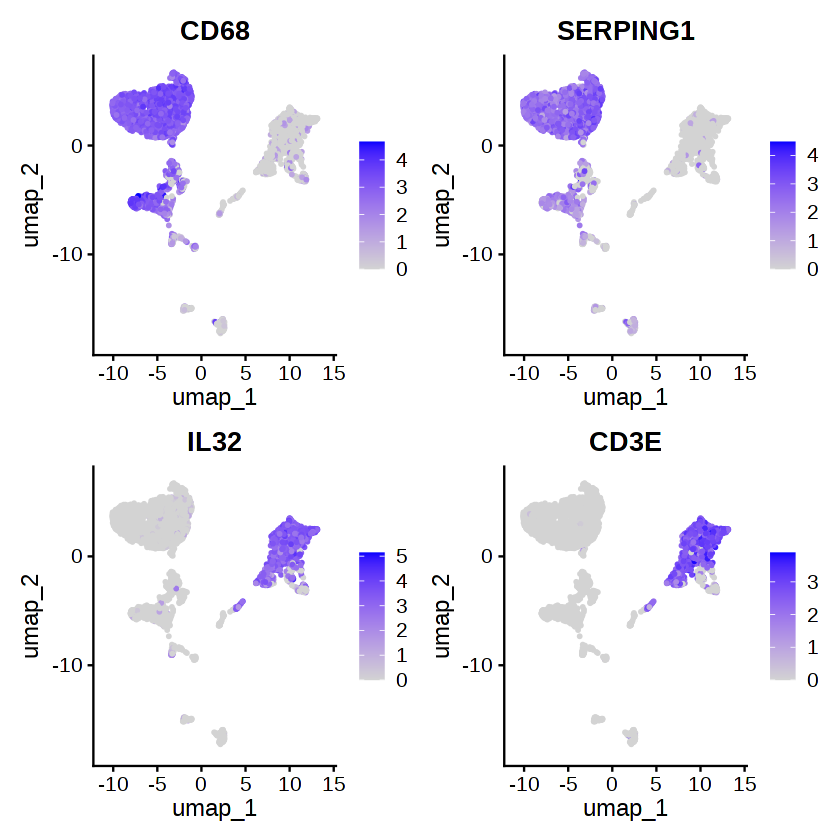

In [ ]:
scPlot <- FeaturePlot(sampleA, features=c("CD68", "SERPING1", "IL32", "CD3E"))
scPlot
#ggsave("33-FeaturePlot.png",plot = scPlot, bg = 'white')

# Clustering

Clustering is a method used in data analysis to group objects (such as cells, genes, or other entities) based on their similarities. In the context of scRNA-seq, clustering helps identify distinct cell populations by grouping cells with similar gene expression profiles. Now, let's perform formal clustering on this data. While there are various clustering algorithms available, we will use a nearest-neighbor graph approach combined with the Louvain algorithm to identify clusters or communities within the data.

This method works by building a graph where each data point (cell) is connected to its nearest neighbors, and then the Louvain algorithm is used to find groups of points that are densely connected to each other, indicating clusters.

One advantage of this approach is that it relies on distance metrics to the nearest neighbors, making it relatively robust to the curse of dimensionality. This means that it performs better than some other algorithms when working with high-dimensional data, such as single-cell RNA-seq data, where many variables can complicate clustering. Therefore, the nearest-neighbor graph and Louvain algorithm are a good choice for detecting meaningful clusters in complex datasets.

We'll calculate distances in the first 20 dimensions.

In [ ]:
sampleA <- FindNeighbors(sampleA, dims=1:20)
sampleA <- FindClusters(sampleA)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3594
Number of edges: 120333

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8638
Number of communities: 17
Elapsed time: 0 seconds


Now we will visualize cluster membership in the UMAP space.

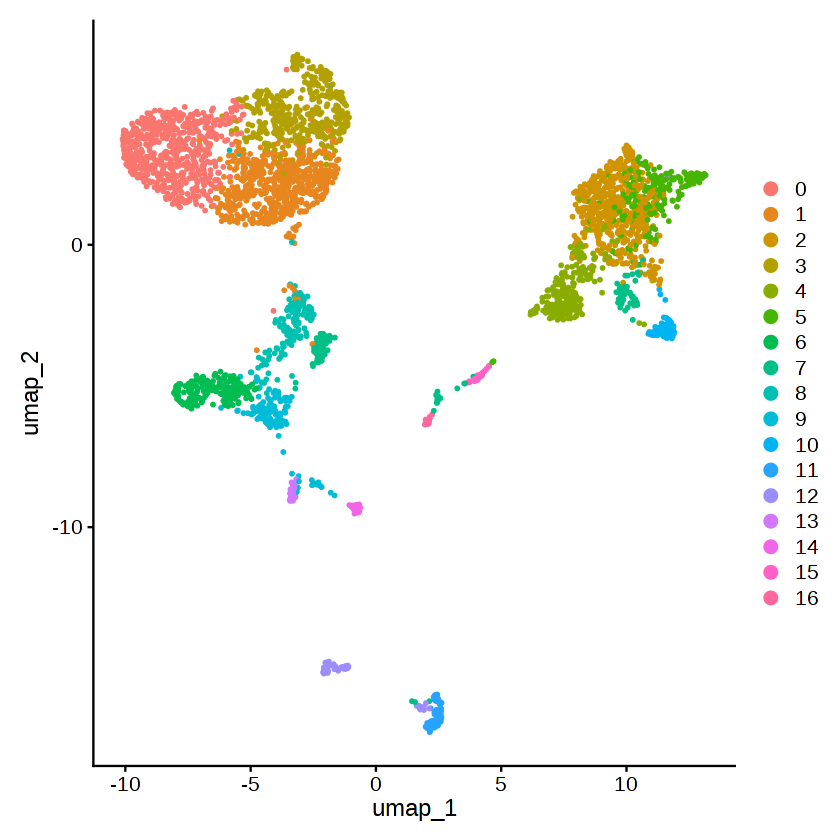

In [ ]:
scPlot <- DimPlot(sampleA, reduction="umap")
scPlot
#ggsave("34-DimPlot.png",plot = scPlot, bg = 'white')

Almost all clustering algorithms have some sort of free parameter that controls how many clusters are identified.

In the Louvain algorithm we have the *resolution* which, holding all other parameters (such as the dimensions, the number of nearest neighbors, etc) constant, controls the number of clusters.  Low (high) values for resultion give low (high) numbers of clusters.

In [ ]:
# Let's explore this.
sampleA <- FindClusters(sampleA, resolution=0.01)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3594
Number of edges: 120333

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9927
Number of communities: 3
Elapsed time: 0 seconds


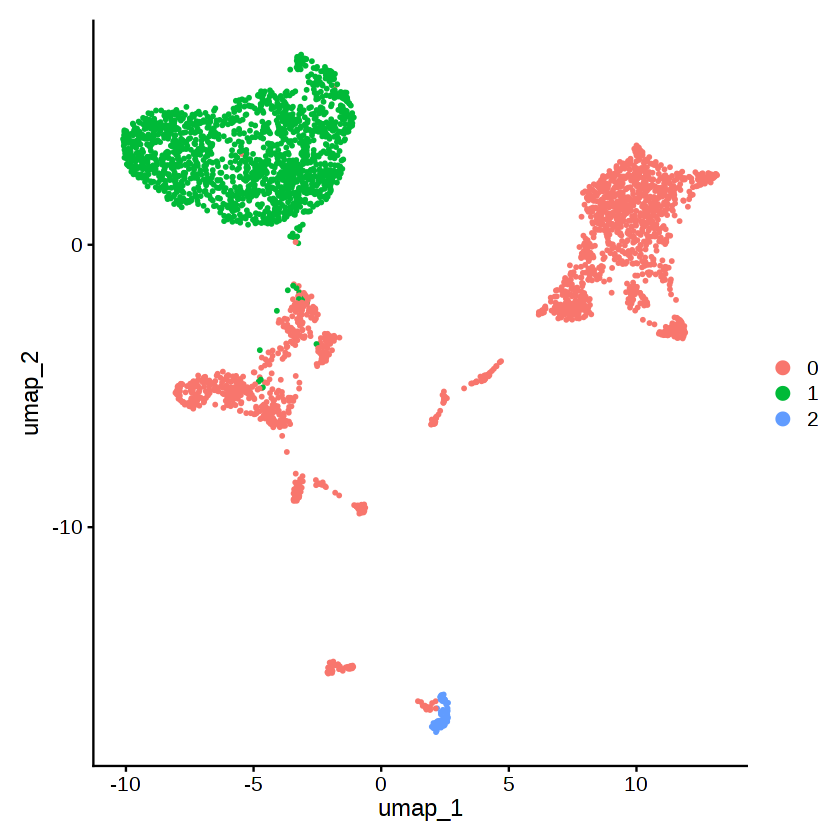

In [ ]:
scPlot <- DimPlot(sampleA, reduction="umap")
scPlot
#ggsave("35-DimPlot.png",plot = scPlot, bg = 'white')

In [ ]:
sampleA <- FindClusters(sampleA, resolution=10)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3594
Number of edges: 120333

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.5219
Number of communities: 62
Elapsed time: 0 seconds


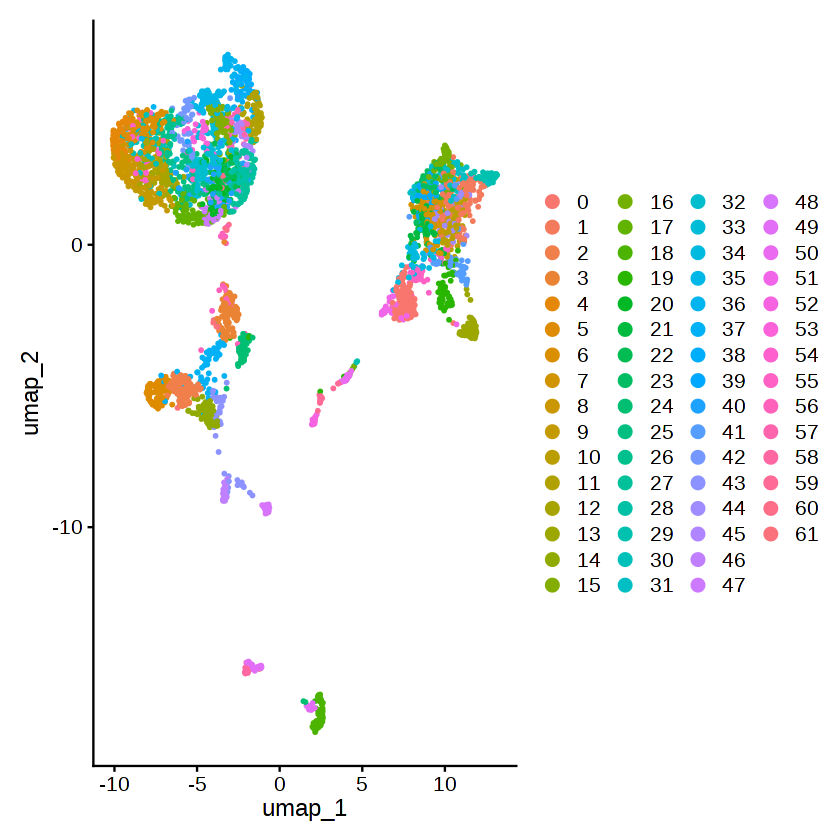

In [ ]:
scPlot <- DimPlot(sampleA)
scPlot
#ggsave("36-DimPlot.png",plot = scPlot, bg = 'white')

It can be useful to see how clusters corresponding to one value of *resolution* correspond to those from another *resolution*.  The clustree package does a nice job of visualizing this over the clusterings we have already performed.

In [ ]:
head(sampleA[[]])

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.8,seurat_clusters,RNA_snn_res.0.01,RNA_snn_res.10,RNA_snn_res.0.1,RNA_snn_res.0.2,⋯,RNA_snn_res.1.1,RNA_snn_res.1.2,RNA_snn_res.1.3,RNA_snn_res.1.4,RNA_snn_res.1.5,RNA_snn_res.1.6,RNA_snn_res.1.7,RNA_snn_res.1.8,RNA_snn_res.1.9,RNA_snn_res.2
,<fct>,<dbl>,<int>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
AAACCTGAGATGTCGG-1,sampleA,3731,1594,1.4473332,2,41,0,41,1,1,⋯,2,1,1,1,1,1,0,0,3,2
AAACCTGAGGCTCATT-1,sampleA,33339,5273,1.3827649,0,6,1,6,0,2,⋯,0,2,3,2,2,2,11,13,14,13
AAACCTGCAATCCGAT-1,sampleA,5727,1789,0.0698446,8,42,1,42,0,4,⋯,8,2,3,2,2,2,11,13,14,13
AAACCTGCATGGTCAT-1,sampleA,4396,2002,0.7051865,4,51,0,51,1,5,⋯,5,5,6,21,7,22,24,24,25,25
AAACCTGGTTTAGCTG-1,sampleA,3219,1451,2.5473750,2,23,0,23,1,1,⋯,3,3,4,3,3,3,2,2,1,1
AAACCTGTCAATCACG-1,sampleA,4002,1691,2.0239880,4,55,0,55,1,5,⋯,5,5,6,6,7,8,9,9,9,9


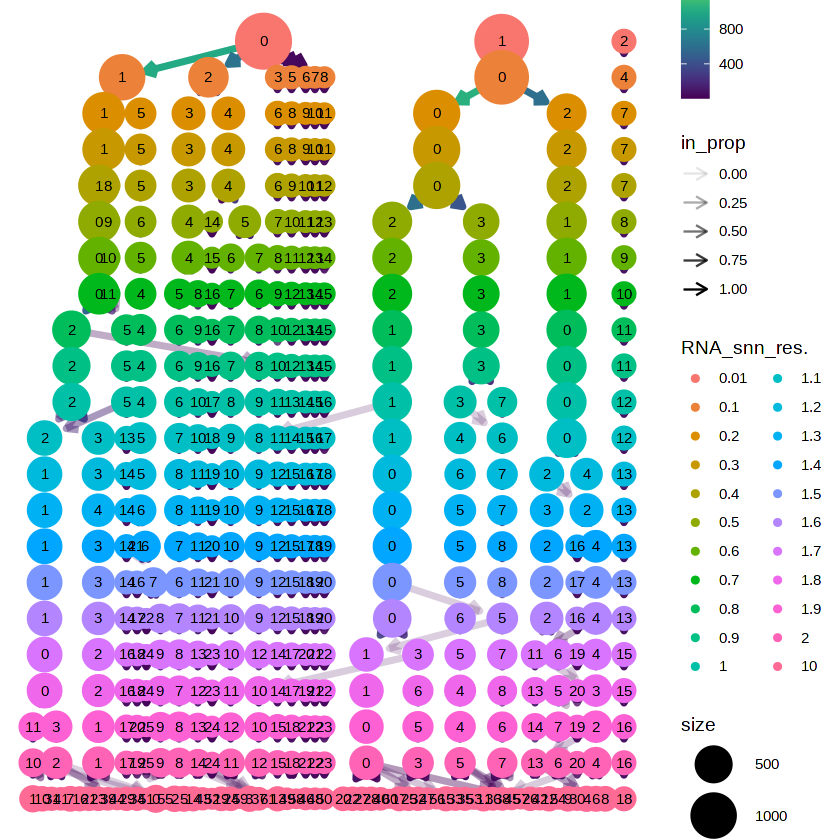

In [ ]:
scPlot <- clustree(sampleA,prefix="RNA_snn_res.")
scPlot
#ggsave("37-clustree.png",plot = scPlot, bg = 'white', width = 16, height = 9)

In [ ]:
sampleA <- FindClusters(sampleA, resolution=seq(0.1, 2, by=0.1))

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3594
Number of edges: 120333

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9637
Number of communities: 9
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3594
Number of edges: 120333

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9428
Number of communities: 12
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3594
Number of edges: 120333

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9268
Number of communities: 12
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3594
Number of edges: 120333

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9113
Number of communities: 13
Elapsed time: 0 seconds
Modularity Optimi

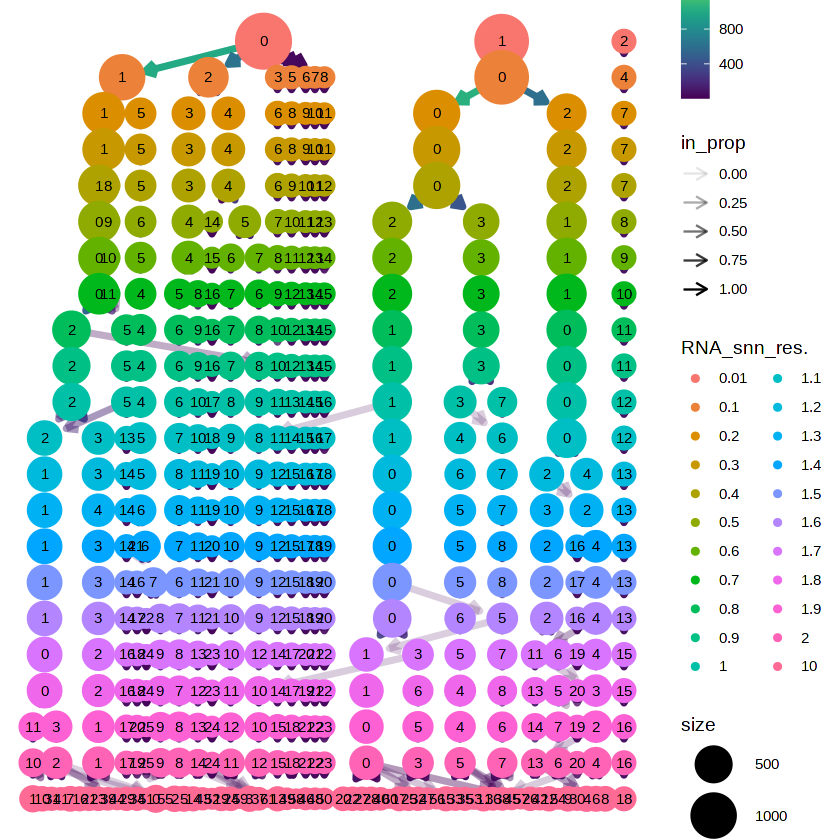

In [ ]:
scPlot <- clustree(sampleA,prefix="RNA_snn_res.")
scPlot
#ggsave("38-clustree.png",plot = scPlot, bg = 'white', width = 16, height = 9)

Now let's go back to the resolution that gave us three clusters

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3594
Number of edges: 120333

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9927
Number of communities: 3
Elapsed time: 0 seconds


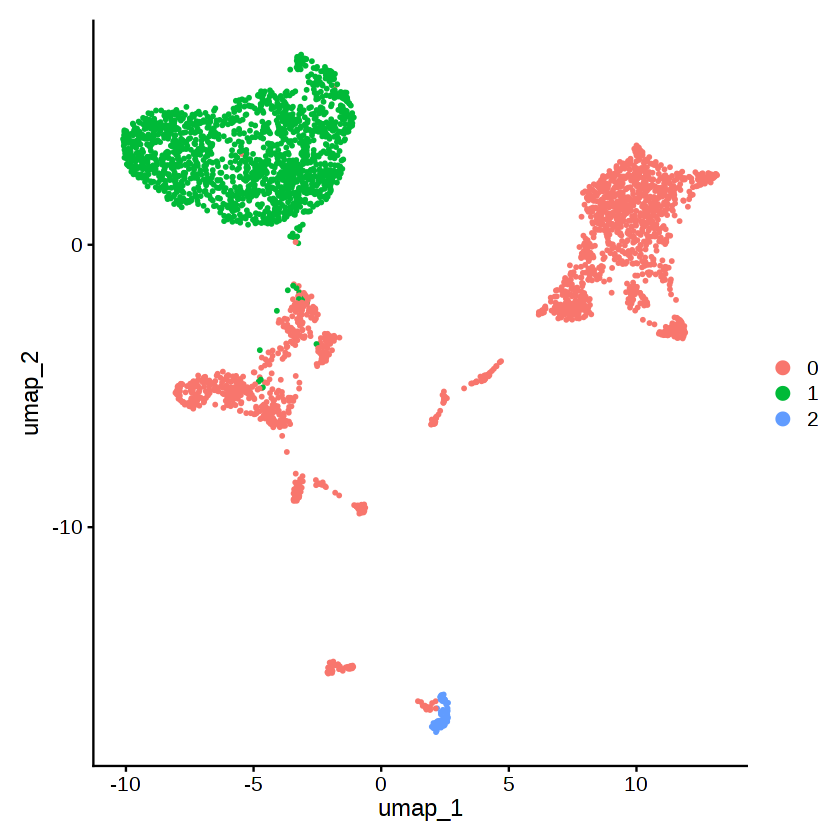

In [ ]:
sampleA <- FindClusters(sampleA,resolution=0.01)
scPlot <- DimPlot(sampleA)
scPlot
#ggsave("39-DimPlot.png",plot = scPlot, bg = 'white')

Here is how we can identify marker genes for cluster 0

In [ ]:
cluster0.markers <- FindMarkers(sampleA, ident.1=0, min.pct=0.25)
head(cluster0.markers)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CES1,0,-4.365873,0.087,0.960,0
MARCO,0,-4.660706,0.099,0.956,0
AC026369.3,0,-3.780974,0.032,0.869,0
TREM1,0,-3.432157,0.074,0.903,0
RBP4,0,-5.360687,0.022,0.850,0
CYP27A1,0,-2.364459,0.130,0.954,0


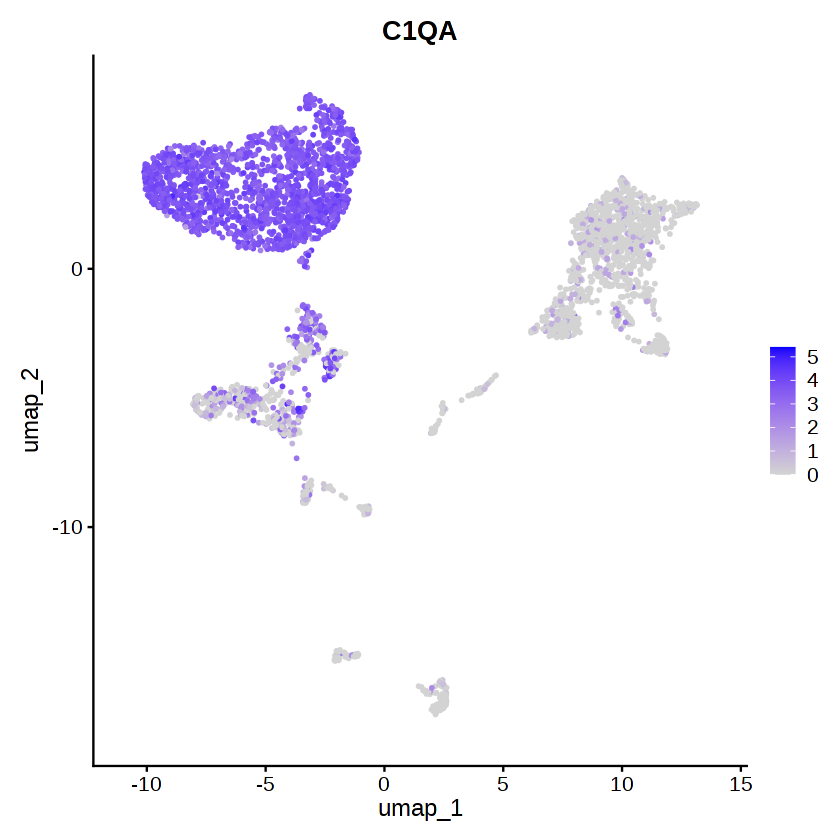

In [ ]:
scPlot <- FeaturePlot(sampleA,features="C1QA")
scPlot
#ggsave("40-FeaturePlot.png",plot = scPlot, bg = 'white')

Since we didn't specify, the previous calculation gave us genes either significantly over or under expressed in our population of interest. Sometimes we just want over expressed genes, which is easy to filter for.

In [ ]:
cluster0.markers <- FindMarkers(sampleA, ident.1=0, min.pct=0.25,only.pos=T)
head(cluster0.markers, 10)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CORO1A,1.187011e-316,5.322092,0.781,0.315,2.406189e-312
LIMD2,8.574591e-314,6.757796,0.650,0.052,1.738155e-309
PTPRCAP,1.762729e-303,10.582919,0.592,0.007,3.573229e-299
CD48,1.313382e-300,4.655884,0.736,0.234,2.662356e-296
IFITM1,1.256971e-285,2.456256,0.921,0.893,2.548006e-281
CD3E,3.487291e-283,10.092097,0.566,0.010,7.069088e-279
CLEC2D,2.444715e-281,8.739041,0.571,0.017,4.955682e-277
IL32,4.177045e-276,8.201275,0.607,0.064,8.467289e-272
CD2,1.037159e-268,9.269003,0.560,0.024,2.102426e-264


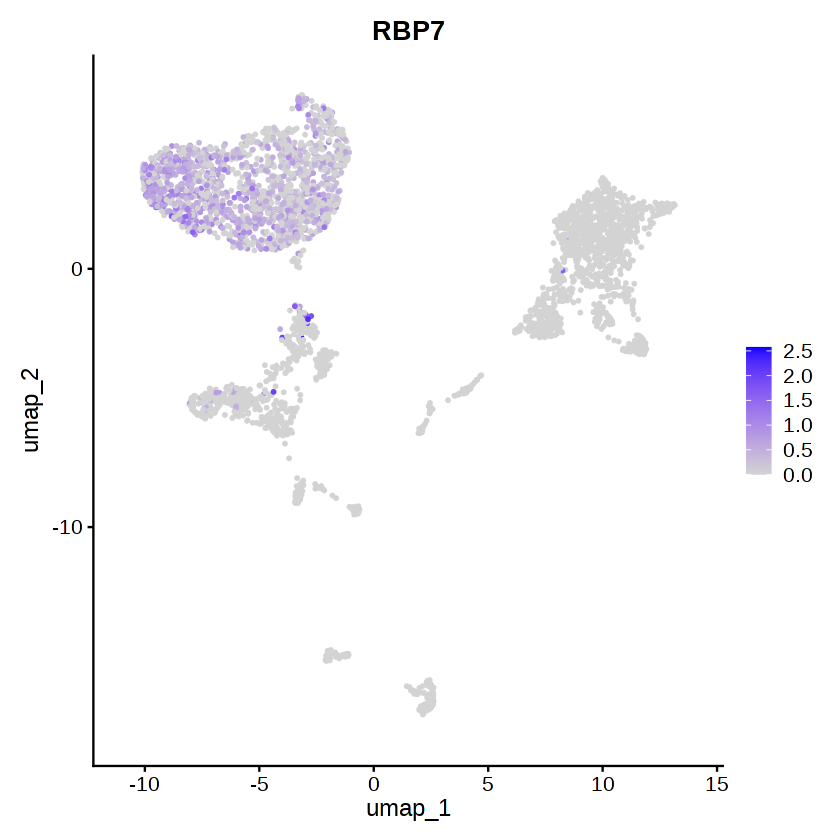

In [ ]:
scPlot <- FeaturePlot(sampleA, features="RBP7")
scPlot
#ggsave("41-FeaturePlot.png",plot = scPlot, bg = 'white')

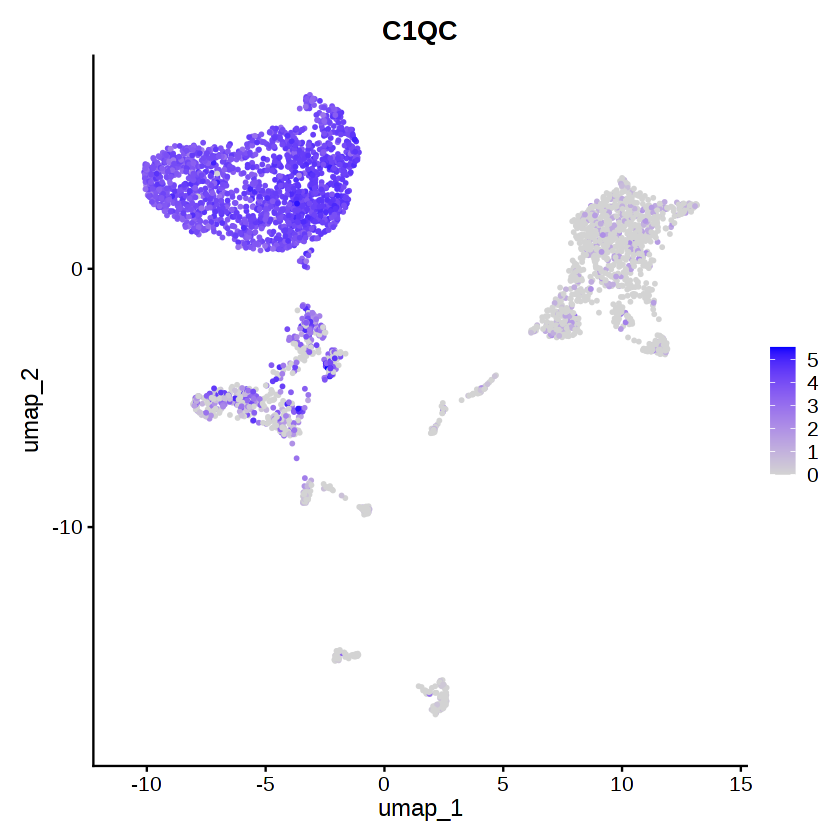

In [ ]:
scPlot <- FeaturePlot(sampleA, features=c("C1QC"))
scPlot
#ggsave("42-FeaturePlot.png",plot = scPlot, bg = 'white')

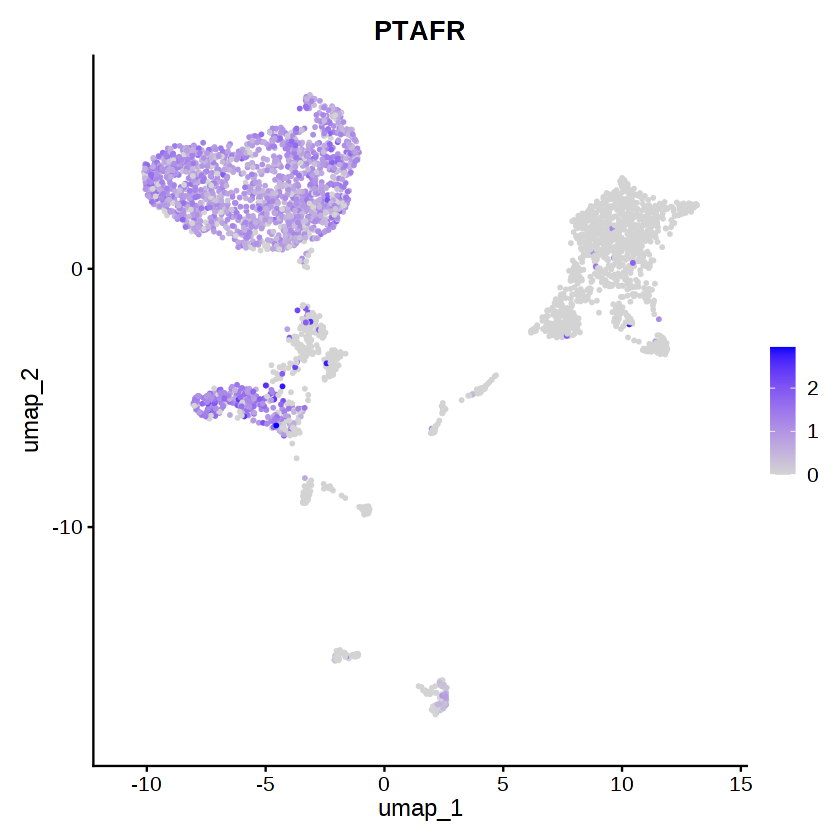

In [ ]:
scPlot <- FeaturePlot(sampleA, features=c("PTAFR"))
scPlot
#ggsave("43-FeaturePlot.png",plot = scPlot, bg = 'white')

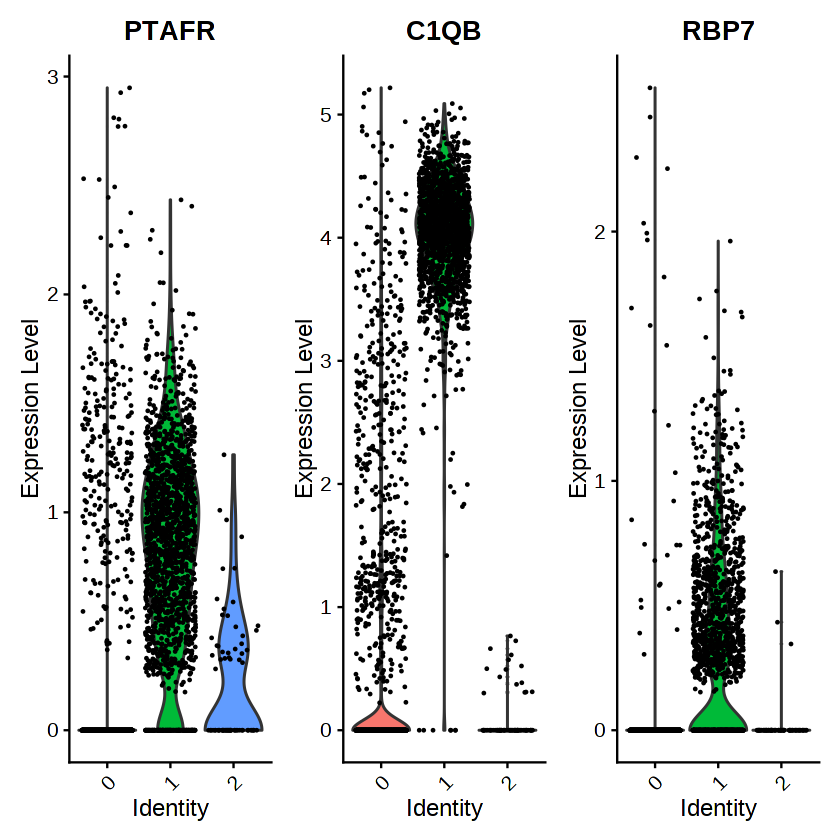

In [ ]:
# It's always good to try multiple different visualizations.
scPlot <- VlnPlot(sampleA, features=c("PTAFR", "C1QB", "RBP7"))
scPlot
#ggsave("44-VlnPlot.png",plot = scPlot, bg = 'white')

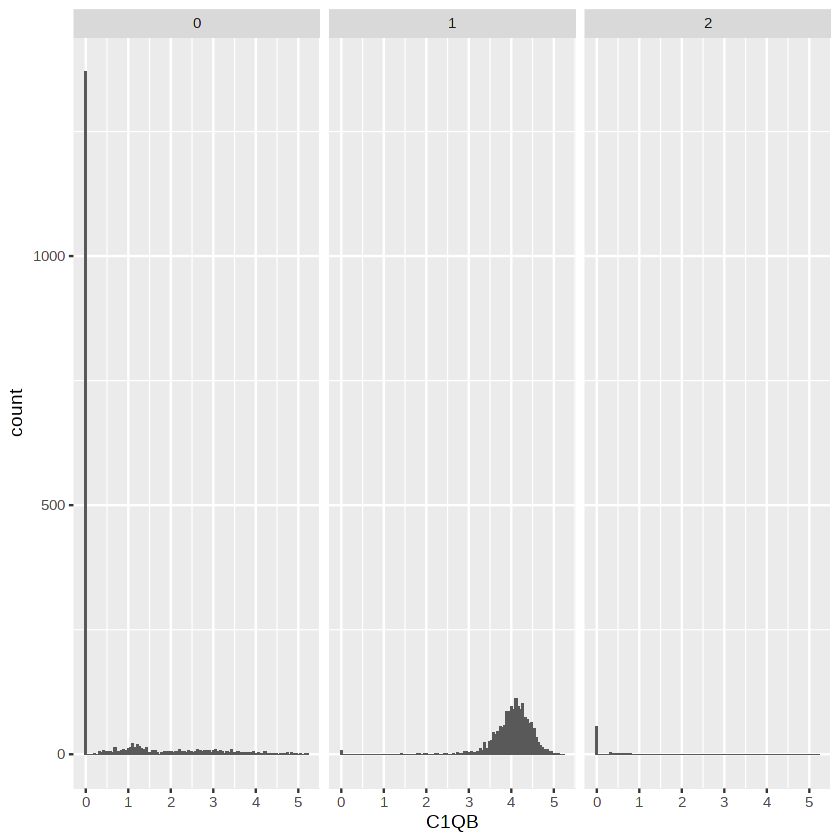

In [ ]:
scPlot <- sampleA %>%
          FetchData(vars=c("C1QB", "seurat_clusters")) %>%
          ggplot() +
          geom_histogram(aes(x=C1QB), bins=100) +
          facet_wrap(. ~ seurat_clusters)
scPlot
#ggsave("45-histogram.png",plot = scPlot, bg = 'white')

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2



,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
CORO1A,1.187011e-316,5.322092,0.781,0.315,2.406189e-312,0,CORO1A
LIMD2,8.574591e-314,6.757796,0.650,0.052,1.738155e-309,0,LIMD2
PTPRCAP,1.762729e-303,10.582919,0.592,0.007,3.573229e-299,0,PTPRCAP
CD48,1.313382e-300,4.655884,0.736,0.234,2.662356e-296,0,CD48
IFITM1,1.256971e-285,2.456256,0.921,0.893,2.548006e-281,0,IFITM1
CD3E,3.487291e-283,10.092097,0.566,0.010,7.069088e-279,0,CD3E


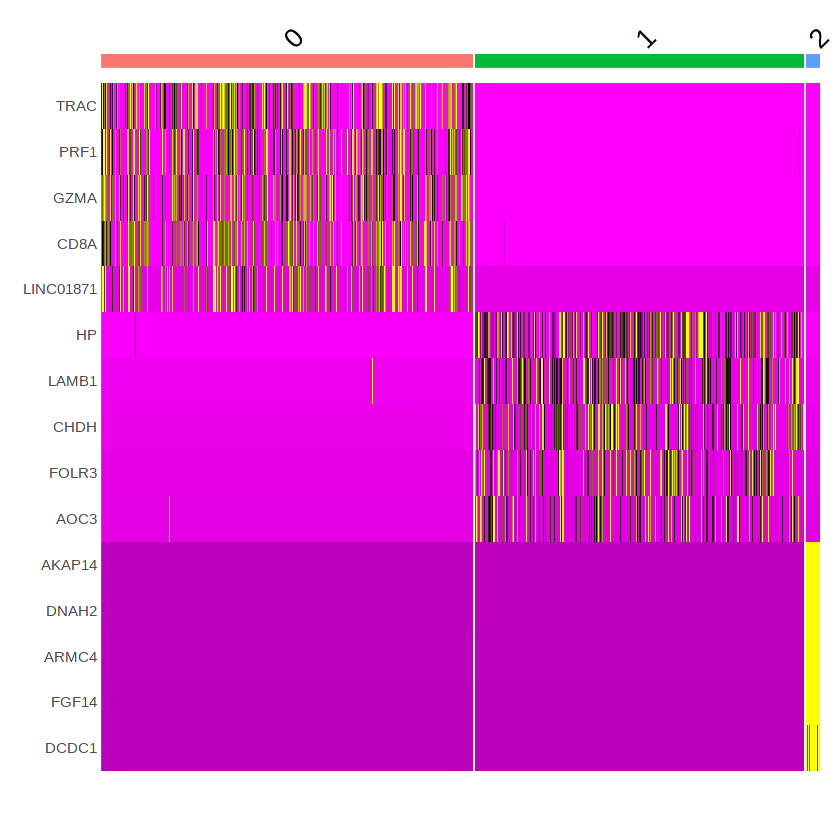

In [ ]:
# Now let's find over-expressed marker genes for all clusters.
sampleA.markers = FindAllMarkers(sampleA, only.pos=TRUE,
                            min.pct=0.25, logfc.threshold=0.25)
head(sampleA.markers)
topMarkers <- sampleA.markers %>%
  group_by(cluster) %>%
  top_n(n=5, wt=avg_log2FC)
scPlot <- DoHeatmap(sampleA, features = topMarkers$gene) + NoLegend()
scPlot
#ggsave("46-DoHeatmap.png",plot = scPlot, bg = 'white')

In [ ]:
# If we crank up the resolution a little we get some finer-grained separation
# of the UMAP clouds.
sampleA <- FindClusters(sampleA, resolution=0.2)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3594
Number of edges: 120333

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9428
Number of communities: 12
Elapsed time: 0 seconds


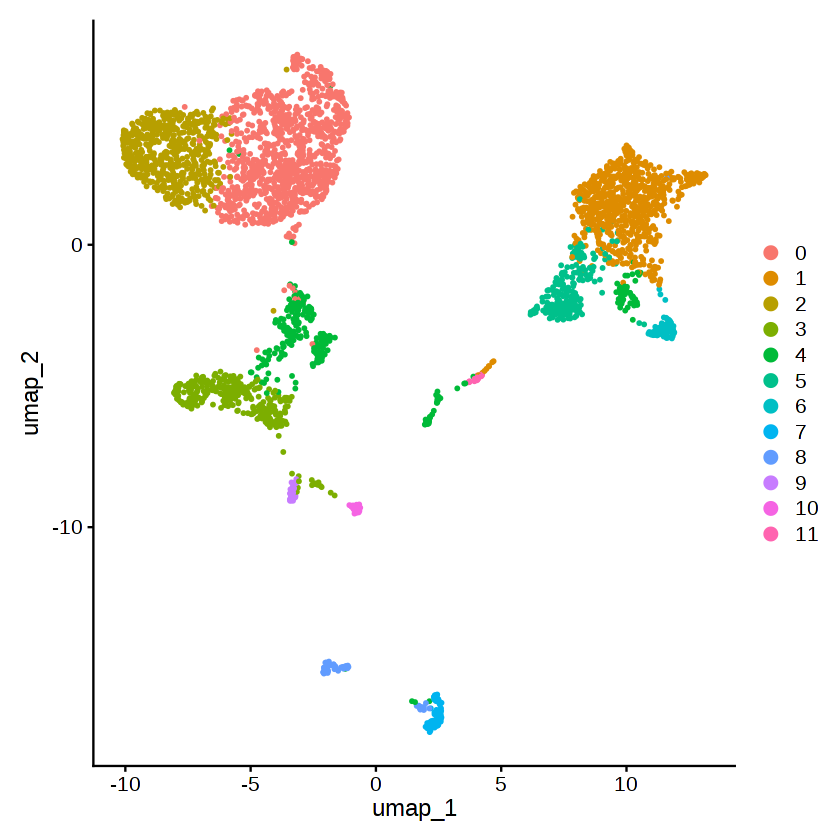

In [ ]:
scPlot <- DimPlot(sampleA)
scPlot
#ggsave("47-DoHeatmap.png",plot = scPlot, bg = 'white')

# Differential Expression

Differential expression in refers to the process of identifying genes that show significant differences in expression levels between different groups of cells or conditions. This analysis helps to uncover genes that are uniquely expressed in specific cell types, states, or in response to certain treatments or environmental factors.

In [ ]:
# Let's see if cluster 2 and cluster 0 really have different gene expression
# patterns and, if so, whether those match any biology we already know and
# might expect to see in PBMCs.
cluster1vs0 <- FindMarkers(sampleA, ident.1 = 2, ident.2 = 0)
head(cluster1vs0, 20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MCEMP1,3.734748e-215,3.264979,0.997,0.465,7.570707e-211
APOBEC3A,4.466682e-154,-2.645887,0.684,0.976,9.054412e-150
ALOX5AP,1.135428e-146,1.198740,0.997,0.972,2.301627e-142
IFITM1,4.665433e-133,-2.213566,0.754,0.968,9.457299e-129
HP,7.828136e-130,2.820727,0.891,0.438,1.586841e-125
STAC,1.823431e-125,2.556757,0.818,0.336,3.696278e-121
LILRB4,1.475428e-124,-2.007875,0.666,0.928,2.990841e-120
MRC1,1.898157e-120,1.627032,0.977,0.863,3.847754e-116
MARCKS,1.248722e-119,-4.134538,0.109,0.703,2.531285e-115


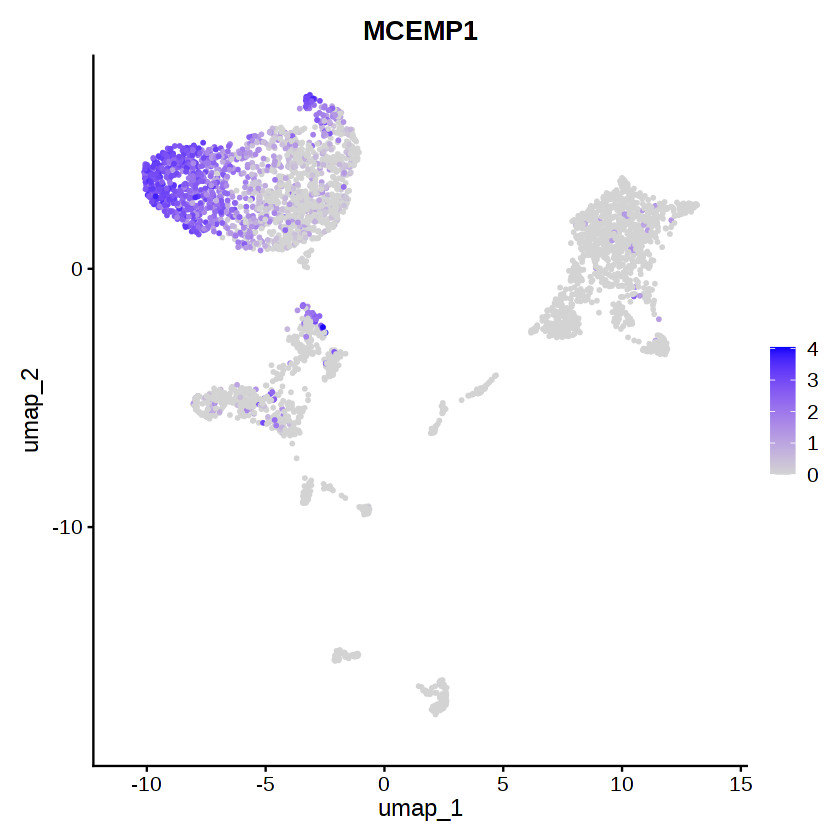

In [ ]:
scPlot <- FeaturePlot(sampleA, features="MCEMP1")
scPlot
#ggsave("48-FeaturePlot.png",plot = scPlot, bg = 'white')

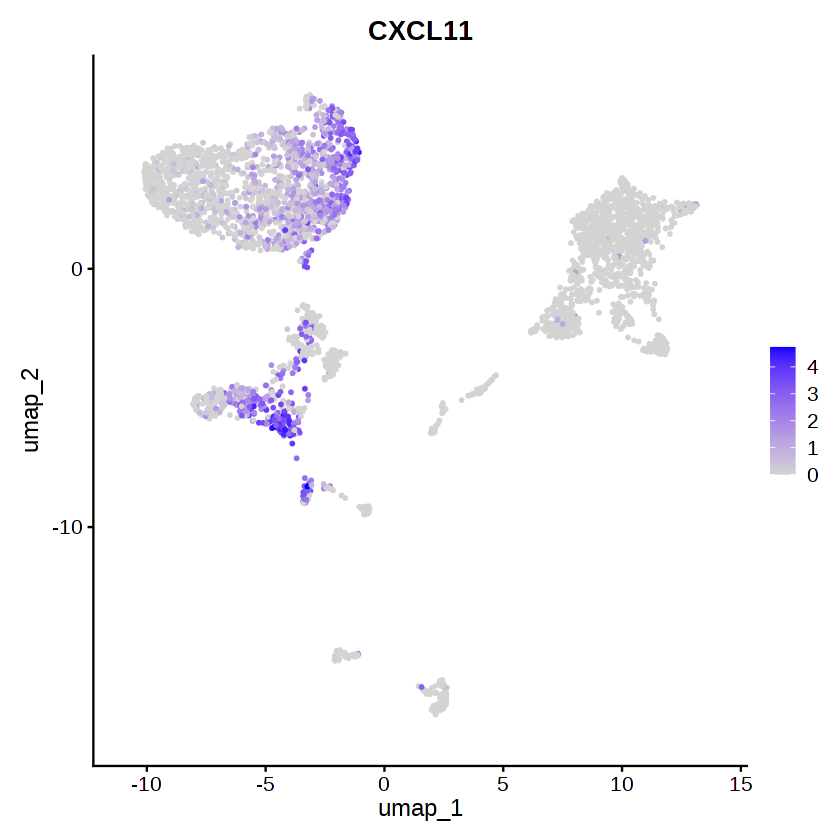

In [ ]:
scPlot <- FeaturePlot(sampleA, features="CXCL11")
scPlot
#ggsave("49-FeaturePlot.png",plot = scPlot, bg = 'white')

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11



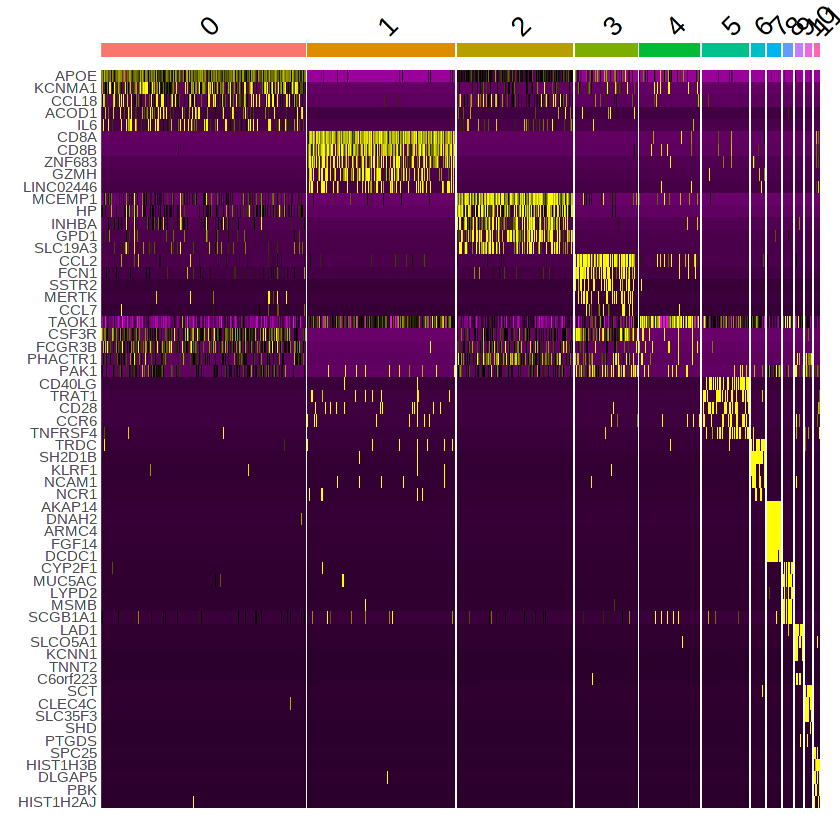

In [ ]:
# Note that CXCL11 is also expressed in another group.  We had
# ignored them when looking for differentially expressed genes between clusters
# 2 and 0 so this should not be surprising.
sampleA.markers = FindAllMarkers(sampleA, only.pos=TRUE, min.pct=0.25)
topMarkers = sampleA.markers %>%
  group_by(cluster) %>%
  top_n(n=5, wt=avg_log2FC)
scPlot <- DoHeatmap(sampleA, features = topMarkers$gene) + NoLegend()
scPlot
#ggsave("50-DoHeatmap.png",plot = scPlot, bg = 'white')

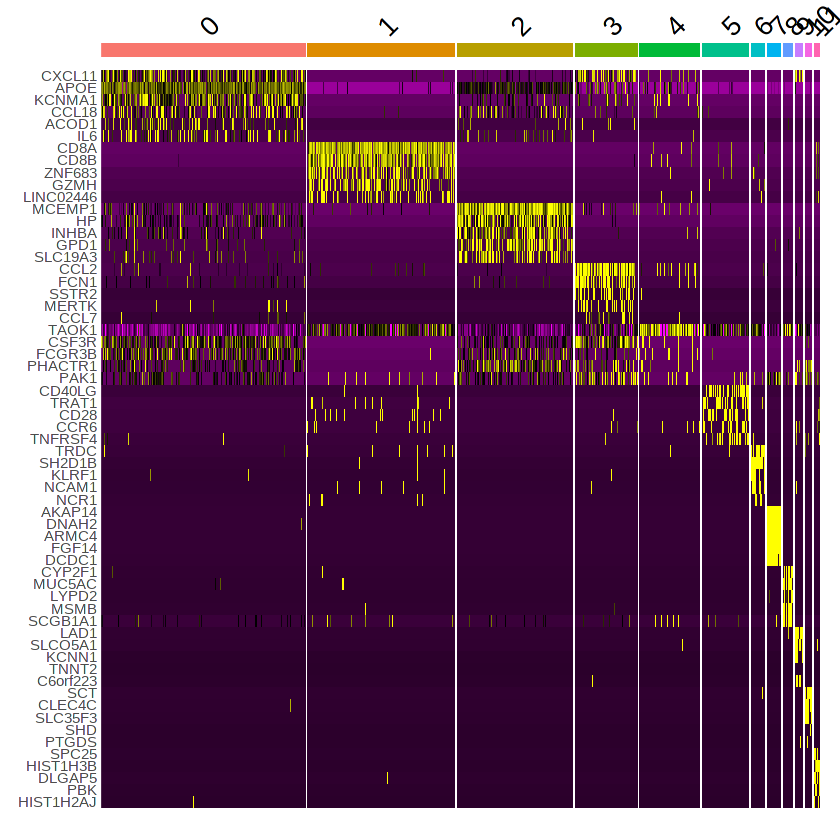

In [ ]:
topMarkers = sampleA.markers %>%
  group_by(cluster) %>%
  top_n(n=5, wt=avg_log2FC)
scPlot <- DoHeatmap(sampleA, features = c("CXCL11", topMarkers$gene)) + NoLegend()
scPlot
#ggsave("51-DoHeatmap.png",plot = scPlot, bg = 'white')

# Annotating Cell Types

Interpreting the results from single-cell data analysis is often the most challenging part of the process. To gain a deeper understanding beyond just the clusters we identified, we can annotate cell types by comparing the expression profiles from our data to a reference dataset (automated annotation) , or we can use canonical markers to identify the main cell types in our clusters (manual annotation). This approach allows us to provide more meaningful interpretations of the clusters and to follow downstream analysis.

Best practices recommend a hybrid approach, in which automated annotation is used as a starting point, followed by manual validation based on canonical markers and biological consistency. Using databases like [PanglaoDB](https://panglaodb.se/) and [CELLxGENE](https://cellxgene.cziscience.com/) can also be a useful alternative at this stage; for more information, please refer to our Module 01.

## Automated annotation



To start, we will load a reference dataset that includes the cell types we expect to encounter in our samples. The celldex package offers several well-curated and well-annotated reference datasets. Although most of these datasets originate from bulk RNA-Seq and microarray experiments, they are still very useful for annotating single-cell datasets. In our case, we will use the Blueprint and ENCODE reference datasets, which are commonly used for such purposes. These datasets will help us match the gene expression profiles from our single-cell data to known cell types, enhancing our ability to interpret the clusters meaningfully.

In R widely used tools include [SingleR](https://github.com/dviraran/SingleR), [Azimuth](https://github.com/satijalab/azimuth), and [scmap](https://bioconductor.org/packages/release/bioc/html/scmap.html), many of which integrate naturally with Seurat or the Bioconductor ecosystem.

In [ ]:
library(celldex)
ref = BlueprintEncodeData()
ref

class: SummarizedExperiment 
dim: 19859 259 
metadata(0):
assays(1): logcounts
rownames(19859): TSPAN6 TNMD ... LINC00550 GIMAP1-GIMAP5
rowData names(0):
colnames(259): mature.neutrophil
  CD14.positive..CD16.negative.classical.monocyte ...
  epithelial.cell.of.umbilical.artery.1
  dermis.lymphatic.vessel.endothelial.cell.1
colData names(3): label.main label.fine label.ont

Then, to use the `SingleR()` function, we need to convert the `Seurat` object to a `SingleCellExperiment` Bioconductor object. The `SingleR()` function takes our dataset, the reference dataset and the labels of the reference dataset.

In [ ]:
library(SingleR)
my.sce = as.SingleCellExperiment(sampleA)
pred = SingleR(my.sce, ref=ref, labels=ref$label.main)
table(pred$labels)


Attaching package: ‘SingleR’


The following objects are masked from ‘package:celldex’:

    BlueprintEncodeData, DatabaseImmuneCellExpressionData,
    HumanPrimaryCellAtlasData, ImmGenData, MonacoImmuneData,
    MouseRNAseqData, NovershternHematopoieticData


Found more than one class "package_version" in cache; using the first, from namespace 'SeuratObject'

Also defined by ‘alabaster.base’

Found more than one class "package_version" in cache; using the first, from namespace 'SeuratObject'

Also defined by ‘alabaster.base’

Found more than one class "package_version" in cache; using the first, from namespace 'SeuratObject'

Also defined by ‘alabaster.base’

Found more than one class "package_version" in cache; using the first, from namespace 'SeuratObject'

Also defined by ‘alabaster.base’




      Adipocytes          B-cells     CD4+ T-cells     CD8+ T-cells 
               3               83              104              950 
              DC Epithelial cells     Erythrocytes              HSC 
              60              110                4               13 
     Macrophages      Melanocytes  Mesangial cells        Monocytes 
            2019                2                1              136 
     Neutrophils         NK cells 
              10               99 

We can use a heatmap to visualize the resulting cell type annotation. At the top of the heatmap, we see the color code identifying the different cell types

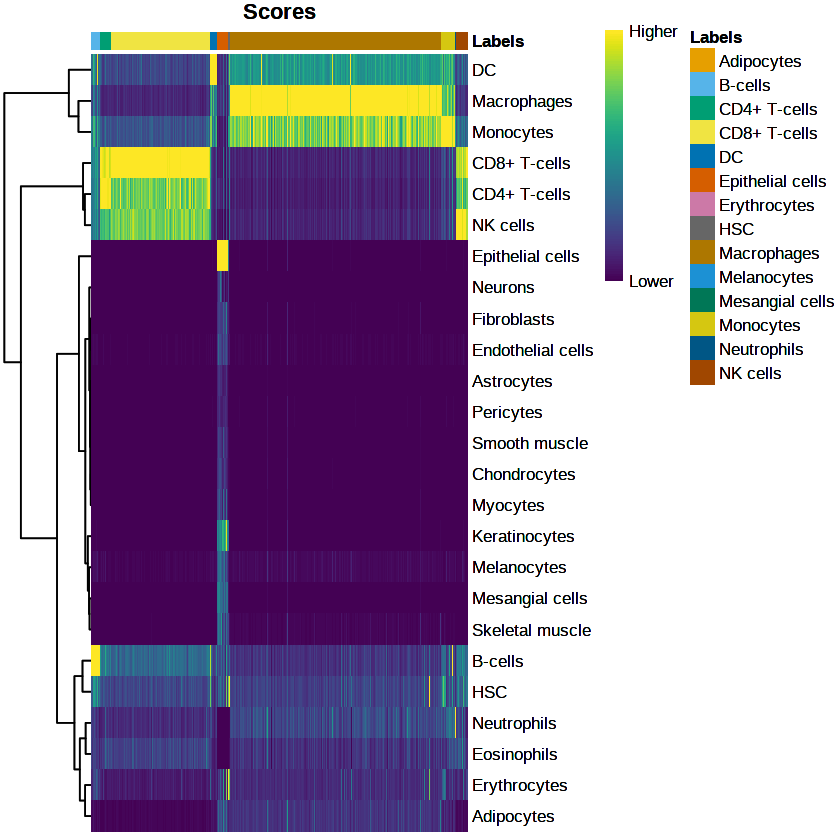

In [ ]:
#png("52-plotScoreHeatmap.png", res = 300, width = 1920, height = 1920)
plotScoreHeatmap(pred)
#dev.off()

A heatmap can also be used to show the distribution of the cell types by the clusters we identified using `Seurat`.

In [ ]:
my.table = table(Assigned = pred$pruned.labels, cluster = my.sce$seurat_clusters)
my.table
library(pheatmap)
pheatmap(log2(my.table + 1), filename = "53-pheatmap.png")

                  cluster
Assigned              0    1    2    3    4    5    6    7    8    9   10   11
  Adipocytes          0    0    0    0    0    0    0    0    3    0    0    0
  B-cells             0    0    0    1   48    0    0    1    0    0   29    4
  CD4+ T-cells        0    0    0    0    1   98    0    0    0    0    0    4
  CD8+ T-cells        0  741    0    0    6  142    0    0    1    0    0   20
  DC                  0    0    0   10    2    0    0    0    0   38    1    0
  Epithelial cells    0    0    0    0    0    0    0   70   35    0    0    0
  Erythrocytes        0    0    0    0    1    0    0    0    3    0    0    0
  HSC                 0    0    0    0    8    1    0    0    2    0    2    0
  Macrophages      1008    0  583  215    1    0    0    0    0    0    0    0
  Melanocytes         0    0    0    0    0    0    0    0    2    0    0    0
  Mesangial cells     0    0    0    0    0    0    0    0    1    0    0    0
  Monocytes           9   

## Manual annotation

This aproach is based on set of known gene markers associated with a cell type. In this step, a robust set of marker genes and pior knowledge (based on literature or specialist, e.g pathologist, immunologist), as well annotation experience is ideal to work well. However this step is crital to risk of unclear cell type annotations, incomplete detection of gene marker during sequencing and subjetivity.

There are ways to work with manual annotations, including:

* Annotation based on a set of marker genes from the cell populations that we expect to find in our data;
* Identifying the marker genes in each cluster to infer which cell type represents that population.

As our dataset is represented by bronchoalveolar immune cells in patients with COVID-19. Then, we expect to find immune cells in our clusters.  

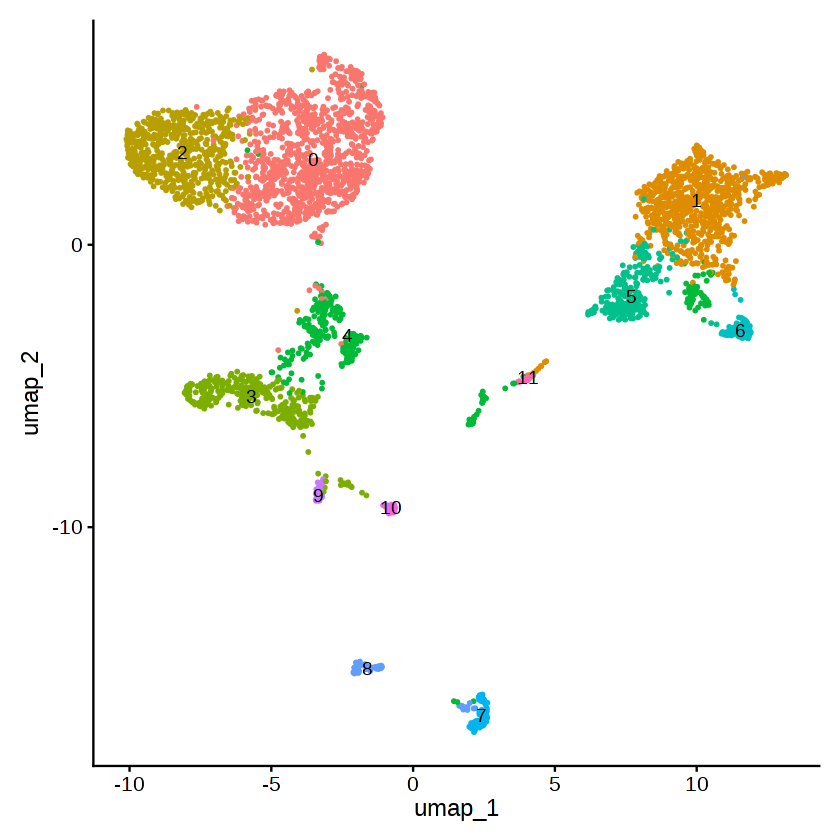

In [ ]:
scPlot <- DimPlot(sampleA, label = TRUE) + NoLegend()
scPlot

Let's create a panel of known markers for cell populations that we expect to find in our dataset.

Warning message:
“The following requested variables were not found: COL3A1, CDH11, PKHD1, HNF4A, SLC13A1, LMOD1, CARMN, SCN7A, FRMD5”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


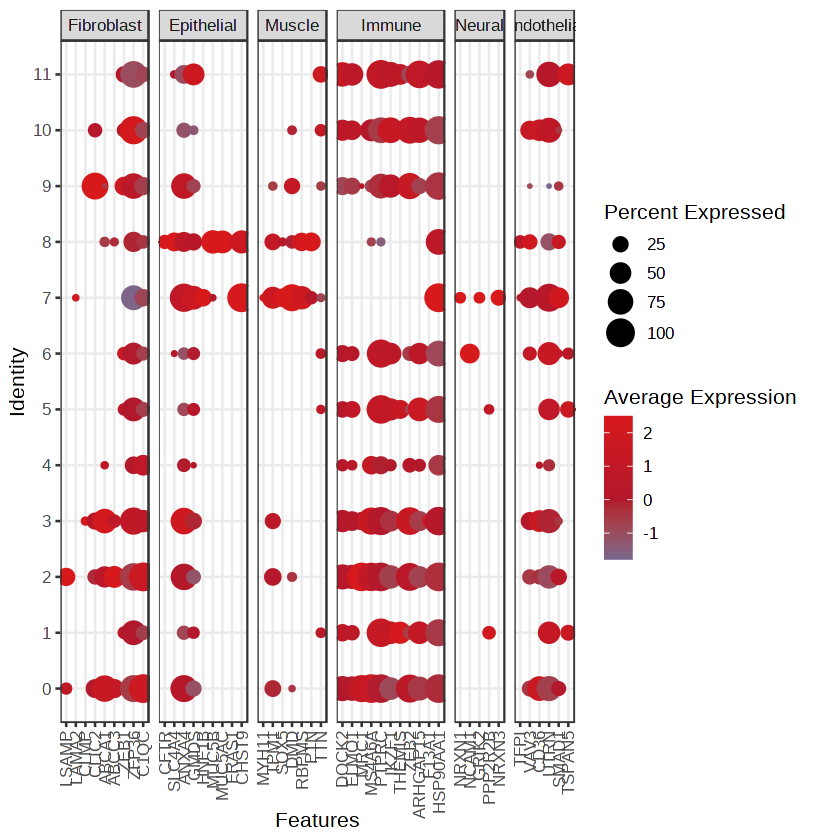

In [ ]:
# Select a set of marker genes for different cell types.
# Crie uma lista para cada população celular e seus respectivos marcadores
genes_markers = list(
  Fibroblast = c(
    "LSAMP","LAMA2","CLMP","CLIC2","ABCA1","RUNX1T1","ABCC3","ZEB1",
    "FBLN2","ZFP36","BNC2","COL3A1","PDGFRA","C1QC","CDH11","NAV3"
  ),
  Epithelial = c(
    "CALN1","MUC6","CFTR","SLC4A4","PKHD1","ANXA4","GMDS","HNF1B",
    "HNF4A","MUC5B","MUC5AC","PLAC8L1","SLC13A1","FRAS1","CHST9"
  ),
  Muscle = c(
    "MYH11","TPM1","LMOD1","RYR2","CARMN","SOX5","DMD","RBPMS",
    "PTN","TTN","CALD1","PRKG1","CACNA1C"
  ),
  Immune = c(
    "DOCK2","ELMO1","MRC1","MS4A6A","PTPRC","IKZF1","THEMIS",
    "ZEB2","ARHGAP15","F13A1","HSP90AA1"
  ),
  Neural = c(
    "NRXN1","NCAM1","GRIK2","SORCS1","CADM2","PPP2R2B","SCN7A",
    "FRMD5","NRXN3","ZNF536"
  ),
  Endothelial = c(
    "TFPI","FLRT2","VAV3","CD36","UTRN","SMAD1","MMRN1","TSPAN5","ZNF521"
  )
)

# Note that many of these markers may not appear in our datasets, however
# the combination of these markers allows for more safe annotation.

# Crate Dotplot
scPlot = DotPlot(
  object   = sampleA,
  features = genes_markers,
  group.by = "seurat_clusters",
)

scPlot$data = scPlot$data %>% # Filter out genes with more than 5% in each cluster
  dplyr::filter(pct.exp >= 5)

scPlot = scPlot +
  scale_color_gradient2(
  low = "#2c7bb6",
  mid = "#b2182b",  # Assign a color scale to the dotplot in different levels
  high = "#d7191c") +
  theme_bw(base_size = 12) + # Change non-data graph display
  theme(
    axis.text.x  = element_text(angle = 90) # Change axis x angle
  )


scPlot

#ggsave("dotplot_markers_facets.png", plot = scPlot, width = 23, bg = 'white')

As we expected, our dataset represents a set of immune cells. We can further differentiate their cell populations.

Warning message:
“The following requested variables were not found: HBA1, ALAS2, AHSP, GYPA”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


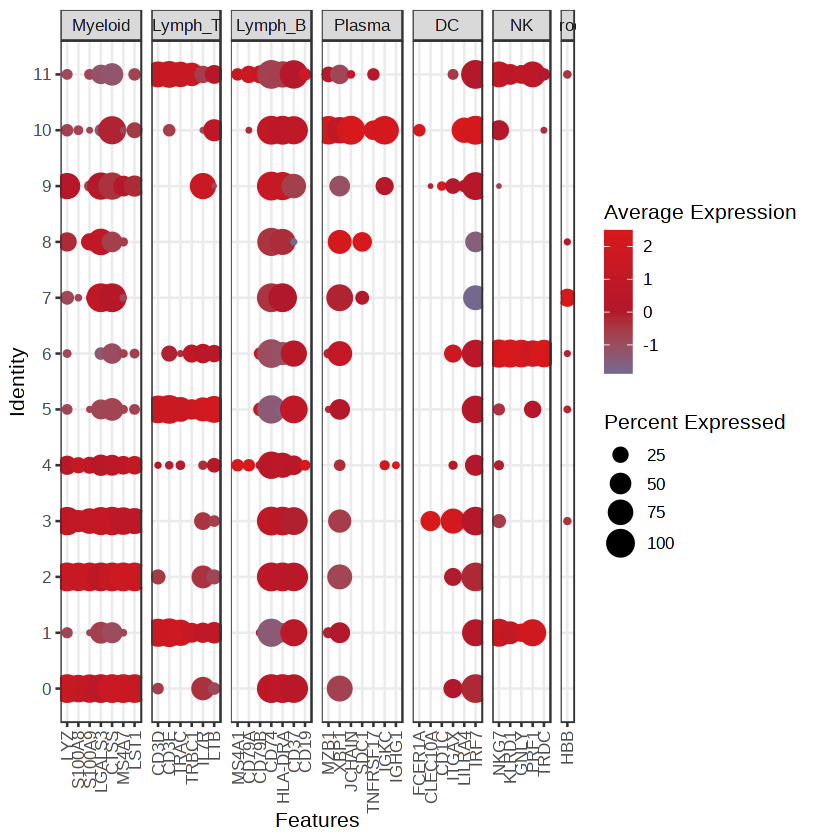

In [ ]:
# Select a set of marker genes for immune cells
genes_markers = list(
  Myeloid = c(
    "LYZ","S100A8","S100A9","LGALS3","CTSS","MS4A7","LST1"
  ),
  Lymph_T = c(
    "CD3D","CD3E","TRAC","TRBC1","IL7R","LTB"
  ),
  Lymph_B = c(
    "MS4A1","CD79A","CD79B","CD74","HLA-DRA","CD37","CD19"
  ),
  Plasma = c(
    "MZB1","XBP1","JCHAIN","SDC1","TNFRSF17","IGKC","IGHG1"
  ),
  DC = c(
    "FCER1A","CLEC10A","CD1C","ITGAX","LILRA4","IRF7"
  ),
  NK = c(
    "NKG7","KLRD1","GNLY","PRF1","TRDC"
  ),
  Erythrocytes = c(
    "HBB","HBA1","HBA2","ALAS2","SLC4A1","AHSP","GYPA"
  )
)

# Note that many of these markers may not appear in our datasets, however
# the combination of these markers allows for more safe annotation.

# Plot figure
scPlot = DotPlot(
  object   = sampleA,
  features = genes_markers,
  group.by = "seurat_clusters",
)

scPlot$data = scPlot$data %>% # Filter out genes with more than 5% in each cluster
  dplyr::filter(pct.exp >= 5)

scPlot = scPlot +
  scale_color_gradient2(
  low = "#2c7bb6",
  mid = "#b2182b",  # Assign a color scale to the dotplot in different levels
  high = "#d7191c") +
  theme_bw(base_size = 12) + # Change non-data graph display
  theme(
    axis.text.x  = element_text(angle = 90) # Change axis x angle
  )


scPlot

scPlot

#ggsave("dotplot_immuneMarkers_facets.png", width = 23, plot = scPlot, bg = 'white')

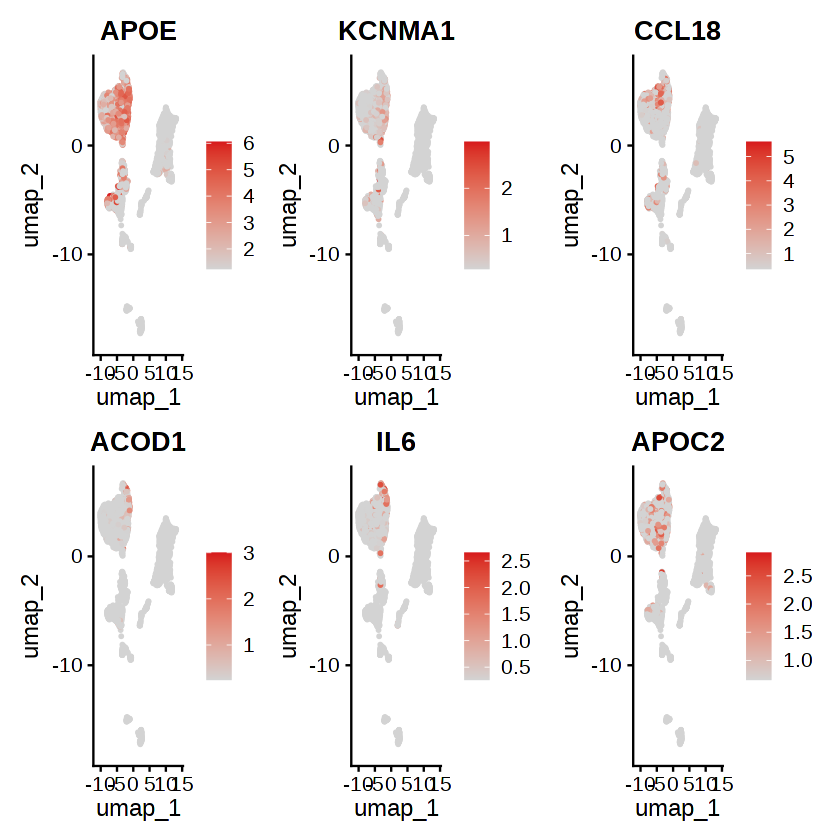

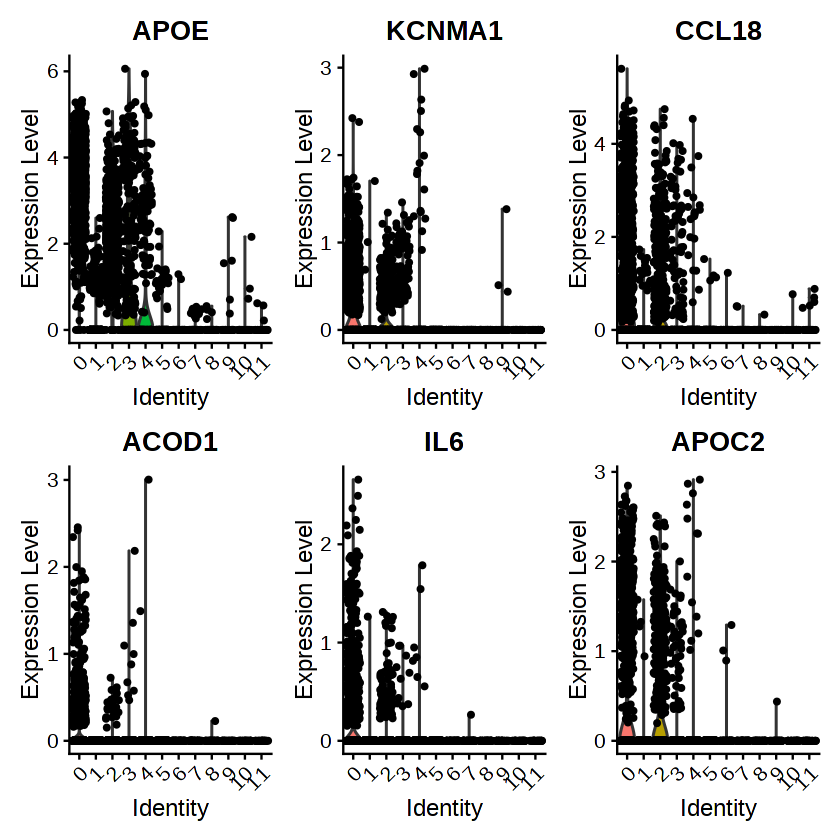

In [ ]:
# It is often useful to visualize the top differentially expressed genes for each cluster.
clt_markers <- sampleA.markers %>%
  group_by(cluster) %>%
  filter(cluster == "0") %>% # Modify the cluster number you plan to annotate.
  top_n(n=6, wt=avg_log2FC) #

 FeaturePlot(sampleA, features = clt_markers$gene, ncol = 3, col = c("lightgray", "#d7191c"), min.cutoff = "q10")

VlnPlot(sampleA, features = clt_markers$gene, ncol = 3, pt.size = 1)

# Differential Abundance

In addition to changes in gene expression, alterations in cellular composition between experimental conditions (treated vs. control) represent an important mechanism to be explored in scRNA-seq studies. Differential abundance analysis aims to identify whether certain cell populations are enriched or not in a given group of interest, as implemented by the [MiloR](https://www.nature.com/articles/s41587-021-01033-z) package.

Changes in abundance may occur even in the absence of changes in gene expression. MiloR infers differential abundance using KNNs, which is appropriate for detecting spatial variations in cell density associated with conditions, avoiding exclusive reliance on rigid clustering in isolation.

Milo is a tool for analysis of complex single cell datasets and diferential experimental conditions. While differential abundance is commonly quantified in discrete cell clusters, Milo uses partially overlapping neighbourhoods of cells on a KNN graph.

Milo analysis consists of 4 steps:
1. Prepare the SingleCellExperiment object: This is necessary before applying the MiloR method.
2. Sampling of representative neighbourhoods.
3. Testing for differential abundance of conditions in all neighbourhoods.
4. Accounting for multiple hypothesis testing using a weighted FDR procedure that accounts for the overlap of neighbourhoods.


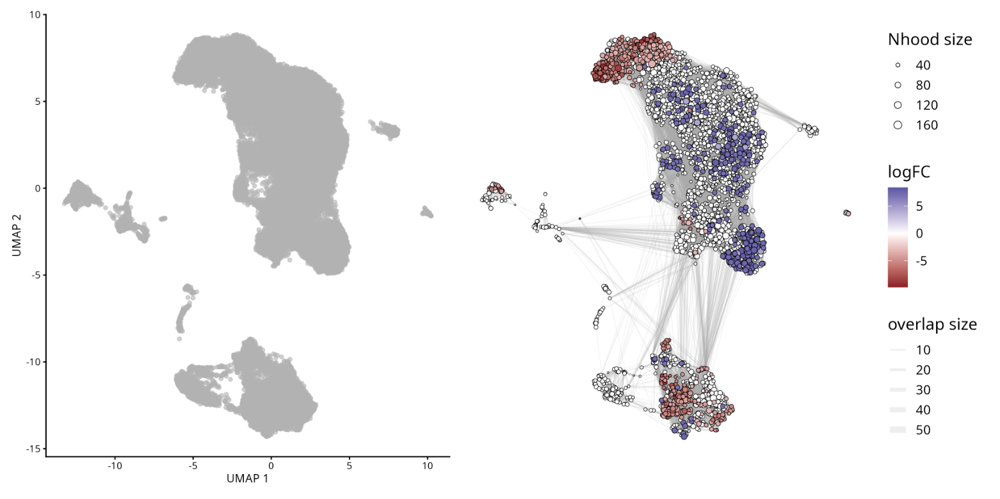

### Do not run in Colab!

To didactic purposes in this step, we will download other samples from our dataset to calculate the differential abundance of cells between mild and severe COVID-19 patients. To avoid making this tutorial too lengthy, we will simplify some steps; however, we strongly recommend that you follow the best practice guidelines developed in SampleA object for the other samples.

In [ ]:
# List of files to process
files <- c(
  "GSM4339769_C141_filtered_feature_bc_matrix.h5",
  "GSM4339770_C142_filtered_feature_bc_matrix.h5",
  "GSM4339771_C143_filtered_feature_bc_matrix.h5",
  "GSM4339773_C145_filtered_feature_bc_matrix.h5"
)

# Initialize an empty list to store Seurat objects
sc_list <- list() # Create an empty list to store Seurat objects

for (i in files){
    sample_name <- strsplit(i, "_")[[1]][2]   # Extract sample name from the filename
    sc_data <- Read10X_h5(paste0("scRNAseq/", i))   # Read the 10X data
    sc_seurat <- CreateSeuratObject(counts = sc_data, project=sample_name, min.cells=3, min.features=200)   # Create Seurat object

    sc_seurat[["percent.mt"]] <- PercentageFeatureSet(sc_seurat, pattern="^MT-")  # Calculate percentage of mitochondrial genes

    sc_seurat <- subset(sc_seurat, nCount_RNA > 500 & nFeature_RNA < 7000 & percent.mt < 10)  # Filter cells based on QC metrics

    sc_list[[sample_name]] <- sc_seurat # Store the Seurat object in the list with sample name as key
}

# Merge all Seurat objects in the list into a single Seurat object
sc_merged <- merge(
  x = sc_list[[1]], # sample 1
  y = c(sc_list[[2]], sc_list[[3]], sc_list[[4]]), # sample 2, 3, and 4
  add.cell.ids = names(sc_list) # Use sample names as cell ID prefixes
)
# Display the first few rows of the merged Seurat object metadata
head(sc_merged)

ERROR: Error in Read10X_h5(paste0("scRNAseq/", i)): File not found


In [ ]:
# Add a new metadata column 'condition' based on the sample identifiers
sc_merged$condition <- ifelse(grepl("^(C141|C142)", sc_merged$orig.ident), "mild", "severe")
sc_merged

# Check the number of cells from each sample
table(sc_merged$orig.ident)
table(sc_merged$condition)

In [ ]:
# Normalize and identify variable features for the merged dataset
sc_merged <- FindVariableFeatures(sc_merged, selection.method = "vst", nfeatures = 3000)
# Run the standard workflow for visualization and clustering
sc_merged = NormalizeData(sc_merged, verbose = FALSE)
all.genes <- rownames(sc_merged)
sc_merged <- ScaleData(sc_merged, features = all.genes, verbose = FALSE)
sc_merged <- RunPCA(sc_merged, features = VariableFeatures(sc_merged), verbose = FALSE)
sc_merged <- FindNeighbors(sc_merged, dims=1:30, verbose = FALSE)
sc_merged <- FindClusters(sc_merged, resolution=0.8, verbose = FALSE)

# Run UMAP for dimensionality reduction
sc_merged <- RunUMAP(sc_merged, dims=1:30, verbose = FALSE)

In [ ]:
# Join layers before running Harmony Integration
sc_merged[["RNA"]] <- JoinLayers(sc_merged[["RNA"]], verbose = FALSE)

# Run Harmony integration to
sc_merged <- harmony::RunHarmony(sc_merged,
                                "orig.ident", # correct for batch effects based on samples
                                reduction.save = "pca", # save new PCA reduction
                                verbose = FALSE)

sc_merged <- FindNeighbors(sc_merged, dims = 1:30, verbose = FALSE) # Find neighbors based on Harmony PCA
sc_merged <- FindClusters(sc_merged,resolution = 0.8, verbose = FALSE) # Find clusters in 0.8 resolution

# Run UMAP on Harmony embeddings
sc_merged <- RunUMAP(sc_merged, dims = 1:30, verbose = FALSE)

In [ ]:
# Dimplot colored by clusters and samples
DimPlot(
  sc_merged,
  group.by = c("seurat_clusters", "orig.ident")
)

#ggsave("UMAP_COVID19_Clusters_Samples.png", width = 10, height = 5, bg = 'white')

In [ ]:
# Load miloR package
library(miloR)
# Convert Seurat object to SingleCellExperiment
sce <- as.SingleCellExperiment(sc_merged)

# Create a Milo object from the SingleCellExperiment
milo <- miloR::Milo(sce)
milo

In [ ]:
# Build the kNN graph for milo object
milo <- buildGraph(milo,
                    k = 20,  # number of nearest neighbors to use in our dataset
                    d = 30,  # number of dimensions to use in our dataset
                    reduced.dim = "PCA") # reduced dimension to use

In [ ]:
# Define neighborhoods in the milo object
milo <- makeNhoods(milo,
                    prop = 0.1, # proportion of cells to include in each neighborhood
                    knn = 20,  # number of nearest neighbors to use in our dataset
                    d = 30,  # number of dimensions to use in our dataset
                    refined = TRUE) # whether to refine neighborhoods

In [ ]:
# Plot neighborhood size histogram
plotNhoodSizeHist(milo)

In [ ]:
# Count cells in each neighborhood, adding metadata from the original Seurat object
milo <- countCells(milo, meta.data = as.data.frame(colData(milo)),
                   sample = "orig.ident") # specify the sample identifier column

# Display the first few rows of neighborhood counts
head(nhoodCounts(milo))

In [ ]:
# Create a design data frame for differential abundance testing
milo_design <- data.frame(colData(milo))[,c("orig.ident", "condition")] # select relevant columns
milo_design$condition <- factor(milo_design$condition, levels = c("mild", "severe")) # convert condition to factor (mild is a baseline)

# Remove duplicate rows to ensure unique sample-condition pairs
milo_design <- dplyr::distinct(milo_design)
rownames(milo_design) <- milo_design$orig.ident # set row names to sample identifiers

# Return the milo_design data frame
milo_design

In [ ]:
# Perform differential abundance testing using miloR
milo <- calcNhoodDistance(milo,
                            d=30) # calculate neighborhood distances

In [ ]:
rownames(milo_design) <- milo_design$orig.ident # ensure row names match sample identifiers in milo object
da_results <- testNhoods(milo, design = ~ condition, design.df = milo_design) # test for differential abundance

# Display the first few rows of differential abundance results
da_results %>%
  arrange(- SpatialFDR) %>%
  head()

In [ ]:
# Build neighborhood graph for visualization
milo <- buildNhoodGraph(milo)

# Plot UMAP with differential abundance results
plotUMAP(milo) + plotNhoodGraphDA(milo, da_results,
                                          alpha=0.05) + # significance threshold < 5%
  plot_layout(guides="collect")

#ggsave("plotUMAP_with_DA_results.png", plot = last_plot(), width = 8, height = 6, bg = 'white')

# GO Enrichment Analyses

Enrichment analysis is a powerful tool for extracting biologically relevant information from single-cell datasets, facilitating the discovery of key genes, pathways, and cellular processes. In scRNA-seq, researchers often deal with complex tissues composed of various cell types. This analysis can reveal novel biological insights by highlighting unexpected associations between gene sets and Gene Ontology (GO) terms, providing a deeper understanding of cellular functions and disease mechanisms.

GO Enrichment Analysis is a method used to identify overrepresented GO terms within a set of genes. This analysis helps to determine whether certain biological processes, molecular functions, or cellular components are significantly associated with the genes of interest.

Gene Ontology (GO) is a comprehensive system that categorizes genes into hierarchical categories based on:

* Biological Processes (BP): The biological objectives the gene contributes to, such as cell cycle, apoptosis, or metabolism.

* Molecular Functions (MF): The molecular activities performed by the gene product, such as binding or catalytic activity.

* Cellular Components (CC): The location within the cell where the gene product is active, such as the nucleus or mitochondrion.



In [ ]:
#Filter genes
my.genes = sampleA.markers %>%
  filter(abs(avg_log2FC) > 1, # This condition retains rows where the absolute value of the average log2 fold change is greater than 1
         p_val_adj < 0.10) %>% # This condition retains rows where the adjusted p-value is less than 0.10
  dplyr::select(gene) %>% # The select function from the dplyr package is used to select the gene column from the filtered data frame.
  pull() # The pull function extracts the values from the selected gene column as a vector

# Display the firsts few rows
head(my.genes)

[1] "CFD"   "PILRA" "APOE"  "C1QC"  "APOC1" "CD163"

In [ ]:
nrow(sampleA.markers) # This function returns the number of rows
genes <- sampleA.markers %>% arrange(desc(avg_log2FC)) # Sort the data frame in descending order based on the average log2 fold change column.
# Display the firsts few rows
head(genes)

[1] 24434

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
HIST1H3B,0,12.65404,0.645,0.000,0,11,HIST1H3B
AKAP14,0,12.57118,0.986,0.000,0,7,AKAP14
FGF14,0,12.09962,0.901,0.000,0,7,FGF14
MUC5AC,0,12.07366,0.571,0.003,0,8,MUC5AC
ARMC4,0,12.07069,0.944,0.001,0,7,ARMC4
DNAH2,0,11.91161,0.986,0.001,0,7,DNAH2


In [ ]:
library(clusterProfiler) # Provides functions for biological term classification and enrichment analysis.

#Convert Gene Identifiers
my.map = bitr(my.genes, # This function converts gene identifiers from one type to another
              fromType="SYMBOL", # Specifies that the input gene identifiers are gene symbols
              toType="ENTREZID", # Specifies that the output should be Entrez IDs
              OrgDb="org.Hs.eg.db") # Specifies the organism database for human genes
# Display the First Few Entries
head(my.map)

# Calculate the Number of Genes Not Mapped
length(my.genes) - nrow(my.map)



'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(my.genes, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db"):
“7.46% of input gene IDs are fail to map...”


,SYMBOL,ENTREZID
,<chr>,<chr>
1,CFD,1675
2,PILRA,29992
3,APOE,348
4,C1QC,714
5,APOC1,341
6,CD163,9332


[1] 2225

### GO Classification

In [ ]:
## subontologies: Biological Process (BP), Molecular Function (MF), Cellular Component (CC)
library(org.Hs.eg.db) # library, which contains annotations for human genes.
# groups genes based on their GO terms
ggo_bp = groupGO(gene     = my.map$ENTREZID, # Specifies the list of gene ENTREZ ID to be grouped
                 OrgDb    = org.Hs.eg.db, # Specifies the organism database for human genes
                 ont      = "BP", # Specifies that the GO grouping should be based on the "Biological Process" subontology.
                 readable = TRUE) # Converts the Entrez IDs to gene symbols for easier interpretation.

# displays the first few entries of the ggo_bp object
head(ggo_bp)

Loading required package: AnnotationDbi


Attaching package: ‘AnnotationDbi’


The following object is masked from ‘package:clusterProfiler’:

    select


The following object is masked from ‘package:dplyr’:

    select




ID         Description                      Count GeneRatio
GO:0002376 GO:0002376 immune system process            1080  1080/5988
GO:0009987 GO:0009987 cellular process                 5193  5193/5988
GO:0016032 GO:0016032 viral process                     171  171/5988 
GO:0022414 GO:0022414 reproductive process              550  550/5988 
GO:0032501 GO:0032501 multicellular organismal process 2358  2358/5988
GO:0032502 GO:0032502 developmental process            2235  2235/5988
           geneID                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

In [ ]:
## subontologies: BP, MF, CC
ggo_mf = groupGO(gene     = my.map$ENTREZID,  # Specifies the list of gene ENTREZ ID to be grouped
                 OrgDb    = org.Hs.eg.db, # Specifies the organism database for human genes
                 ont      = "MF", # Specifies that the GO grouping should be based on the "Molecular Function" subontology.
                 readable = TRUE) # Converts the Entrez IDs to gene symbols for easier interpretation.

# displays the first few entries of the ggo_mf object
head(ggo_mf)

ID         Description                  Count GeneRatio
GO:0003774 GO:0003774 cytoskeletal motor activity    62  62/5988  
GO:0003824 GO:0003824 catalytic activity           1912  1912/5988
GO:0005198 GO:0005198 structural molecule activity  188  188/5988 
GO:0005215 GO:0005215 transporter activity          357  357/5988 
GO:0005488 GO:0005488 binding                      5252  5252/5988
GO:0009055 GO:0009055 electron transfer activity     42  42/5988  
           geneID                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

In [ ]:
## subontologies: BP, MF, CC
ggo_cc = groupGO(gene     = my.map$ENTREZID, # Specifies the list of gene ENTREZ ID to be grouped
                 OrgDb    = org.Hs.eg.db, # Specifies the organism database for human genes
                 ont      = "CC", # Specifies that the GO grouping should be based on the "Cellular Component" subontology.
                 readable = TRUE) # Converts the Entrez IDs to gene symbols for easier interpretation.


# displays the first few entries of the ggo_cc object
head(ggo_cc)

ID         Description                   Count GeneRatio
GO:0032991 GO:0032991 protein-containing complex    1893  1893/5988
GO:0044423 GO:0044423 virion component                 0  0/5988   
GO:0110165 GO:0110165 cellular anatomical structure 5562  5562/5988
           geneID                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

### GO over-representation analysis

In [ ]:
# This function performs GO enrichment analysis on a given set of genes.
ego <- enrichGO(gene          = my.map$ENTREZID, # Specifies the list of gene ENTREZ ID to be grouped
                OrgDb         = org.Hs.eg.db, # Specifies the organism database for human genes
                ont           = "BP", # Specifies that the GO grouping should be based on the "Biological Process" subontology.
                pAdjustMethod = "BH", # The method used for adjusting p-values to control the false discovery rate (FDR)
                pvalueCutoff  = 0.01, # The p-value threshold for significance
                qvalueCutoff  = 0.05, # The q-value threshold for significance
        readable      = TRUE) # Converts the Entrez IDs to gene symbols for easier interpretation.

# displays the first few entries of the ego object
head(ego)

,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>
GO:0044782,GO:0044782,cilium organization,261/5304,441/18860,0.5918367,2.104457,14.680149,3.323204e-43,2.104917e-39,1.490894e-39,SNX10/CCDC88A/SYNE2/ODF2L/CCDC88C/EHD1/CYLD/LIMA1/RILP/OCRL/CLCN4/PTPDC1/NECTIN2/ATP6V0D1/YIF1B/TMEM138/SNAP29/MKKS/TTC39C/ABLIM1/DNAI1/CFAP221/HYDIN/RSPH4A/CFAP43/RSPH9/DRC1/DNAH5/CFAP157/ZMYND10/RSPH1/LRRC46/ERICH3/DNAH2/NME5/RP1/TEKT1/TEKT2/SPAG17/CFAP126/DNAH7/MAPK15/DNAI2/FOXJ1/CFAP53/DNAH12/CEP126/SPAG6/CFAP73/CFAP44/DNAH3/MNS1/UBXN10/SPEF1/CFAP46/CFAP65/LCA5/CFAP70/BBOF1/CCDC181/TTC29/DNAJB13/DNAAF3/CFAP100/CFAP57/CCDC40/CCDC39/DRC7/CFAP74/CFAP54/CFAP69/LCA5L/KIF19/CFAP47/IQUB/TEKT4/DAW1/WDR90/CFAP58/CFAP61/CFAP161/LRRC49/PARVA/CCNO/CFAP206/TEKT3/YAP1/DCDC2/DZIP1/LRGUK/TUB/MEIG1/TMEM231/FAM161A/CATIP/TMEM67/UNC119B/B9D1/DNAH1/DYNC2H1/DNALI1/IFT172/SPEF2/IFT140/RAB17/IFT81/WDR19/RPGRIP1L/RABL2A/LAMA5/DMD/TRAF3IP1/SPACA9/CCDC146/INTU/RFX2/DNAL1/KIF24/TTC12/ZMYND12/TCTN2/MAK/RFX3/ROPN1B/KIF27/FNBP1L/CROCC/ENKD1/TTC21A/IFT88/SPAG1/CCDC13/SPATA6/WDR35/ARL6/IFT80/STK36/SPAG16/BBS5/DYNC2LI1/ARMC2/IFT46/KIF3A/CEP97/RPGR/CLUAP1/IFT22/DNAAF1/IFT122/TMEM17/ARMC9/RABL2B/FUZ/CC2D2A/TCTN1/DZIP1L/DNAAF4/RAB3IP/CBY1/TTLL5/CDC14B/TOGARAM1/CPLANE1/LRRC23/CEP89/IFT57/ARL3/KIF3B/CEP83/INPP5E/B9D2/NME7/DNAAF2/DNMBP/IFT43/IFT27/WDPCP/WWTR1/TTLL3/NEK1/BBS12/BBS9/TTC21B/CCP110/CFAP298/CEP41/KIAA0753/MKS1/LRRC61/ODF2/CEP70/TTBK2/CFAP20/TMEM237/CEP19/DNAAF5/ARL13B/IFT74/TMEM107/BBIP1/CEP290/CEP131/BBS4/DNHD1/DYNLL1/CEP162/KIFAP3/IQCB1/TBC1D32/CDC14A/PIBF1/PCM1/CCDC57/TTC8/RAB11FIP3/TRIM32/BBS1/JHY/IFT52/AHI1/TTLL1/C2CD3/TPGS2/LIMK2/IFT20/CCDC66/CEP78/CEP164/FAM161B/BBS10/PPP1R35/FBF1/SSX2IP/TCTN3/TCHP/VDAC3/PKD2/BBS2/OFD1/CDKL5/ATXN10/CEP135/FAM149B1/CDK10/TAPT1/GSN/CCDC28B/ABCC4/CEP350/ACTR3/MAP4/NME8/TTC17/CDK1/PLK4/AURKA/POC1A/CCDC15/MPHOSPH9/CEP128/PCNT,261
GO:0060271,GO:0060271,cilium assembly,240/5304,408/18860,0.5882353,2.091651,13.944005,3.582867e-39,1.134694e-35,8.036936e-36,SNX10/CCDC88A/SYNE2/ODF2L/EHD1/CYLD/LIMA1/RILP/OCRL/CLCN4/PTPDC1/ATP6V0D1/YIF1B/TMEM138/SNAP29/MKKS/TTC39C/ABLIM1/DNAI1/CFAP221/HYDIN/RSPH4A/CFAP43/RSPH9/DRC1/DNAH5/CFAP157/ZMYND10/RSPH1/LRRC46/ERICH3/DNAH2/NME5/RP1/TEKT1/TEKT2/SPAG17/DNAH7/MAPK15/DNAI2/FOXJ1/CFAP53/DNAH12/CEP126/SPAG6/CFAP73/CFAP44/DNAH3/MNS1/UBXN10/SPEF1/CFAP46/CFAP65/CFAP70/BBOF1/CCDC181/DNAJB13/DNAAF3/CFAP100/CFAP57/CCDC40/CCDC39/DRC7/CFAP74/CFAP54/CFAP69/CFAP47/IQUB/TEKT4/DAW1/WDR90/CFAP58/CFAP61/CFAP161/PARVA/CCNO/CFAP206/TEKT3/YAP1/DCDC2/DZIP1/LRGUK/MEIG1/TMEM231/FAM161A/TMEM67/UNC119B/B9D1/DNAH1/DYNC2H1/DNALI1/IFT172/SPEF2/IFT140/RAB17/IFT81/WDR19/RPGRIP1L/RABL2A/LAMA5/DMD/TRAF3IP1/SPACA9/CCDC146/INTU/RFX2/DNAL1/KIF24/TTC12/ZMYND12/TCTN2/MAK/RFX3/KIF27/FNBP1L/CROCC/ENKD1/IFT88/SPAG1/CCDC13/SPATA6/WDR35/ARL6/IFT80/STK36/SPAG16/BBS5/DYNC2LI1/ARMC2/IFT46/KIF3A/CEP97/RPGR/CLUAP1/IFT22/DNAAF1/IFT122/TMEM17/ARMC9/RABL2B/FUZ/CC2D2A/TCTN1/DZIP1L/DNAAF4/RAB3IP/CBY1/TTLL5/CDC14B/TOGARAM1/CPLANE1/LRRC23/CEP89/IFT57/ARL3/KIF3B/CEP83/INPP5E/B9D2/NME7/DNAAF2/DNMBP/IFT43/IFT27/WDPCP/WWTR1/TTLL3/NEK1/BBS9/TTC21B/CCP110/CFAP298/CEP41/KIAA0753/MKS1/LRRC61/ODF2/CEP70/TTBK2/CFAP20/TMEM237/CEP19/DNAAF5/ARL13B/IFT74/TMEM107/BBIP1/CEP290/CEP131/BBS4/DNHD1/DYNLL1/CEP162/IQCB1/TBC1D32/CDC14A/PIBF1/PCM1/CCDC57/TTC8/RAB11FIP3/TRIM32/BBS1/JHY/IFT52/AHI1/TTLL1/C2CD3/LIMK2/IFT20/CCDC66/CEP164/BBS10/PPP1R35/FBF1/SSX2IP/TCTN3/TCHP/VDAC3/BBS2/OFD1/CDKL5/ATXN10/CEP135/FAM149B1/CDK10/TAPT1/GSN/CCDC28B/ABCC4/CEP350/ACTR3/MAP4/NME8/PLK4/POC1A/CCDC15/MPHOSPH9/CEP128/PCNT,240
GO:0007018,GO:0007018,microtubule-based movement,258/5304,496/18860,0.5201613,1.849593,11.993985,6.090563e-30,1.285921e-26,9.108063e-27,DEFB1/DST/PLTP/SYNE2/SUN2/ATP2B4/KIF21A/CCDC88C/KIF2A/HSPB1/ADCY3/KIF13A/BLOC1S3/CATSPER1/ARL8B/RAB1A/HIF1A/TUBA1A/KIFC3/ARL8A/YIF1B/LAMP1/CCNYL1/KIF1B/MKKS/CCR6/DNAI1/CFAP221/HYDIN/RSPH4A/CFAP43/RSPH9/ENKUR/DRC1/CFAP45/DNAH5

## GO enrichment in another organisms

Importantly, pathway enrichment analysis is not restricted to human or animal models. For non-model organisms and plants, a wide range of dedicated databases and functional annotations are available, enabling robust interpretation of transcriptomic data across diverse species. In plant research, enrichment analyses commonly rely on plant-specific pathway repositories and Gene Ontology annotations tailored to species such as Arabidopsis thaliana, rice, and maize. These resources are essential for investigating key biological processes, including plant development, stress and immune responses, hormone signaling, and metabolic adaptations to environmental cues.

From a technical perspective, any gene identifier type supported by an appropriate OrgDb object can be directly used in GO-based analyses within the Bioconductor ecosystem. This flexibility allows seamless functional annotation across multiple organisms and identifier systems.

Several curated pathway databases further expand the scope of enrichment analyses across taxa. [WikiPathways](https://www.wikipathways.org/) is an open, community-driven platform dedicated to the curation of biological pathways, offering broad organismal coverage ranging from vertebrates to bacteria and plants. By adopting a collaborative curation model, WikiPathways complements established pathway resources such as KEGG, Reactome, and Pathway Commons.

In the context of plant biology, [Plant Reactome](https://plantreactome.gramene.org/) provides an open-source, open-access, manually curated and peer-reviewed pathway database encompassing more than 100 plant species. For organisms lacking a dedicated OrgDb package in Bioconductor (e.g., species without an available annotation database analogous to org.Mm.eg.db in mouse), users can retrieve organism-specific annotations—when available—through online resources such as [AnnotationHub](https://www.bioconductor.org/packages/release/bioc/html/AnnotationHub.html), ensuring that enrichment analyses remain accessible even for less-characterized species.







